<a href="https://colab.research.google.com/github/rydr0/Sat_Image_Dataset/blob/master/TrainClassification_16classes_final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Intro and References

Note - all data and helper files used in this analysis are available at: https://github.com/rydr0/Sat_Image_Dataset
This notebook is designed to be used on Google Colab and files from that repository are cloned to Colab's storage.


Packages Used and Works Consulted:

\begin{enumerate}
\item PyTorch Documentation - https://pytorch.org/docs/stable/index.html
\item Imbalanced Dataset Sampler - https://github.com/ufoym/imbalanced-dataset-sampler
\item Shapefile dataframes and visualisation using GeoPandas - https://geopandas.org/
\item NN summary with pytorch-summary https://github.com/sksq96/pytorch-summary
\item Confusion matrices -  https://www.kaggle.com/agungor2/various-confusion-matrix-plots
\item scikit-learn for metrics and image processing - https://scikit-learn.org/stable/modules/classes.html
\item matplotlib changing font sizes - https://stackoverflow.com/a/39566040
\item display_layer_activations functions - https://blog.paperspace.com/pytorch-hooks-gradient-clipping-debugging/ 
and https://cs231n.github.io/understanding-cnn/
\item Model Training Loops from Pytorch Ignite - https://pytorch.org/ignite/
\item GDAL documentation for splitting images - https://gdal.org/
\item Calculating class weights: make_weights_for_balanced_classes - https://discuss.pytorch.org/t/balanced-sampling-between-classes-with-torchvision-dataloader/2703/3
\item VGG Pytorch Implementation - https://github.com/pytorch/vision/blob/master/torchvision/models/vgg.py
\item Google Earth Engine Python API -https://developers.google.com/earth-engine/guides
\item Folium for Earth Engine Visualiation - https://python-visualization.github.io/folium/

\end{enumerate}


In [ ]:
# Mount Google Drive - necessary for model checkpointing and loading
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly&response_type=code

Enter your authorization code:
4/4AGqhUrvhP5-6TDtkJU_Fjhb3IkSSk9zT6It00Cjjq8PMWmePNXEB6c
Mounted at /content/drive


# Imports and setup

In [ ]:
# Check which GPU using on Google colab
!nvidia-smi

Fri Sep 11 02:19:38 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 450.66       Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   40C    P0    27W / 250W |      0MiB / 16280MiB |      0%      Default |
|                               |                      |                 ERR! |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
# Load Github Repository with Satellite Images, Population Labels and Helper files
! git clone https://github.com/rydr0/Sat_Image_Dataset.git

Cloning into 'Sat_Image_Dataset'...
remote: Enumerating objects: 92, done.
remote: Counting objects: 100% (92/92), done.
remote: Compressing objects: 100% (69/69), done.
remote: Total 138637 (delta 50), reused 62 (delta 23), pack-reused 138545
Receiving objects: 100% (138637/138637), 1.35 GiB | 18.80 MiB/s, done.
Resolving deltas: 100% (71332/71332), done.
Checking out files: 100% (92905/92905), done.


In [ ]:
# Install third-party libraries
!pip install pytorch.ignite
!pip install geopandas
!pip install gdal

     |████████████████████████████████| 174kB 7.0MB/s 
     |████████████████████████████████| 972kB 7.2MB/s 
     |████████████████████████████████| 14.8MB 180kB/s 
     |████████████████████████████████| 10.9MB 17.6MB/s 


In [ ]:
# Import packages
from torchsummary import summary
from torchvision import datasets, transforms
import torchvision.transforms as transforms
import torchvision
from torch.autograd import Variable
import torch.optim as optim
import torch.nn as nn
import torch
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sn
import sys
import geopandas as gpd
import gdal
import pprint


from ignite.engine import Engine, Events, create_supervised_trainer, create_supervised_evaluator
from ignite.metrics import Loss, RunningAverage
from ignite.contrib.handlers import ProgressBar
from ignite.handlers import ModelCheckpoint, Checkpoint

%matplotlib inline

%load_ext autoreload
%autoreload 2

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [ ]:
# Setup so that plots use LaTex font

!apt install texlive-fonts-recommended texlive-fonts-extra cm-super dvipng
import matplotlib
from matplotlib import rc
import matplotlib.pyplot as plt
%matplotlib inline

rc('text', usetex=True)
matplotlib.rcParams['text.latex.preamble'] = [r'\usepackage{amsmath}']
!apt install texlive-fonts-recommended texlive-fonts-extra cm-super dvipng

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following package was automatically installed and is no longer required:
  libnvidia-common-440
Use 'apt autoremove' to remove it.
The following additional packages will be installed:
  cm-super-minimal fonts-adf-accanthis fonts-adf-berenis fonts-adf-gillius
  fonts-adf-universalis fonts-cabin fonts-comfortaa fonts-croscore
  fonts-crosextra-caladea fonts-crosextra-carlito fonts-dejavu-core
  fonts-dejavu-extra fonts-droid-fallback fonts-ebgaramond
  fonts-ebgaramond-extra fonts-font-awesome fonts-freefont-otf
  fonts-freefont-ttf fonts-gfs-artemisia fonts-gfs-complutum fonts-gfs-didot
  fonts-gfs-neohellenic fonts-gfs-olga fonts-gfs-solomos fonts-go
  fonts-junicode fonts-lato fonts-linuxlibertine fonts-lmodern fonts-lobster
  fonts-lobstertwo fonts-noto-hinted fonts-noto-mono fonts-oflb-asana-math
  fonts-open-sans fonts-roboto-hinted fonts-sil-gentium
  fonts-sil-gentium-basic fonts-s

In [ ]:
# Load functions from Helper Files
sys.path.append('/content/Sat_Image_Dataset')
from DatasetandDataLoader import *
from Helpers import *
from Training_Classification import *
from Visualisation import *
from Neural_Network import *

# Load Datasets

In [ ]:
# Load dataset to be used in training
train_dataset_model, test_dataset, sat_mean, sat_std = load_datasets(
    flip=False, classes=16)

Mean for image channels:
tensor([[[[ 481.4347]],

         [[ 661.0318]],

         [[ 633.2782]],

         [[2610.5615]],

         [[1754.3627]],

         [[2808.4644]],

         [[ 987.0544]]]], dtype=torch.float64)
Standard deviation for image channels:
tensor([[[[182.0427]],

         [[221.7736]],

         [[282.7514]],

         [[989.6967]],

         [[604.5539]],

         [[463.1821]],

         [[403.9931]]]], dtype=torch.float64)
NAN pixel values found and replaced:1944166
Percentage of total pixels:0.026875179981978577
Training Set Images: 37994
NAN pixel values found and replaced:442414
Percentage of total pixels:0.025244303949147805
Test Set Images: 8450


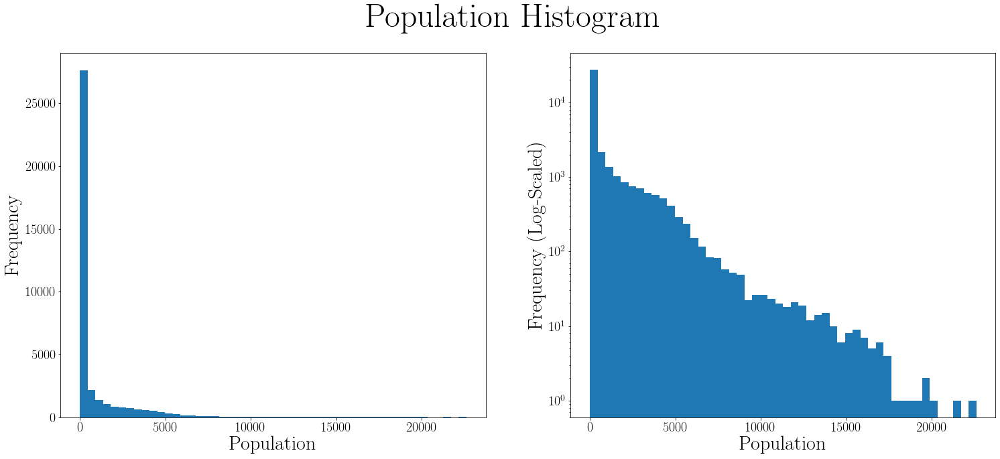

In [ ]:
# Plot training set population histogram

hist1 = population_hist(train_dataset_model, bins=50)
plt.savefig("Population Hist - Tr")

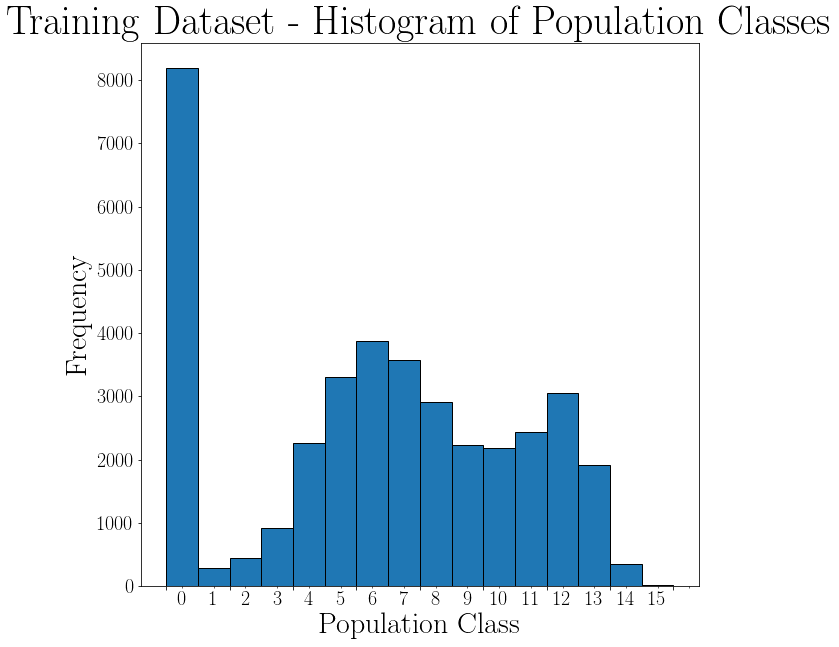

In [ ]:
# Plot training set class histogram

hist2 = class_hist(train_dataset_model)
plt.title("Training Dataset - Histogram of Population Classes")
plt.ylabel("Frequency")
plt.xlabel("Population Class")
plt.show()

In [ ]:
# Amount of samples in each class
print(hist2)

(array([8185.,  290.,  446.,  921., 2266., 3311., 3883., 3572., 2916.,
       2237., 2182., 2440., 3055., 1912.,  355.,   23.]), array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16]), <a list of 16 Patch objects>)


# Prepare DataLoader, Batches and Hyperparameters

In [ ]:
# Calculate number of training and validation samples
num_samples = len(train_dataset_model)

# 90/10 train/validation split
train_samples = int(len(train_dataset_model) * 0.9)
val_samples = num_samples - train_samples
print("""Total Samples: {total}
Training Samples: {train}
Validation Samples: {val}""".format(total=num_samples,
                                    train=train_samples,
                                    val=val_samples))

Total Samples: 37994
Training Samples: 34194
Validation Samples: 3800


In [ ]:
# Set Random seed for consistent training/validation dataset split
seed = 121
np.random.seed = seed
torch.manual_seed(seed)
indices = np.arange(num_samples)
np.random.shuffle(indices)

In [ ]:
# Find weights for each point and each class in dataset
train_subset = torch.utils.data.Subset(train_dataset_model, indices[:train_samples])
balance_weights, weight_per_class = make_weights_for_balanced_classes(train_subset, 16)

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[7302, 264, 404, 828, 2019, 2997, 3493, 3229, 2622, 2014, 1979, 2200, 2769, 1729, 322, 23]
[5, 11, 11, 11, 11, 5, 6, 9, 5, 14, 5, 12, 12, 4, 0, 0, 9, 4, 4, 13, 11, 4, 0, 14, 6, 11, 0, 0, 11, 4, 9, 10, 6, 0, 11, 4, 0, 9, 0, 10, 0, 6, 6, 0, 13, 0, 7, 9, 4, 4, 9, 8, 12, 8, 13, 4, 0, 4, 5, 12, 0, 9, 5, 6, 5, 6, 6, 10, 2, 9, 6, 8, 9, 0, 3, 8, 4, 7, 4, 11, 4, 0, 0, 4, 12, 10, 0, 10, 9, 0, 6, 0, 11, 0, 0, 6, 6, 13, 13, 9, 10, 0, 0, 7, 9, 0, 10, 6, 13, 8, 10, 0, 6, 13, 0, 0, 9, 7, 0, 13, 0, 11, 13, 11, 0, 0, 7, 7, 5, 7, 6, 8, 13, 7, 0, 0, 10, 0, 13, 11, 9, 0, 8, 4, 10, 6, 7, 0, 7, 7, 7, 0, 0, 3, 13, 0, 3, 0, 8, 8, 13, 7, 4, 0, 3, 10, 5, 6, 0, 6, 5, 9, 0, 12, 0, 4, 0, 14, 7, 8, 0, 0, 6, 8, 4, 12, 13, 6, 12, 0, 2, 1, 12, 6, 7, 8, 8, 7, 0, 0, 7, 12, 12, 0, 12, 12, 0, 3, 13, 0, 0, 8, 8, 12, 0, 6, 2, 7, 0, 6, 5, 12, 5, 9, 0, 0, 6, 5, 6, 6, 4, 7, 0, 5, 10, 0, 6, 0, 0, 5, 0, 7, 7, 6, 11, 7, 5, 6, 12, 12, 0, 0, 12, 0, 13, 0, 5, 10, 6, 0, 3, 7, 2, 5, 12,

In [ ]:
# Create training and validation samplers and a balanced training set sampler
sys.path.append('/content/Sat_Image_Dataset/imbalanced-dataset-sampler-master')
from torchsampler import ImbalancedDatasetSampler

balance_weights = torch.DoubleTensor(balance_weights)

tr_sampler = torch.utils.data.SubsetRandomSampler(indices[:train_samples])
val_sampler = torch.utils.data.SubsetRandomSampler(
    indices[train_samples:num_samples])

tr_sampler_balanced = ImbalancedDatasetSampler(
    torch.utils.data.Subset(train_dataset_model, indices[:train_samples]))

In [ ]:
# Batch sizes and initialise DataLoaders

tr_batch_size = 512
val_batch_size = val_samples

train_loader = torch.utils.data.DataLoader(train_dataset_model,
                                           batch_size=tr_batch_size,
                                           shuffle=False,
                                           sampler=tr_sampler)

train_loader_balanced = torch.utils.data.DataLoader(
    train_subset,
    batch_size=tr_batch_size,
    shuffle=False,
    sampler=tr_sampler_balanced)

val_loader = torch.utils.data.DataLoader(train_dataset_model,
                                         batch_size=val_batch_size,
                                         shuffle=False,
                                         sampler=val_sampler)

In [ ]:
print("""Number of Training Batches: {tr_batch}
Number of Validation Batches: {val_batch}""".format(tr_batch=len(train_loader),
                                                    val_batch=len(val_loader)))

Number of Training Batches: 67
Number of Validation Batches: 1


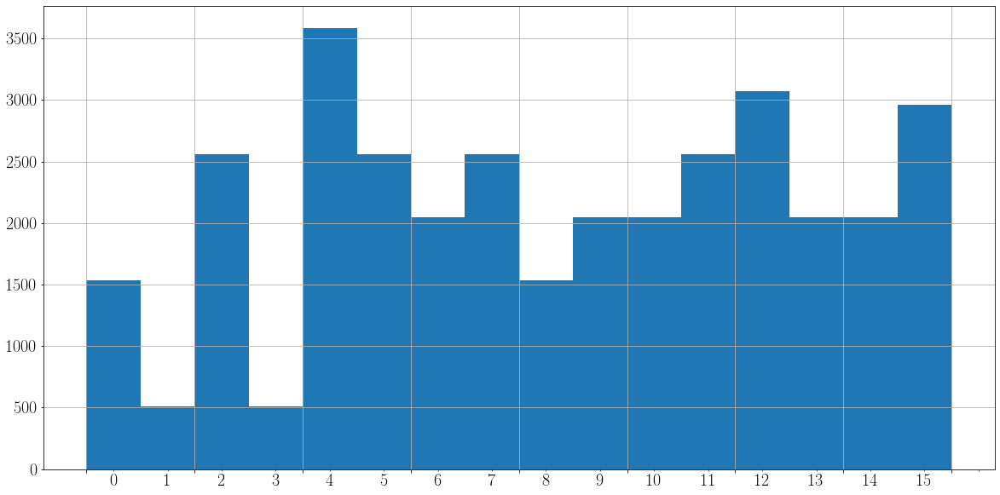

In [ ]:
# Visual check of what the balanced dataset sampler is doing over an epoch
balanced_hist = balanced_class_hist(train_loader_balanced)

# Configurations

# Model - 7 Layers


## RGB Channels only

### Training

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model_rgb = Neural_Network(config='7', rgb=True)
model_rgb = model_rgb.float()
model_rgb.to(device)

summary(model_rgb, input_size=(3, 50, 33))

print("Model Loaded")

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 50, 33]           1,792
              ReLU-2           [-1, 64, 50, 33]               0
         MaxPool2d-3           [-1, 64, 25, 16]               0
            Conv2d-4          [-1, 128, 25, 16]          73,856
              ReLU-5          [-1, 128, 25, 16]               0
         MaxPool2d-6           [-1, 128, 12, 8]               0
            Conv2d-7           [-1, 256, 12, 8]         295,168
              ReLU-8           [-1, 256, 12, 8]               0
            Conv2d-9           [-1, 256, 12, 8]         590,080
             ReLU-10           [-1, 256, 12, 8]               0
        MaxPool2d-11            [-1, 256, 6, 4]               0
AdaptiveAvgPool2d-12            [-1, 256, 7, 7]               0
           Linear-13                 [-1, 4096]      51,384,320
             ReLU-14                 [-

In [ ]:
model_rgb_result = run_training(model_rgb,
                                dataset=train_dataset_model,
                                t_loader=train_loader,
                                v_loader=val_loader,
                                max_epochs=50,
                                flip=False,
                                initial_lr=0.001,
                                pbar=True,
                                checkpoint=False,
                                save_as="7layers_rgb",
                                weight_decay=1e-5,
                                rgb=True)


Epoch: 1 | Learning Rate: 0.001
Training   | Avg loss: 2.1033 | Accuracy: 28.21% | Fbeta: 0.0779
Validation | Avg loss: 2.0768 | Accuracy: 28.87% | Fbeta: 0.0737



Epoch: 2 | Learning Rate: 0.001
Training   | Avg loss: 1.8439 | Accuracy: 35.24% | Fbeta: 0.1544
Validation | Avg loss: 1.8332 | Accuracy: 36.03% | Fbeta: 0.1535



Epoch: 3 | Learning Rate: 0.001
Training   | Avg loss: 1.7626 | Accuracy: 37.20% | Fbeta: 0.2193
Validation | Avg loss: 1.7588 | Accuracy: 38.71% | Fbeta: 0.2241



Epoch: 4 | Learning Rate: 0.001
Training   | Avg loss: 1.7057 | Accuracy: 38.68% | Fbeta: 0.2454
Validation | Avg loss: 1.7222 | Accuracy: 38.79% | Fbeta: 0.2438



Epoch: 5 | Learning Rate: 0.001
Training   | Avg loss: 1.6386 | Accuracy: 40.36% | Fbeta: 0.2448
Validation | Avg loss: 1.6568 | Accuracy: 39.97% | Fbeta: 0.2348



Epoch: 6 | Learning Rate: 0.001
Training   | Avg loss: 1.5994 | Accuracy: 41.16% | Fbeta: 0.2483
Validation | Avg loss: 1.6366 | Accuracy: 40.45% | Fbeta: 0.2394



Epoch: 7 | Learning Rate: 0.001
Training   | Avg loss: 1.5685 | Accuracy: 42.27% | Fbeta: 0.2720
Validation | Avg loss: 1.6019 | Accuracy: 42.16% | Fbeta: 0.2646



Epoch: 8 | Learning Rate: 0.001
Training   | Avg loss: 1.5331 | Accuracy: 43.84% | Fbeta: 0.2849
Validation | Avg loss: 1.5789 | Accuracy: 43.82% | Fbeta: 0.2761



Epoch: 9 | Learning Rate: 0.001
Training   | Avg loss: 1.5489 | Accuracy: 42.85% | Fbeta: 0.2900
Validation | Avg loss: 1.6095 | Accuracy: 42.00% | Fbeta: 0.2817



Epoch: 10 | Learning Rate: 0.001
Training   | Avg loss: 1.5288 | Accuracy: 43.25% | Fbeta: 0.2940
Validation | Avg loss: 1.6407 | Accuracy: 40.00% | Fbeta: 0.2722



Epoch: 11 | Learning Rate: 0.001
Training   | Avg loss: 1.4637 | Accuracy: 46.17% | Fbeta: 0.3242
Validation | Avg loss: 1.5840 | Accuracy: 43.34% | Fbeta: 0.2967



Epoch: 12 | Learning Rate: 0.001
Training   | Avg loss: 1.4364 | Accuracy: 46.60% | Fbeta: 0.3169
Validation | Avg loss: 1.5725 | Accuracy: 43.55% | Fbeta: 0.2944



Epoch: 13 | Learning Rate: 0.001
Training   | Avg loss: 1.4486 | Accuracy: 46.00% | Fbeta: 0.2981
Validation | Avg loss: 1.6219 | Accuracy: 41.79% | Fbeta: 0.2673



Epoch: 14 | Learning Rate: 0.001
Training   | Avg loss: 1.3826 | Accuracy: 48.50% | Fbeta: 0.3329
Validation | Avg loss: 1.6035 | Accuracy: 43.03% | Fbeta: 0.2860



Epoch: 15 | Learning Rate: 0.001
Training   | Avg loss: 1.3729 | Accuracy: 48.91% | Fbeta: 0.3301
Validation | Avg loss: 1.6218 | Accuracy: 42.47% | Fbeta: 0.2853



Epoch: 16 | Learning Rate: 0.001
Training   | Avg loss: 1.3180 | Accuracy: 51.08% | Fbeta: 0.3574
Validation | Avg loss: 1.6287 | Accuracy: 42.84% | Fbeta: 0.2889



Epoch: 17 | Learning Rate: 0.001
Training   | Avg loss: 1.3140 | Accuracy: 50.85% | Fbeta: 0.3588
Validation | Avg loss: 1.6242 | Accuracy: 42.39% | Fbeta: 0.2911



Epoch: 18 | Learning Rate: 0.001
Training   | Avg loss: 1.2866 | Accuracy: 52.09% | Fbeta: 0.3659
Validation | Avg loss: 1.6457 | Accuracy: 43.29% | Fbeta: 0.2854



Epoch: 19 | Learning Rate: 0.001
Training   | Avg loss: 1.2652 | Accuracy: 51.99% | Fbeta: 0.3727
Validation | Avg loss: 1.7194 | Accuracy: 39.97% | Fbeta: 0.2794



Epoch: 20 | Learning Rate: 0.001
Training   | Avg loss: 1.2471 | Accuracy: 54.32% | Fbeta: 0.3981
Validation | Avg loss: 1.7233 | Accuracy: 40.47% | Fbeta: 0.2919



Epoch: 21 | Learning Rate: 0.001
Training   | Avg loss: 1.2056 | Accuracy: 55.43% | Fbeta: 0.4012
Validation | Avg loss: 1.6963 | Accuracy: 42.16% | Fbeta: 0.2931



Epoch: 22 | Learning Rate: 0.001
Training   | Avg loss: 1.1426 | Accuracy: 56.81% | Fbeta: 0.4041
Validation | Avg loss: 1.8205 | Accuracy: 40.42% | Fbeta: 0.2831



Epoch: 23 | Learning Rate: 0.001
Training   | Avg loss: 1.0944 | Accuracy: 59.82% | Fbeta: 0.4442
Validation | Avg loss: 1.8010 | Accuracy: 41.66% | Fbeta: 0.2857



Epoch: 24 | Learning Rate: 0.001
Training   | Avg loss: 1.0199 | Accuracy: 62.34% | Fbeta: 0.4634
Validation | Avg loss: 1.8412 | Accuracy: 41.37% | Fbeta: 0.2939



Epoch: 25 | Learning Rate: 0.001
Training   | Avg loss: 0.9958 | Accuracy: 64.46% | Fbeta: 0.4943
Validation | Avg loss: 1.8703 | Accuracy: 40.13% | Fbeta: 0.2908



Epoch: 26 | Learning Rate: 0.001
Training   | Avg loss: 0.9486 | Accuracy: 65.52% | Fbeta: 0.4934
Validation | Avg loss: 1.8846 | Accuracy: 40.45% | Fbeta: 0.2829



Epoch: 27 | Learning Rate: 0.001
Training   | Avg loss: 0.8935 | Accuracy: 67.65% | Fbeta: 0.5170
Validation | Avg loss: 2.0113 | Accuracy: 39.26% | Fbeta: 0.2783



Epoch: 28 | Learning Rate: 0.001
Training   | Avg loss: 0.8774 | Accuracy: 68.36% | Fbeta: 0.5430
Validation | Avg loss: 2.0544 | Accuracy: 38.68% | Fbeta: 0.2819



Epoch: 29 | Learning Rate: 0.001
Training   | Avg loss: 0.8675 | Accuracy: 69.08% | Fbeta: 0.5604
Validation | Avg loss: 2.1892 | Accuracy: 38.16% | Fbeta: 0.2745



Epoch: 30 | Learning Rate: 0.001
Training   | Avg loss: 0.7947 | Accuracy: 71.50% | Fbeta: 0.6289
Validation | Avg loss: 2.1139 | Accuracy: 39.68% | Fbeta: 0.2839



Epoch: 31 | Learning Rate: 0.001
Training   | Avg loss: 0.7077 | Accuracy: 75.22% | Fbeta: 0.6365
Validation | Avg loss: 2.2155 | Accuracy: 37.66% | Fbeta: 0.2784



Epoch: 32 | Learning Rate: 0.001
Training   | Avg loss: 0.6566 | Accuracy: 77.67% | Fbeta: 0.7136
Validation | Avg loss: 2.2801 | Accuracy: 38.50% | Fbeta: 0.2940



Epoch: 33 | Learning Rate: 0.001
Training   | Avg loss: 0.5925 | Accuracy: 79.35% | Fbeta: 0.7392
Validation | Avg loss: 2.4047 | Accuracy: 38.29% | Fbeta: 0.2882



Epoch: 34 | Learning Rate: 0.001
Training   | Avg loss: 0.5404 | Accuracy: 81.46% | Fbeta: 0.7649
Validation | Avg loss: 2.5263 | Accuracy: 38.87% | Fbeta: 0.2835



Epoch: 35 | Learning Rate: 0.001
Training   | Avg loss: 0.4991 | Accuracy: 83.15% | Fbeta: 0.7854
Validation | Avg loss: 2.6108 | Accuracy: 38.79% | Fbeta: 0.2940



Epoch: 36 | Learning Rate: 0.001
Training   | Avg loss: 0.4619 | Accuracy: 84.56% | Fbeta: 0.8164
Validation | Avg loss: 2.7076 | Accuracy: 38.11% | Fbeta: 0.2958



Epoch: 37 | Learning Rate: 0.001
Training   | Avg loss: 0.4444 | Accuracy: 85.59% | Fbeta: 0.8299
Validation | Avg loss: 2.6791 | Accuracy: 38.42% | Fbeta: 0.2872



Epoch: 38 | Learning Rate: 0.001
Training   | Avg loss: 0.3813 | Accuracy: 87.98% | Fbeta: 0.8514
Validation | Avg loss: 2.7635 | Accuracy: 37.32% | Fbeta: 0.2930



Epoch: 39 | Learning Rate: 0.001
Training   | Avg loss: 0.3484 | Accuracy: 89.32% | Fbeta: 0.8409
Validation | Avg loss: 2.9213 | Accuracy: 36.76% | Fbeta: 0.2838



Epoch: 40 | Learning Rate: 0.001
Training   | Avg loss: 0.3173 | Accuracy: 90.13% | Fbeta: 0.8825
Validation | Avg loss: 2.9380 | Accuracy: 36.89% | Fbeta: 0.2941



Epoch: 41 | Learning Rate: 0.001
Training   | Avg loss: 0.3194 | Accuracy: 89.59% | Fbeta: 0.8377
Validation | Avg loss: 3.0715 | Accuracy: 36.50% | Fbeta: 0.2794



Epoch: 42 | Learning Rate: 0.001
Training   | Avg loss: 0.2587 | Accuracy: 92.16% | Fbeta: 0.9014
Validation | Avg loss: 3.1782 | Accuracy: 36.37% | Fbeta: 0.2926



Epoch: 43 | Learning Rate: 0.001
Training   | Avg loss: 0.2188 | Accuracy: 93.42% | Fbeta: 0.9223
Validation | Avg loss: 3.2845 | Accuracy: 36.16% | Fbeta: 0.2799



Epoch: 44 | Learning Rate: 0.001
Training   | Avg loss: 0.2051 | Accuracy: 93.83% | Fbeta: 0.9256
Validation | Avg loss: 3.2279 | Accuracy: 38.26% | Fbeta: 0.2855



Epoch: 45 | Learning Rate: 0.001
Training   | Avg loss: 0.2051 | Accuracy: 93.67% | Fbeta: 0.9265
Validation | Avg loss: 3.3688 | Accuracy: 37.13% | Fbeta: 0.2877



Epoch: 46 | Learning Rate: 0.001
Training   | Avg loss: 0.1653 | Accuracy: 95.34% | Fbeta: 0.9431
Validation | Avg loss: 3.2650 | Accuracy: 37.13% | Fbeta: 0.2779



Epoch: 47 | Learning Rate: 0.001
Training   | Avg loss: 0.1451 | Accuracy: 95.65% | Fbeta: 0.9429
Validation | Avg loss: 3.5801 | Accuracy: 38.18% | Fbeta: 0.2932



Epoch: 48 | Learning Rate: 0.001
Training   | Avg loss: 0.1400 | Accuracy: 95.73% | Fbeta: 0.9495
Validation | Avg loss: 3.6180 | Accuracy: 38.71% | Fbeta: 0.2788



Epoch: 49 | Learning Rate: 0.001
Training   | Avg loss: 0.1418 | Accuracy: 95.61% | Fbeta: 0.9541
Validation | Avg loss: 3.7238 | Accuracy: 37.50% | Fbeta: 0.2860



Epoch: 50 | Learning Rate: 0.001
Training   | Avg loss: 0.1164 | Accuracy: 96.70% | Fbeta: 0.9670
Validation | Avg loss: 3.7645 | Accuracy: 36.71% | Fbeta: 0.2789

Lowest Validation Loss: 1.5725 at Epoch 12 with 43.55% Accuracy
        
Best model state_dict saved as /content/drive/My Drive/Dissertation Files/Models/7layers_rgb_LowestLossEpoch12
        
Using model with Lowest Validation Loss


findfont: Font family ['serif'] not found. Falling back to DejaVu Sans.


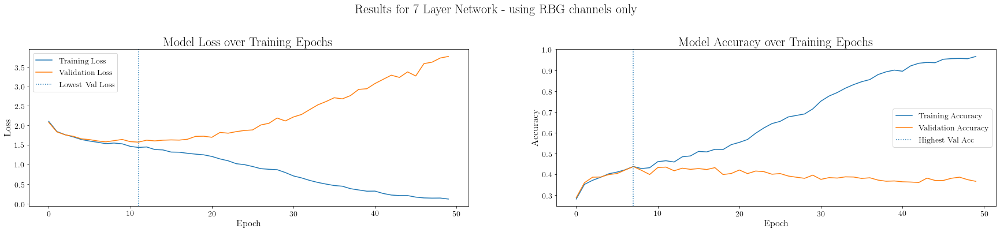

Lowest Validation Loss: 1.5725 - Epoch: 11
Highest Validation Accuracy: 43.8158% - Epoch 7


In [ ]:
small_fonts()
plot_results_cl(model_rgb_result,
                "Results for 7 Layer Network - using RBG channels only")

### Results

In [ ]:
# Training Result
train_dataset_model.flip = False
model_rgb_result_tr = test_classification(model_rgb,
                                          train_dataset_model,
                                          train_dataset_model.n_images,
                                          device,
                                          rgb=True)

Overall Accuracy (Top 1, Top 2, Top 3): 90.748539%, 92.922567%, 93.730589%
    
Accuracy: 90.75%
    
Balanced Accuracy: 88.43%
    
F1 Score: 0.91
    

    
              precision    recall  f1-score   support

         0.0       0.93      0.95      0.94      8185
         1.0       0.94      0.81      0.87       290
         2.0       0.96      0.82      0.89       446
         3.0       0.93      0.83      0.88       921
         4.0       0.88      0.86      0.87      2266
         5.0       0.84      0.90      0.87      3311
         6.0       0.86      0.89      0.87      3883
         7.0       0.90      0.89      0.89      3572
         8.0       0.91      0.88      0.90      2916
         9.0       0.92      0.89      0.90      2237
        10.0       0.92      0.91      0.92      2182
        11.0       0.94      0.91      0.93      2440
        12.0       0.92      0.96      0.94      3055
        13.0       0.94      0.93      0.94      1912
        14.0       0.97      0

In [ ]:
# Test Result
test_dataset.flip = False
model_rgb_results_tst = test_classification(model_rgb,
                                            test_dataset,
                                            test_dataset.n_images,
                                            device,
                                            rgb=True)

Overall Accuracy (Top 1, Top 2, Top 3): 33.621302%, 45.633136%, 53.763314%
    
Accuracy: 33.62%
    
Balanced Accuracy: 22.54%
    
F1 Score: 0.35
    

    
              precision    recall  f1-score   support

         0.0       0.66      0.53      0.59      3065
         1.0       0.03      0.01      0.02        92
         2.0       0.03      0.00      0.01       222
         3.0       0.05      0.02      0.02       388
         4.0       0.10      0.08      0.09       600
         5.0       0.13      0.16      0.14       680
         6.0       0.14      0.27      0.18       591
         7.0       0.12      0.19      0.15       473
         8.0       0.18      0.24      0.20       428
         9.0       0.19      0.19      0.19       372
        10.0       0.29      0.28      0.28       355
        11.0       0.37      0.42      0.40       418
        12.0       0.53      0.52      0.53       522
        13.0       0.43      0.37      0.40       221
        14.0       0.17      0

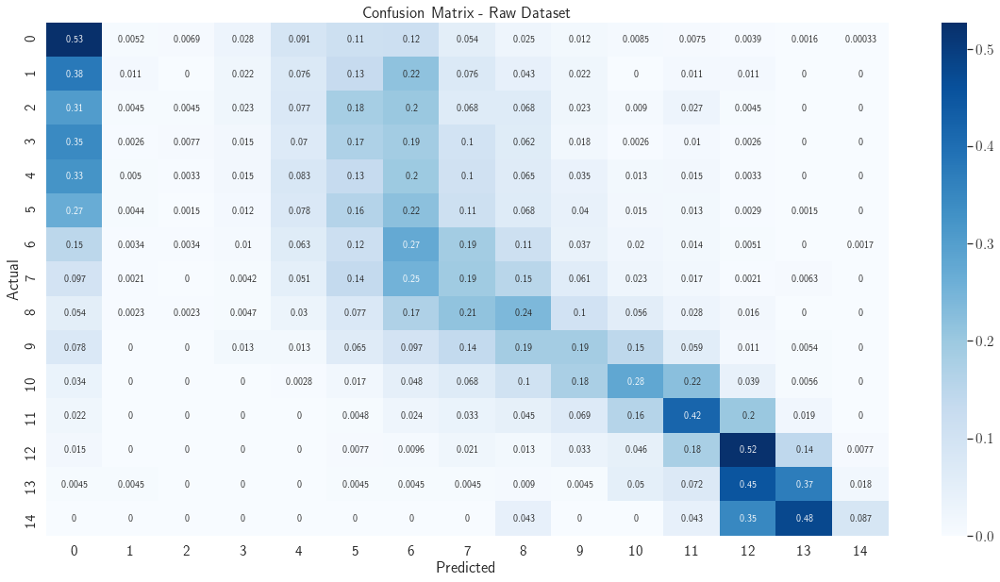

In [ ]:
confusion_matrix(model_rgb_results_tst)
plt.title("Confusion Matrix - Raw Dataset")
plt.show()

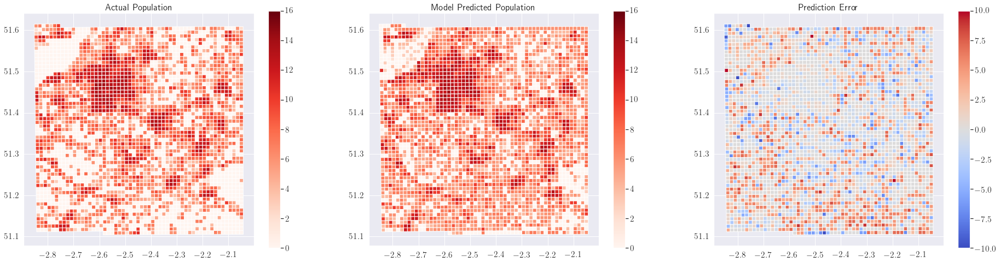

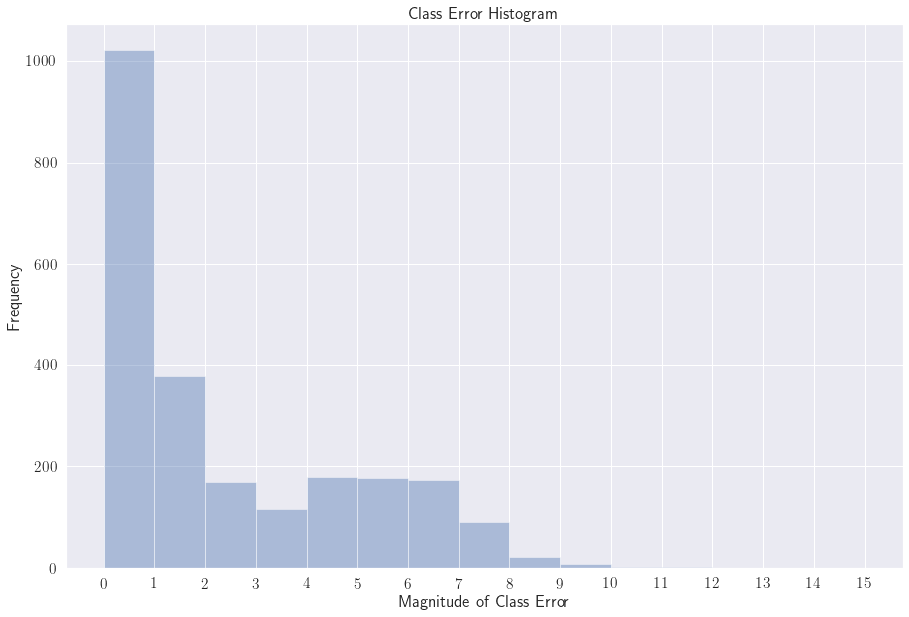

,Index,Population,Pred Class,Actual Class,Class Error,geometry
0,701240,0.0,0,0.0,0.0,"MULTIPOLYGON (((-2.80115 51.17466, -2.80130 51..."
1,701241,0.0,0,0.0,0.0,"MULTIPOLYGON (((-2.78685 51.17475, -2.78700 51..."
2,701242,0.0,6,0.0,6.0,"MULTIPOLYGON (((-2.77254 51.17485, -2.77269 51..."
3,701243,0.0,5,0.0,5.0,"MULTIPOLYGON (((-2.75824 51.17494, -2.75838 51..."
4,701244,0.0,6,0.0,6.0,"MULTIPOLYGON (((-2.74393 51.17504, -2.74407 51..."
...,...,...,...,...,...,...
3120,930,6397.0,13,13.0,0.0,"MULTIPOLYGON (((-2.53257 51.45497, -2.53267 51..."
3121,7290,2815.0,12,12.0,0.0,"MULTIPOLYGON (((-2.56124 51.44584, -2.56135 51..."
3122,318,9281.0,12,14.0,-2.0,"MULTIPOLYGON (((-2.61892 51.45454, -2.61904 51..."
3123,304,9365.0,13,14.0,-1.0,"MULTIPOLYGON (((-2.61904 51.46353, -2.61916 51..."


In [ ]:
shapefile_cl(model_rgb_results_tst)

## Raw Dataset

### Training

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model_raw = Neural_Network(config='7')
model_raw = model_raw.float()
model_raw.to(device)

print(summary(model_raw, input_size=(7, 50, 33)))

print("Model Loaded")

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 50, 33]           4,096
              ReLU-2           [-1, 64, 50, 33]               0
         MaxPool2d-3           [-1, 64, 25, 16]               0
            Conv2d-4          [-1, 128, 25, 16]          73,856
              ReLU-5          [-1, 128, 25, 16]               0
         MaxPool2d-6           [-1, 128, 12, 8]               0
            Conv2d-7           [-1, 256, 12, 8]         295,168
              ReLU-8           [-1, 256, 12, 8]               0
            Conv2d-9           [-1, 256, 12, 8]         590,080
             ReLU-10           [-1, 256, 12, 8]               0
        MaxPool2d-11            [-1, 256, 6, 4]               0
AdaptiveAvgPool2d-12            [-1, 256, 7, 7]               0
           Linear-13                 [-1, 4096]      51,384,320
             ReLU-14                 [-

In [ ]:
model_raw_result = run_training(model_raw,
                                dataset=train_dataset_model,
                                t_loader=train_loader,
                                v_loader=val_loader,
                                max_epochs=50,
                                flip=False,
                                initial_lr=0.001,
                                pbar=True,
                                checkpoint=False,
                                save_as="7layers_nobalancing",
                                weight_decay=1e-5)


Epoch: 1 | Learning Rate: 0.001
Training   | Avg loss: 1.9006 | Accuracy: 32.89% | Fbeta: 0.1249
Validation | Avg loss: 1.8775 | Accuracy: 32.87% | Fbeta: 0.1276



Epoch: 2 | Learning Rate: 0.001
Training   | Avg loss: 1.6575 | Accuracy: 40.12% | Fbeta: 0.2714
Validation | Avg loss: 1.6367 | Accuracy: 40.84% | Fbeta: 0.2758



Epoch: 3 | Learning Rate: 0.001
Training   | Avg loss: 1.4970 | Accuracy: 44.61% | Fbeta: 0.2891
Validation | Avg loss: 1.4918 | Accuracy: 44.47% | Fbeta: 0.2904



Epoch: 4 | Learning Rate: 0.001
Training   | Avg loss: 1.4721 | Accuracy: 45.28% | Fbeta: 0.3013
Validation | Avg loss: 1.4777 | Accuracy: 45.50% | Fbeta: 0.3025



Epoch: 5 | Learning Rate: 0.001
Training   | Avg loss: 1.4344 | Accuracy: 46.75% | Fbeta: 0.3251
Validation | Avg loss: 1.4398 | Accuracy: 46.39% | Fbeta: 0.3165



Epoch: 6 | Learning Rate: 0.001
Training   | Avg loss: 1.4017 | Accuracy: 47.91% | Fbeta: 0.3247
Validation | Avg loss: 1.4280 | Accuracy: 48.05% | Fbeta: 0.3245



Epoch: 7 | Learning Rate: 0.001
Training   | Avg loss: 1.3747 | Accuracy: 48.54% | Fbeta: 0.3373
Validation | Avg loss: 1.4000 | Accuracy: 48.29% | Fbeta: 0.3339



Epoch: 8 | Learning Rate: 0.001
Training   | Avg loss: 1.3662 | Accuracy: 48.47% | Fbeta: 0.3242
Validation | Avg loss: 1.4108 | Accuracy: 47.76% | Fbeta: 0.3181



Epoch: 9 | Learning Rate: 0.001
Training   | Avg loss: 1.3138 | Accuracy: 50.90% | Fbeta: 0.3541
Validation | Avg loss: 1.3808 | Accuracy: 49.37% | Fbeta: 0.3394



Epoch: 10 | Learning Rate: 0.001
Training   | Avg loss: 1.3237 | Accuracy: 50.54% | Fbeta: 0.3581
Validation | Avg loss: 1.3898 | Accuracy: 48.92% | Fbeta: 0.3470



Epoch: 11 | Learning Rate: 0.001
Training   | Avg loss: 1.2871 | Accuracy: 51.18% | Fbeta: 0.3552
Validation | Avg loss: 1.3774 | Accuracy: 48.34% | Fbeta: 0.3348



Epoch: 12 | Learning Rate: 0.001
Training   | Avg loss: 1.2825 | Accuracy: 51.50% | Fbeta: 0.3567
Validation | Avg loss: 1.3843 | Accuracy: 48.97% | Fbeta: 0.3381



Epoch: 13 | Learning Rate: 0.001
Training   | Avg loss: 1.2460 | Accuracy: 52.91% | Fbeta: 0.3660
Validation | Avg loss: 1.3731 | Accuracy: 50.00% | Fbeta: 0.3446



Epoch: 14 | Learning Rate: 0.001
Training   | Avg loss: 1.2402 | Accuracy: 53.33% | Fbeta: 0.3783
Validation | Avg loss: 1.3813 | Accuracy: 50.03% | Fbeta: 0.3580



Epoch: 15 | Learning Rate: 0.001
Training   | Avg loss: 1.2229 | Accuracy: 53.58% | Fbeta: 0.3841
Validation | Avg loss: 1.4006 | Accuracy: 48.39% | Fbeta: 0.3410



Epoch: 16 | Learning Rate: 0.001
Training   | Avg loss: 1.2258 | Accuracy: 53.35% | Fbeta: 0.3799
Validation | Avg loss: 1.4285 | Accuracy: 48.66% | Fbeta: 0.3486



Epoch: 17 | Learning Rate: 0.001
Training   | Avg loss: 1.1779 | Accuracy: 55.64% | Fbeta: 0.3990
Validation | Avg loss: 1.3948 | Accuracy: 48.45% | Fbeta: 0.3461



Epoch: 18 | Learning Rate: 0.001
Training   | Avg loss: 1.1578 | Accuracy: 56.25% | Fbeta: 0.4066
Validation | Avg loss: 1.4095 | Accuracy: 50.45% | Fbeta: 0.3597



Epoch: 19 | Learning Rate: 0.001
Training   | Avg loss: 1.1272 | Accuracy: 57.12% | Fbeta: 0.4101
Validation | Avg loss: 1.4295 | Accuracy: 48.76% | Fbeta: 0.3522



Epoch: 20 | Learning Rate: 0.001
Training   | Avg loss: 1.0749 | Accuracy: 59.57% | Fbeta: 0.4512
Validation | Avg loss: 1.4452 | Accuracy: 48.37% | Fbeta: 0.3833



Epoch: 21 | Learning Rate: 0.001
Training   | Avg loss: 1.0604 | Accuracy: 59.93% | Fbeta: 0.4390
Validation | Avg loss: 1.4676 | Accuracy: 47.87% | Fbeta: 0.3541



Epoch: 22 | Learning Rate: 0.001
Training   | Avg loss: 1.0687 | Accuracy: 59.57% | Fbeta: 0.4322
Validation | Avg loss: 1.4971 | Accuracy: 47.79% | Fbeta: 0.3419



Epoch: 23 | Learning Rate: 0.001
Training   | Avg loss: 1.0182 | Accuracy: 60.67% | Fbeta: 0.4298
Validation | Avg loss: 1.5271 | Accuracy: 47.45% | Fbeta: 0.3299



Epoch: 24 | Learning Rate: 0.001
Training   | Avg loss: 1.0043 | Accuracy: 61.60% | Fbeta: 0.4408
Validation | Avg loss: 1.5283 | Accuracy: 47.29% | Fbeta: 0.3361



Epoch: 25 | Learning Rate: 0.001
Training   | Avg loss: 0.9527 | Accuracy: 63.51% | Fbeta: 0.4654
Validation | Avg loss: 1.5808 | Accuracy: 46.55% | Fbeta: 0.3468



Epoch: 26 | Learning Rate: 0.001
Training   | Avg loss: 0.9557 | Accuracy: 63.05% | Fbeta: 0.4599
Validation | Avg loss: 1.6155 | Accuracy: 45.50% | Fbeta: 0.3227



Epoch: 27 | Learning Rate: 0.001
Training   | Avg loss: 0.9224 | Accuracy: 64.35% | Fbeta: 0.4907
Validation | Avg loss: 1.6322 | Accuracy: 46.53% | Fbeta: 0.3503



Epoch: 28 | Learning Rate: 0.001
Training   | Avg loss: 0.8710 | Accuracy: 66.46% | Fbeta: 0.4974
Validation | Avg loss: 1.6498 | Accuracy: 47.55% | Fbeta: 0.3524



Epoch: 29 | Learning Rate: 0.001
Training   | Avg loss: 0.8033 | Accuracy: 69.61% | Fbeta: 0.5446
Validation | Avg loss: 1.7261 | Accuracy: 47.18% | Fbeta: 0.3933



Epoch: 30 | Learning Rate: 0.001
Training   | Avg loss: 0.8079 | Accuracy: 69.02% | Fbeta: 0.5280
Validation | Avg loss: 1.7692 | Accuracy: 46.13% | Fbeta: 0.3463



Epoch: 31 | Learning Rate: 0.001
Training   | Avg loss: 0.7961 | Accuracy: 69.30% | Fbeta: 0.5192
Validation | Avg loss: 1.8235 | Accuracy: 45.97% | Fbeta: 0.3455



Epoch: 32 | Learning Rate: 0.001
Training   | Avg loss: 0.7482 | Accuracy: 71.64% | Fbeta: 0.5566
Validation | Avg loss: 1.8510 | Accuracy: 45.34% | Fbeta: 0.3431



Epoch: 33 | Learning Rate: 0.001
Training   | Avg loss: 0.7577 | Accuracy: 71.20% | Fbeta: 0.5511
Validation | Avg loss: 1.8176 | Accuracy: 47.11% | Fbeta: 0.3473



Epoch: 34 | Learning Rate: 0.001
Training   | Avg loss: 0.7249 | Accuracy: 72.43% | Fbeta: 0.5685
Validation | Avg loss: 1.9244 | Accuracy: 45.45% | Fbeta: 0.3377



Epoch: 35 | Learning Rate: 0.001
Training   | Avg loss: 0.7170 | Accuracy: 72.69% | Fbeta: 0.5797
Validation | Avg loss: 1.9128 | Accuracy: 46.29% | Fbeta: 0.3467



Epoch: 36 | Learning Rate: 0.001
Training   | Avg loss: 0.6712 | Accuracy: 74.52% | Fbeta: 0.6153
Validation | Avg loss: 1.9644 | Accuracy: 45.32% | Fbeta: 0.3441



Epoch: 37 | Learning Rate: 0.001
Training   | Avg loss: 0.6370 | Accuracy: 75.71% | Fbeta: 0.6487
Validation | Avg loss: 2.0830 | Accuracy: 45.13% | Fbeta: 0.3783



Epoch: 38 | Learning Rate: 0.001
Training   | Avg loss: 0.6509 | Accuracy: 74.81% | Fbeta: 0.6268
Validation | Avg loss: 2.1148 | Accuracy: 43.68% | Fbeta: 0.3434



Epoch: 39 | Learning Rate: 0.001
Training   | Avg loss: 0.6004 | Accuracy: 76.99% | Fbeta: 0.6625
Validation | Avg loss: 2.1397 | Accuracy: 43.82% | Fbeta: 0.3351



Epoch: 40 | Learning Rate: 0.001
Training   | Avg loss: 0.5522 | Accuracy: 79.04% | Fbeta: 0.7205
Validation | Avg loss: 2.2923 | Accuracy: 44.58% | Fbeta: 0.3933



Epoch: 41 | Learning Rate: 0.001
Training   | Avg loss: 0.5437 | Accuracy: 79.23% | Fbeta: 0.7248
Validation | Avg loss: 2.3011 | Accuracy: 43.34% | Fbeta: 0.3357



Epoch: 42 | Learning Rate: 0.001
Training   | Avg loss: 0.4943 | Accuracy: 81.38% | Fbeta: 0.6927
Validation | Avg loss: 2.3757 | Accuracy: 44.74% | Fbeta: 0.3431



Epoch: 43 | Learning Rate: 0.001
Training   | Avg loss: 0.4656 | Accuracy: 82.41% | Fbeta: 0.7483
Validation | Avg loss: 2.4069 | Accuracy: 44.26% | Fbeta: 0.3421



Epoch: 44 | Learning Rate: 0.001
Training   | Avg loss: 0.4834 | Accuracy: 82.16% | Fbeta: 0.7708
Validation | Avg loss: 2.2751 | Accuracy: 44.03% | Fbeta: 0.3972



Epoch: 45 | Learning Rate: 0.001
Training   | Avg loss: 0.4640 | Accuracy: 82.05% | Fbeta: 0.7760
Validation | Avg loss: 2.4787 | Accuracy: 44.45% | Fbeta: 0.3354



Epoch: 46 | Learning Rate: 0.001
Training   | Avg loss: 0.4304 | Accuracy: 84.20% | Fbeta: 0.7790
Validation | Avg loss: 2.5021 | Accuracy: 44.29% | Fbeta: 0.3456



Epoch: 47 | Learning Rate: 0.001
Training   | Avg loss: 0.3904 | Accuracy: 85.40% | Fbeta: 0.8108
Validation | Avg loss: 2.7991 | Accuracy: 43.68% | Fbeta: 0.3916



Epoch: 48 | Learning Rate: 0.001
Training   | Avg loss: 0.3819 | Accuracy: 86.22% | Fbeta: 0.8115
Validation | Avg loss: 2.6920 | Accuracy: 44.03% | Fbeta: 0.3670



Epoch: 49 | Learning Rate: 0.001
Training   | Avg loss: 0.3495 | Accuracy: 87.52% | Fbeta: 0.8322
Validation | Avg loss: 2.7690 | Accuracy: 44.42% | Fbeta: 0.3401



Epoch: 50 | Learning Rate: 0.001
Training   | Avg loss: 0.3222 | Accuracy: 88.68% | Fbeta: 0.8648
Validation | Avg loss: 2.7627 | Accuracy: 43.74% | Fbeta: 0.3982

Lowest Validation Loss: 1.3731 at Epoch 13 with 50.00% Accuracy
        
Best model state_dict saved as /content/drive/My Drive/Dissertation Files/Models/7layers_nobalancing_LowestLossEpoch13
        

Highest Validation Accuracy: 50.45% at Epoch 18 with 1.4095 Loss
        
Best model state_dict saved as /content/drive/My Drive/Dissertation Files/Models/7layers_nobalancing_HighestAccuracyEpoch13
        


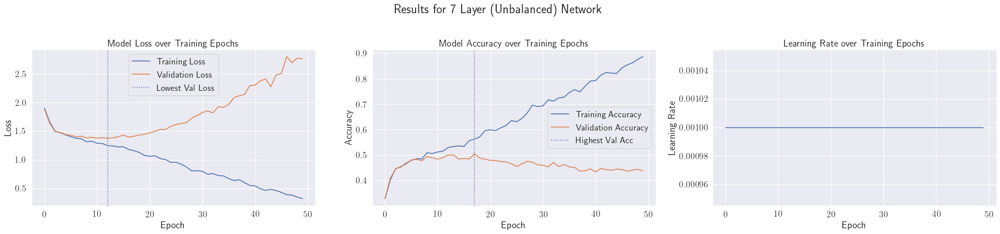

Lowest Validation Loss: 1.3731 - Epoch: 12
Highest Validation Accuracy: 50.4474% - Epoch 17


In [ ]:
plot_results_cl(model_raw_result, "Results for 7 Layer (Unbalanced) Network")

### Results

In [ ]:
# Training Result
train_dataset_model.flip = False
model_raw_result_tr = test_classification(model_raw, train_dataset_model,
                                          train_dataset_model.n_images, device)

Overall Accuracy (Top 1, Top 2, Top 3): 84.189609%, 88.687688%, 90.080013%
    
Accuracy: 84.19%
    
Balanced Accuracy: 78.10%
    
F1 Score: 0.84
    

    
              precision    recall  f1-score   support

         0.0       0.92      0.95      0.94      8185
         1.0       0.77      0.53      0.63       290
         2.0       0.80      0.39      0.53       446
         3.0       0.63      0.56      0.59       921
         4.0       0.64      0.70      0.67      2266
         5.0       0.67      0.73      0.70      3311
         6.0       0.79      0.76      0.77      3883
         7.0       0.80      0.83      0.82      3572
         8.0       0.83      0.83      0.83      2916
         9.0       0.91      0.81      0.86      2237
        10.0       0.92      0.90      0.91      2182
        11.0       0.93      0.94      0.93      2440
        12.0       0.92      0.95      0.94      3055
        13.0       0.94      0.90      0.92      1912
        14.0       0.93      0

In [ ]:
# Test Result
test_dataset.flip = False
model_raw_results_tst = test_classification(model_raw, test_dataset,
                                            test_dataset.n_images, device)

Overall Accuracy (Top 1, Top 2, Top 3): 42.579882%, 51.940828%, 57.704142%
    
Accuracy: 42.58%
    
Balanced Accuracy: 26.63%
    
F1 Score: 0.41
    

    
              precision    recall  f1-score   support

         0.0       0.67      0.73      0.69      3065
         1.0       0.00      0.00      0.00        92
         2.0       0.00      0.00      0.00       222
         3.0       0.03      0.01      0.02       388
         4.0       0.12      0.12      0.12       600
         5.0       0.15      0.20      0.17       680
         6.0       0.19      0.22      0.20       591
         7.0       0.20      0.23      0.22       473
         8.0       0.25      0.26      0.26       428
         9.0       0.31      0.25      0.28       372
        10.0       0.37      0.34      0.35       355
        11.0       0.46      0.49      0.47       418
        12.0       0.61      0.58      0.59       522
        13.0       0.57      0.40      0.47       221
        14.0       0.36      0

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1859: UserWarning: y_pred contains classes not in y_true
  warnings.warn('y_pred contains classes not in y_true')


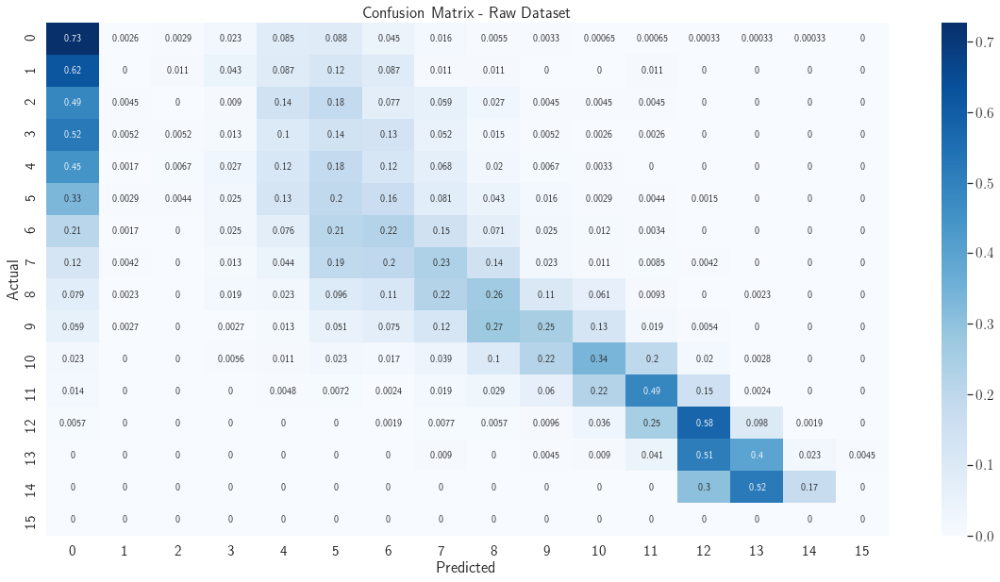

In [ ]:
confusion_matrix(model_raw_results_tst)
plt.title("Confusion Matrix - Raw Dataset")
plt.show()

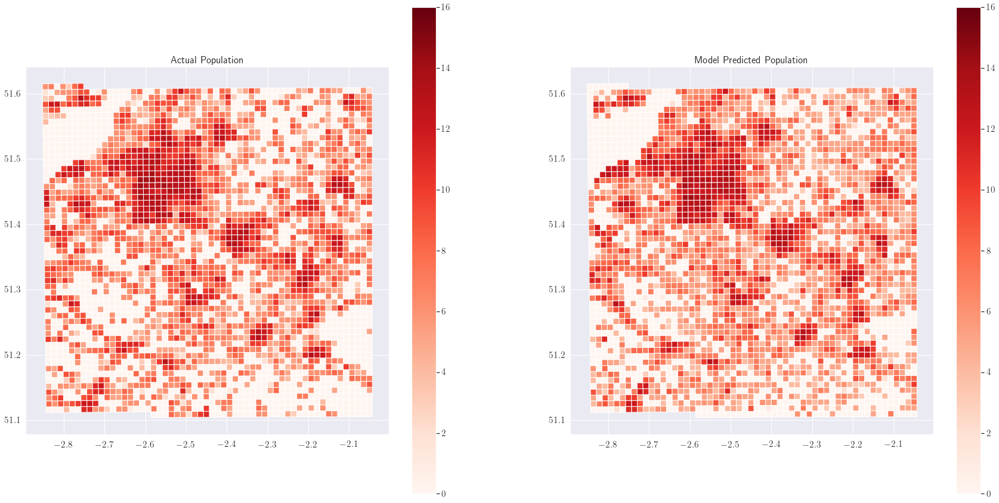

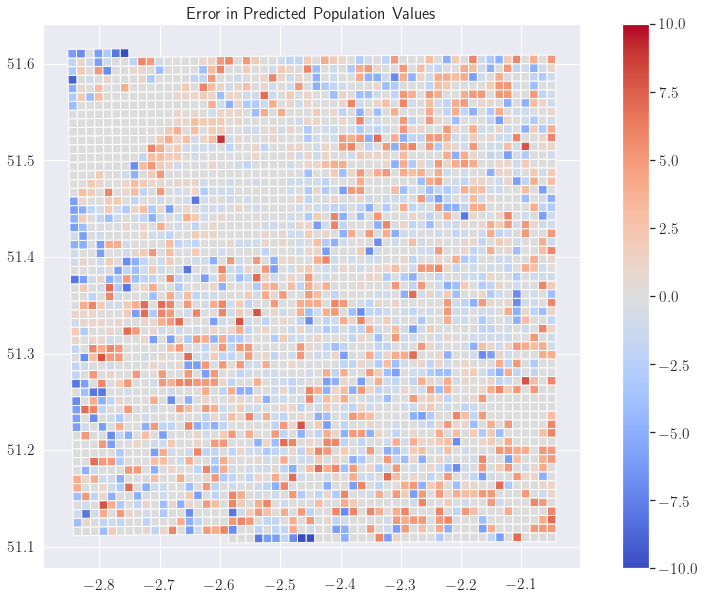

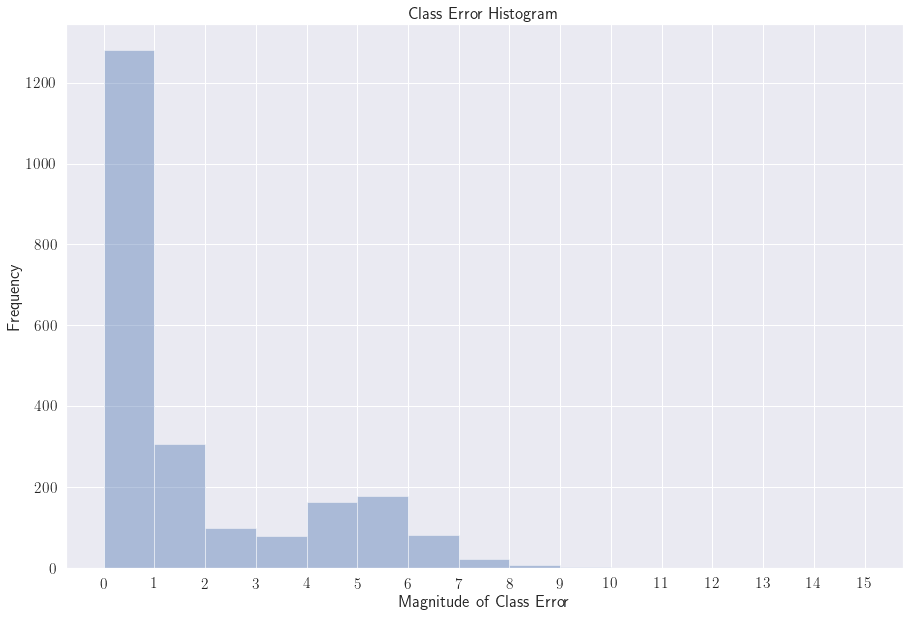

,Index,Population,Pred Class,Actual Class,Class Error,geometry
0,701240,0.0,0,0.0,0.0,"MULTIPOLYGON (((-2.80115 51.17466, -2.80130 51..."
1,701241,0.0,0,0.0,0.0,"MULTIPOLYGON (((-2.78685 51.17475, -2.78700 51..."
2,701242,0.0,0,0.0,0.0,"MULTIPOLYGON (((-2.77254 51.17485, -2.77269 51..."
3,701243,0.0,5,0.0,5.0,"MULTIPOLYGON (((-2.75824 51.17494, -2.75838 51..."
4,701244,0.0,5,0.0,5.0,"MULTIPOLYGON (((-2.74393 51.17504, -2.74407 51..."
...,...,...,...,...,...,...
3120,930,6397.0,13,13.0,0.0,"MULTIPOLYGON (((-2.53257 51.45497, -2.53267 51..."
3121,7290,2815.0,12,12.0,0.0,"MULTIPOLYGON (((-2.56124 51.44584, -2.56135 51..."
3122,318,9281.0,14,14.0,0.0,"MULTIPOLYGON (((-2.61892 51.45454, -2.61904 51..."
3123,304,9365.0,13,14.0,-1.0,"MULTIPOLYGON (((-2.61904 51.46353, -2.61916 51..."


In [ ]:
shapefile_cl(model_raw_results_tst)

## Batch Normalisation


### Training

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model_7_bn = Neural_Network(config='7', batch_norm=True)
model_7_bn = model_7_bn.float()
model_7_bn.to(device)

summary(model_7_bn, input_size=(7, 50, 33))

print("Model Loaded")

Model Loaded


In [ ]:
model_7_bn_result = run_training(model_7_bn,
                                 dataset=train_dataset_model,
                                 t_loader=train_loader,
                                 v_loader=val_loader,
                                 max_epochs=50,
                                 initial_lr=0.001,
                                 pbar=True,
                                 checkpoint=False,
                                 save_as="7layersbn",
                                 weight_decay=1e-5)


Epoch: 1 | Learning Rate: 0.001
Training   | Avg loss: 2.2954 | Accuracy: 24.85% | Fbeta: 0.0604
Validation | Avg loss: 2.2881 | Accuracy: 25.29% | Fbeta: 0.0626



Epoch: 2 | Learning Rate: 0.001
Training   | Avg loss: 1.8218 | Accuracy: 36.26% | Fbeta: 0.1534
Validation | Avg loss: 1.8177 | Accuracy: 36.08% | Fbeta: 0.1530



Epoch: 3 | Learning Rate: 0.001
Training   | Avg loss: 1.7581 | Accuracy: 37.57% | Fbeta: 0.1792
Validation | Avg loss: 1.7541 | Accuracy: 38.42% | Fbeta: 0.1871



Epoch: 4 | Learning Rate: 0.001
Training   | Avg loss: 1.7047 | Accuracy: 38.18% | Fbeta: 0.1873
Validation | Avg loss: 1.6977 | Accuracy: 37.61% | Fbeta: 0.1792



Epoch: 5 | Learning Rate: 0.001
Training   | Avg loss: 1.5941 | Accuracy: 42.39% | Fbeta: 0.2435
Validation | Avg loss: 1.5949 | Accuracy: 42.97% | Fbeta: 0.2473



Epoch: 6 | Learning Rate: 0.001
Training   | Avg loss: 1.6320 | Accuracy: 41.61% | Fbeta: 0.2584
Validation | Avg loss: 1.6226 | Accuracy: 43.03% | Fbeta: 0.2690



Epoch: 7 | Learning Rate: 0.001
Training   | Avg loss: 1.6804 | Accuracy: 38.20% | Fbeta: 0.1933
Validation | Avg loss: 1.6924 | Accuracy: 37.95% | Fbeta: 0.1909



Epoch: 8 | Learning Rate: 0.001
Training   | Avg loss: 1.5507 | Accuracy: 44.70% | Fbeta: 0.3010
Validation | Avg loss: 1.5471 | Accuracy: 45.58% | Fbeta: 0.3035



Epoch: 9 | Learning Rate: 0.001
Training   | Avg loss: 1.5936 | Accuracy: 44.31% | Fbeta: 0.2915
Validation | Avg loss: 1.5930 | Accuracy: 44.42% | Fbeta: 0.2921



Epoch: 10 | Learning Rate: 0.001
Training   | Avg loss: 1.5594 | Accuracy: 44.59% | Fbeta: 0.3035
Validation | Avg loss: 1.5581 | Accuracy: 45.58% | Fbeta: 0.3135



Epoch: 11 | Learning Rate: 0.001
Training   | Avg loss: 1.5082 | Accuracy: 46.98% | Fbeta: 0.2728
Validation | Avg loss: 1.5110 | Accuracy: 48.11% | Fbeta: 0.2799



Epoch: 12 | Learning Rate: 0.001
Training   | Avg loss: 1.5217 | Accuracy: 44.22% | Fbeta: 0.2475
Validation | Avg loss: 1.5226 | Accuracy: 44.97% | Fbeta: 0.2519



Epoch: 13 | Learning Rate: 0.001
Training   | Avg loss: 1.5512 | Accuracy: 45.50% | Fbeta: 0.2907
Validation | Avg loss: 1.5531 | Accuracy: 45.82% | Fbeta: 0.2885



Epoch: 14 | Learning Rate: 0.001
Training   | Avg loss: 1.4881 | Accuracy: 47.68% | Fbeta: 0.3016
Validation | Avg loss: 1.4883 | Accuracy: 48.18% | Fbeta: 0.2928



Epoch: 15 | Learning Rate: 0.001
Training   | Avg loss: 1.4986 | Accuracy: 46.09% | Fbeta: 0.3113
Validation | Avg loss: 1.4991 | Accuracy: 46.84% | Fbeta: 0.3143



Epoch: 16 | Learning Rate: 0.001
Training   | Avg loss: 1.5322 | Accuracy: 43.36% | Fbeta: 0.2856
Validation | Avg loss: 1.5459 | Accuracy: 43.50% | Fbeta: 0.2804



Epoch: 17 | Learning Rate: 0.001
Training   | Avg loss: 1.4967 | Accuracy: 45.51% | Fbeta: 0.2714
Validation | Avg loss: 1.4983 | Accuracy: 46.05% | Fbeta: 0.2753



Epoch: 18 | Learning Rate: 0.001
Training   | Avg loss: 1.4603 | Accuracy: 48.50% | Fbeta: 0.3356
Validation | Avg loss: 1.4718 | Accuracy: 49.00% | Fbeta: 0.3380



Epoch: 19 | Learning Rate: 0.001
Training   | Avg loss: 1.4727 | Accuracy: 48.34% | Fbeta: 0.3199
Validation | Avg loss: 1.4828 | Accuracy: 48.24% | Fbeta: 0.3141



Epoch: 20 | Learning Rate: 0.001
Training   | Avg loss: 1.4998 | Accuracy: 47.16% | Fbeta: 0.3197
Validation | Avg loss: 1.5168 | Accuracy: 47.34% | Fbeta: 0.3126



Epoch: 21 | Learning Rate: 0.001
Training   | Avg loss: 1.4373 | Accuracy: 48.11% | Fbeta: 0.3018
Validation | Avg loss: 1.4497 | Accuracy: 48.58% | Fbeta: 0.3049



Epoch: 22 | Learning Rate: 0.001
Training   | Avg loss: 1.4613 | Accuracy: 48.12% | Fbeta: 0.3226
Validation | Avg loss: 1.4745 | Accuracy: 48.26% | Fbeta: 0.3173



Epoch: 23 | Learning Rate: 0.001
Training   | Avg loss: 1.4302 | Accuracy: 49.13% | Fbeta: 0.3247
Validation | Avg loss: 1.4457 | Accuracy: 50.34% | Fbeta: 0.3339



Epoch: 24 | Learning Rate: 0.001
Training   | Avg loss: 1.4338 | Accuracy: 50.49% | Fbeta: 0.3398
Validation | Avg loss: 1.4504 | Accuracy: 49.97% | Fbeta: 0.3286



Epoch: 25 | Learning Rate: 0.001
Training   | Avg loss: 1.4114 | Accuracy: 50.13% | Fbeta: 0.3289
Validation | Avg loss: 1.4367 | Accuracy: 50.21% | Fbeta: 0.3190



Epoch: 26 | Learning Rate: 0.001
Training   | Avg loss: 1.4194 | Accuracy: 49.37% | Fbeta: 0.3403
Validation | Avg loss: 1.4427 | Accuracy: 48.55% | Fbeta: 0.3320



Epoch: 27 | Learning Rate: 0.001
Training   | Avg loss: 1.4870 | Accuracy: 48.28% | Fbeta: 0.3313
Validation | Avg loss: 1.5058 | Accuracy: 48.61% | Fbeta: 0.3281



Epoch: 28 | Learning Rate: 0.001
Training   | Avg loss: 1.4445 | Accuracy: 48.14% | Fbeta: 0.3309
Validation | Avg loss: 1.4695 | Accuracy: 47.63% | Fbeta: 0.3290



Epoch: 29 | Learning Rate: 0.001
Training   | Avg loss: 1.4589 | Accuracy: 47.74% | Fbeta: 0.2943
Validation | Avg loss: 1.4817 | Accuracy: 47.39% | Fbeta: 0.2928



Epoch: 30 | Learning Rate: 0.001
Training   | Avg loss: 1.3914 | Accuracy: 50.90% | Fbeta: 0.3221
Validation | Avg loss: 1.4194 | Accuracy: 50.11% | Fbeta: 0.2960



Epoch: 31 | Learning Rate: 0.001
Training   | Avg loss: 1.3931 | Accuracy: 50.87% | Fbeta: 0.3140
Validation | Avg loss: 1.4310 | Accuracy: 49.26% | Fbeta: 0.2964



Epoch: 32 | Learning Rate: 0.001
Training   | Avg loss: 1.3808 | Accuracy: 51.42% | Fbeta: 0.3608
Validation | Avg loss: 1.4138 | Accuracy: 50.11% | Fbeta: 0.3487



Epoch: 33 | Learning Rate: 0.001
Training   | Avg loss: 1.3993 | Accuracy: 49.88% | Fbeta: 0.3424
Validation | Avg loss: 1.4442 | Accuracy: 48.29% | Fbeta: 0.3304



Epoch: 34 | Learning Rate: 0.001
Training   | Avg loss: 1.3640 | Accuracy: 52.21% | Fbeta: 0.3527
Validation | Avg loss: 1.4170 | Accuracy: 49.76% | Fbeta: 0.3297



Epoch: 35 | Learning Rate: 0.001
Training   | Avg loss: 1.3665 | Accuracy: 51.69% | Fbeta: 0.3697
Validation | Avg loss: 1.4113 | Accuracy: 50.16% | Fbeta: 0.3600



Epoch: 36 | Learning Rate: 0.001
Training   | Avg loss: 1.3323 | Accuracy: 52.74% | Fbeta: 0.3298
Validation | Avg loss: 1.3830 | Accuracy: 51.63% | Fbeta: 0.3176



Epoch: 37 | Learning Rate: 0.001
Training   | Avg loss: 1.3729 | Accuracy: 48.85% | Fbeta: 0.3234
Validation | Avg loss: 1.4351 | Accuracy: 46.32% | Fbeta: 0.2998



Epoch: 38 | Learning Rate: 0.001
Training   | Avg loss: 1.3453 | Accuracy: 53.16% | Fbeta: 0.3487
Validation | Avg loss: 1.4001 | Accuracy: 50.45% | Fbeta: 0.3199



Epoch: 39 | Learning Rate: 0.001
Training   | Avg loss: 1.3296 | Accuracy: 52.16% | Fbeta: 0.3325
Validation | Avg loss: 1.3910 | Accuracy: 50.21% | Fbeta: 0.3100



Epoch: 40 | Learning Rate: 0.001
Training   | Avg loss: 1.3551 | Accuracy: 52.24% | Fbeta: 0.3291
Validation | Avg loss: 1.4209 | Accuracy: 49.13% | Fbeta: 0.3054



Epoch: 41 | Learning Rate: 0.001
Training   | Avg loss: 1.2949 | Accuracy: 53.37% | Fbeta: 0.3373
Validation | Avg loss: 1.3704 | Accuracy: 51.00% | Fbeta: 0.3158



Epoch: 42 | Learning Rate: 0.001
Training   | Avg loss: 1.3424 | Accuracy: 53.12% | Fbeta: 0.3722
Validation | Avg loss: 1.4141 | Accuracy: 49.95% | Fbeta: 0.3434



Epoch: 43 | Learning Rate: 0.001
Training   | Avg loss: 1.3101 | Accuracy: 53.42% | Fbeta: 0.3749
Validation | Avg loss: 1.4048 | Accuracy: 50.29% | Fbeta: 0.3521



Epoch: 44 | Learning Rate: 0.001
Training   | Avg loss: 1.3234 | Accuracy: 54.59% | Fbeta: 0.3815
Validation | Avg loss: 1.4086 | Accuracy: 49.42% | Fbeta: 0.3358



Epoch: 45 | Learning Rate: 0.001
Training   | Avg loss: 1.3064 | Accuracy: 52.99% | Fbeta: 0.3640
Validation | Avg loss: 1.3926 | Accuracy: 50.11% | Fbeta: 0.3408



Epoch: 46 | Learning Rate: 0.001
Training   | Avg loss: 1.3059 | Accuracy: 55.65% | Fbeta: 0.3954
Validation | Avg loss: 1.4069 | Accuracy: 50.39% | Fbeta: 0.3600



Epoch: 47 | Learning Rate: 0.001
Training   | Avg loss: 1.3130 | Accuracy: 53.83% | Fbeta: 0.3841
Validation | Avg loss: 1.4126 | Accuracy: 49.13% | Fbeta: 0.3526



Epoch: 48 | Learning Rate: 0.001
Training   | Avg loss: 1.2904 | Accuracy: 55.82% | Fbeta: 0.3930
Validation | Avg loss: 1.3947 | Accuracy: 50.37% | Fbeta: 0.3517



Epoch: 49 | Learning Rate: 0.001
Training   | Avg loss: 1.2730 | Accuracy: 55.48% | Fbeta: 0.3945
Validation | Avg loss: 1.3954 | Accuracy: 50.05% | Fbeta: 0.3516



Epoch: 50 | Learning Rate: 0.001
Training   | Avg loss: 1.2814 | Accuracy: 54.48% | Fbeta: 0.3799
Validation | Avg loss: 1.4258 | Accuracy: 47.79% | Fbeta: 0.3278

Lowest Validation Loss: 1.3704 at Epoch 41 with 51.00% Accuracy
        
Best model state_dict saved as /content/drive/My Drive/Dissertation Files/Models/7layersbn_LowestLossEpoch41
        

Highest Validation Accuracy: 51.63% at Epoch 36 with 1.3830 Loss
        
Best model state_dict saved as /content/drive/My Drive/Dissertation Files/Models/7layersbn_HighestAccuracyEpoch41
        


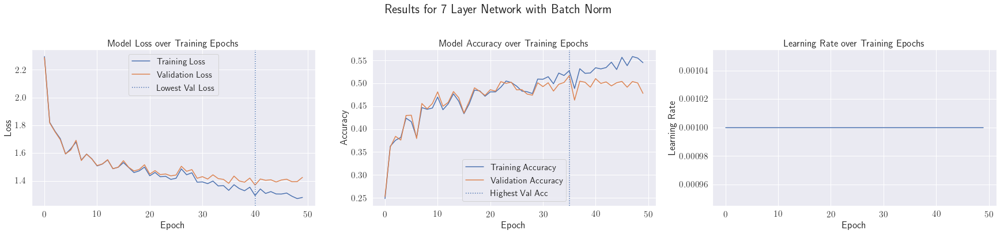

Lowest Validation Loss: 1.3704 - Epoch: 40
Highest Validation Accuracy: 51.6316% - Epoch 35


In [ ]:
plot_results_cl(model_7_bn_result,
                "Results for 7 Layer Network with Batch Norm")

### Results

In [ ]:
# Training Result
train_dataset_model.flip = False
model_7_bn_result_tr = test_classification(model_7_bn, train_dataset_model,
                                           train_dataset_model.n_images,
                                           device)

Overall Accuracy (Top 1, Top 2, Top 3): 53.763752%, 62.483550%, 67.244828%
    
Accuracy: 53.76%
    
Balanced Accuracy: 36.69%
    
F1 Score: 0.50
    

    
              precision    recall  f1-score   support

         0.0       0.68      0.91      0.78      8185
         1.0       0.00      0.00      0.00       290
         2.0       0.00      0.00      0.00       446
         3.0       0.00      0.00      0.00       921
         4.0       0.00      0.00      0.00      2266
         5.0       0.28      0.50      0.36      3311
         6.0       0.37      0.35      0.36      3883
         7.0       0.43      0.36      0.39      3572
         8.0       0.44      0.52      0.48      2916
         9.0       0.45      0.37      0.41      2237
        10.0       0.52      0.54      0.53      2182
        11.0       0.75      0.47      0.58      2440
        12.0       0.76      0.80      0.78      3055
        13.0       0.73      0.75      0.74      1912
        14.0       0.83      0

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
# Test Result
test_dataset.flip = False
model_7_bn_results_tst = test_classification(model_7_bn, test_dataset,
                                             test_dataset.n_images, device)

Overall Accuracy (Top 1, Top 2, Top 3): 48.627219%, 57.988166%, 64.047337%
    
Accuracy: 48.63%
    
Balanced Accuracy: 27.84%
    
F1 Score: 0.44
    

    
              precision    recall  f1-score   support

         0.0       0.66      0.87      0.75      3065
         1.0       0.00      0.00      0.00        92
         2.0       0.00      0.00      0.00       222
         3.0       0.00      0.00      0.00       388
         4.0       0.00      0.00      0.00       600
         5.0       0.19      0.32      0.24       680
         6.0       0.25      0.25      0.25       591
         7.0       0.23      0.20      0.21       473
         8.0       0.27      0.37      0.31       428
         9.0       0.26      0.24      0.25       372
        10.0       0.36      0.37      0.37       355
        11.0       0.54      0.34      0.42       418
        12.0       0.66      0.67      0.66       522
        13.0       0.65      0.55      0.60       221
        14.0       0.00      0

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


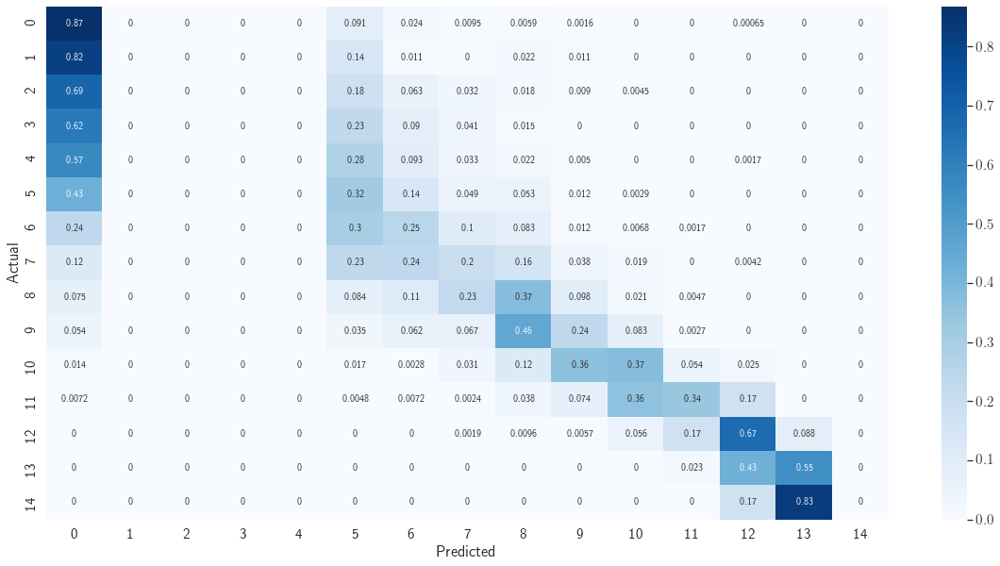

In [ ]:
confusion_matrix(model_7_bn_results_tst)

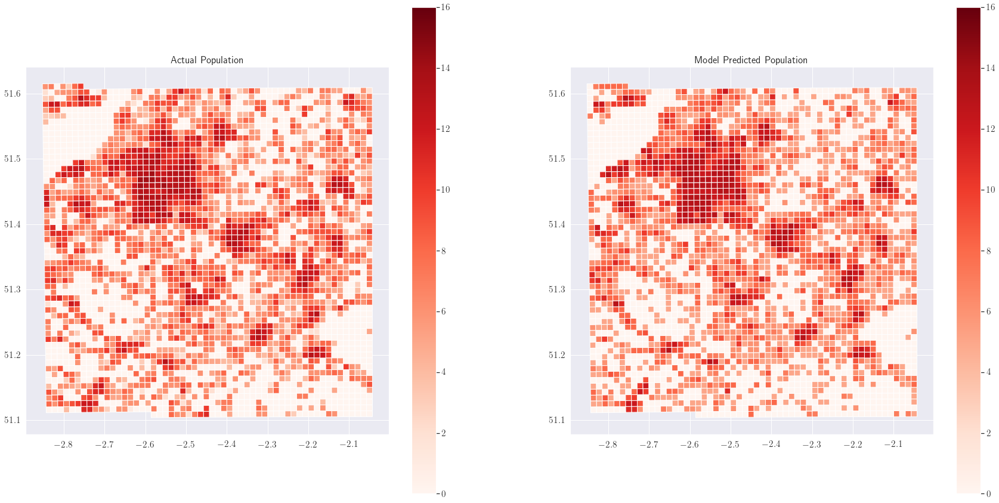

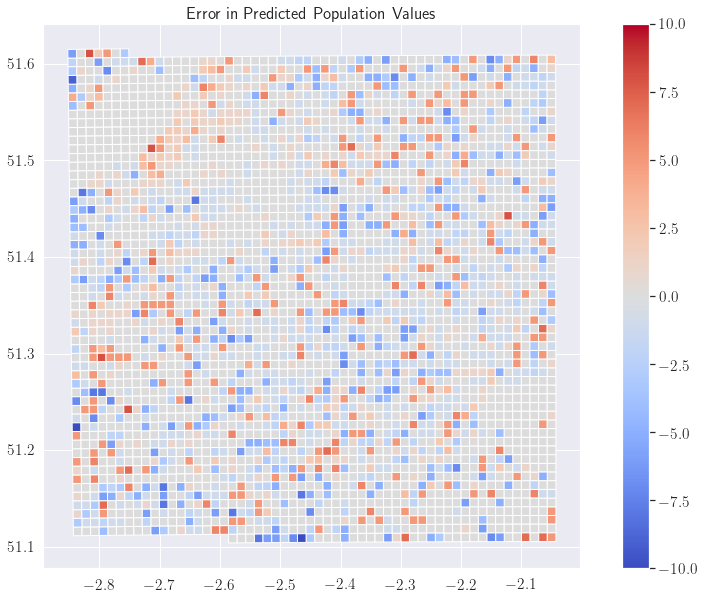

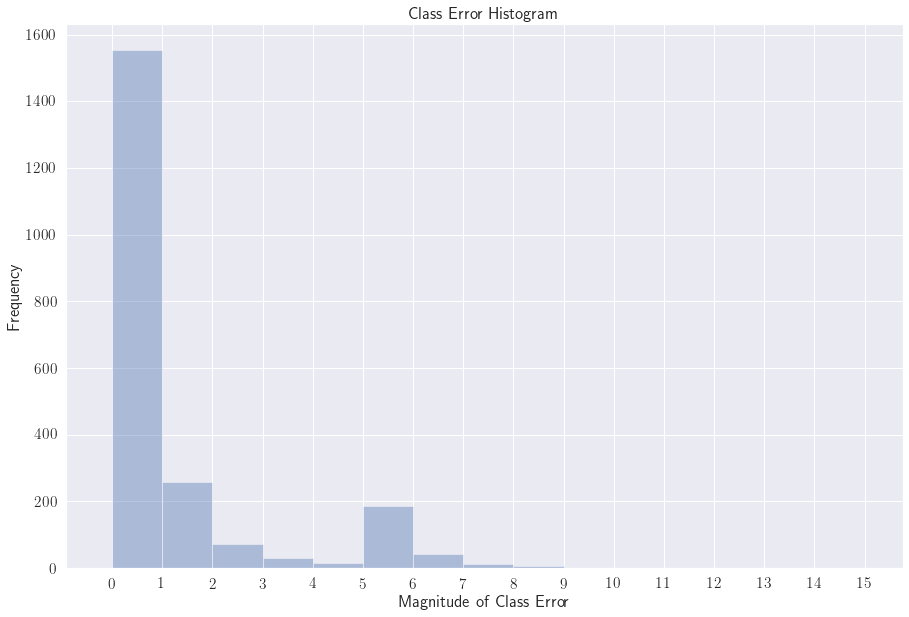

,Index,Population,Pred Class,Actual Class,Class Error,geometry
0,701240,0.0,0,0.0,0.0,"MULTIPOLYGON (((-2.80115 51.17466, -2.80130 51..."
1,701241,0.0,0,0.0,0.0,"MULTIPOLYGON (((-2.78685 51.17475, -2.78700 51..."
2,701242,0.0,5,0.0,5.0,"MULTIPOLYGON (((-2.77254 51.17485, -2.77269 51..."
3,701243,0.0,7,0.0,7.0,"MULTIPOLYGON (((-2.75824 51.17494, -2.75838 51..."
4,701244,0.0,0,0.0,0.0,"MULTIPOLYGON (((-2.74393 51.17504, -2.74407 51..."
...,...,...,...,...,...,...
3120,930,6397.0,13,13.0,0.0,"MULTIPOLYGON (((-2.53257 51.45497, -2.53267 51..."
3121,7290,2815.0,12,12.0,0.0,"MULTIPOLYGON (((-2.56124 51.44584, -2.56135 51..."
3122,318,9281.0,13,14.0,-1.0,"MULTIPOLYGON (((-2.61892 51.45454, -2.61904 51..."
3123,304,9365.0,13,14.0,-1.0,"MULTIPOLYGON (((-2.61904 51.46353, -2.61916 51..."


In [ ]:
shapefile_cl(model_7_bn_results_tst)

## Flip - p = 0.25


### Training

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model_7flip = Neural_Network(config='7', batch_norm=True)
model_7flip = model_7flip.float()
model_7flip.to(device)

print("Model Loaded")

Model Loaded


In [ ]:
summary(model_7flip, input_size=(7,50,33))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 50, 33]           4,096
       BatchNorm2d-2           [-1, 64, 50, 33]             128
              ReLU-3           [-1, 64, 50, 33]               0
         MaxPool2d-4           [-1, 64, 25, 16]               0
            Conv2d-5          [-1, 128, 25, 16]          73,856
       BatchNorm2d-6          [-1, 128, 25, 16]             256
              ReLU-7          [-1, 128, 25, 16]               0
         MaxPool2d-8           [-1, 128, 12, 8]               0
            Conv2d-9           [-1, 256, 12, 8]         295,168
      BatchNorm2d-10           [-1, 256, 12, 8]             512
             ReLU-11           [-1, 256, 12, 8]               0
           Conv2d-12           [-1, 256, 12, 8]         590,080
      BatchNorm2d-13           [-1, 256, 12, 8]             512
             ReLU-14           [-1, 256

In [ ]:
model_7flip_result = run_training(model_7flip,
                                  dataset=train_dataset_model,
                                  t_loader=train_loader,
                                  v_loader=val_loader,
                                  max_epochs=50,
                                  flip=True,
                                  flip_prob=0.25,
                                  initial_lr=0.001,
                                  pbar=True,
                                  checkpoint=False,
                                  save_as="7layersbn",
                                  weight_decay=1e-5)


Epoch: 1 | Learning Rate: 0.001
Training   | Avg loss: 2.1916 | Accuracy: 27.35% | Fbeta: 0.0721
Validation | Avg loss: 2.1679 | Accuracy: 28.18% | Fbeta: 0.0704



Epoch: 2 | Learning Rate: 0.001
Training   | Avg loss: 1.8309 | Accuracy: 35.94% | Fbeta: 0.2039
Validation | Avg loss: 1.8157 | Accuracy: 36.58% | Fbeta: 0.1962



Epoch: 3 | Learning Rate: 0.001
Training   | Avg loss: 1.7190 | Accuracy: 38.56% | Fbeta: 0.2234
Validation | Avg loss: 1.7053 | Accuracy: 39.89% | Fbeta: 0.2327



Epoch: 4 | Learning Rate: 0.001
Training   | Avg loss: 1.6523 | Accuracy: 39.99% | Fbeta: 0.2434
Validation | Avg loss: 1.6448 | Accuracy: 40.34% | Fbeta: 0.2353



Epoch: 5 | Learning Rate: 0.001
Training   | Avg loss: 1.5898 | Accuracy: 42.59% | Fbeta: 0.2737
Validation | Avg loss: 1.5775 | Accuracy: 43.21% | Fbeta: 0.2695



Epoch: 6 | Learning Rate: 0.001
Training   | Avg loss: 1.5911 | Accuracy: 41.60% | Fbeta: 0.2602
Validation | Avg loss: 1.5852 | Accuracy: 42.92% | Fbeta: 0.2603



Epoch: 7 | Learning Rate: 0.001
Training   | Avg loss: 1.5773 | Accuracy: 42.98% | Fbeta: 0.2603
Validation | Avg loss: 1.5732 | Accuracy: 43.61% | Fbeta: 0.2588



Epoch: 8 | Learning Rate: 0.001
Training   | Avg loss: 1.5843 | Accuracy: 44.13% | Fbeta: 0.2826
Validation | Avg loss: 1.5732 | Accuracy: 45.05% | Fbeta: 0.2845



Epoch: 9 | Learning Rate: 0.001
Training   | Avg loss: 1.5455 | Accuracy: 43.02% | Fbeta: 0.2574
Validation | Avg loss: 1.5381 | Accuracy: 43.39% | Fbeta: 0.2476



Epoch: 10 | Learning Rate: 0.001
Training   | Avg loss: 1.5370 | Accuracy: 44.45% | Fbeta: 0.2891
Validation | Avg loss: 1.5287 | Accuracy: 45.11% | Fbeta: 0.2802



Epoch: 11 | Learning Rate: 0.001
Training   | Avg loss: 1.5445 | Accuracy: 45.11% | Fbeta: 0.2865
Validation | Avg loss: 1.5338 | Accuracy: 46.55% | Fbeta: 0.2877



Epoch: 12 | Learning Rate: 0.001
Training   | Avg loss: 1.5816 | Accuracy: 43.87% | Fbeta: 0.2917
Validation | Avg loss: 1.5683 | Accuracy: 44.89% | Fbeta: 0.2947



Epoch: 13 | Learning Rate: 0.001
Training   | Avg loss: 1.5888 | Accuracy: 41.67% | Fbeta: 0.2643
Validation | Avg loss: 1.5817 | Accuracy: 42.50% | Fbeta: 0.2636



Epoch: 14 | Learning Rate: 0.001
Training   | Avg loss: 1.4950 | Accuracy: 46.46% | Fbeta: 0.3133
Validation | Avg loss: 1.4884 | Accuracy: 47.34% | Fbeta: 0.3104



Epoch: 15 | Learning Rate: 0.001
Training   | Avg loss: 1.5274 | Accuracy: 44.38% | Fbeta: 0.2790
Validation | Avg loss: 1.5183 | Accuracy: 45.32% | Fbeta: 0.2776



Epoch: 16 | Learning Rate: 0.001
Training   | Avg loss: 1.4727 | Accuracy: 46.05% | Fbeta: 0.3072
Validation | Avg loss: 1.4676 | Accuracy: 46.89% | Fbeta: 0.3059



Epoch: 17 | Learning Rate: 0.001
Training   | Avg loss: 1.5180 | Accuracy: 46.00% | Fbeta: 0.2938
Validation | Avg loss: 1.5097 | Accuracy: 46.74% | Fbeta: 0.2960



Epoch: 18 | Learning Rate: 0.001
Training   | Avg loss: 1.5465 | Accuracy: 47.25% | Fbeta: 0.3233
Validation | Avg loss: 1.5338 | Accuracy: 48.32% | Fbeta: 0.3431



Epoch: 19 | Learning Rate: 0.001
Training   | Avg loss: 1.4784 | Accuracy: 47.62% | Fbeta: 0.3011
Validation | Avg loss: 1.4754 | Accuracy: 48.13% | Fbeta: 0.2990



Epoch: 20 | Learning Rate: 0.001
Training   | Avg loss: 1.5423 | Accuracy: 41.40% | Fbeta: 0.2517
Validation | Avg loss: 1.5448 | Accuracy: 42.08% | Fbeta: 0.2491



Epoch: 21 | Learning Rate: 0.001
Training   | Avg loss: 1.4507 | Accuracy: 48.91% | Fbeta: 0.3317
Validation | Avg loss: 1.4492 | Accuracy: 48.87% | Fbeta: 0.3221



Epoch: 22 | Learning Rate: 0.001
Training   | Avg loss: 1.4528 | Accuracy: 47.71% | Fbeta: 0.3148
Validation | Avg loss: 1.4470 | Accuracy: 47.76% | Fbeta: 0.3061



Epoch: 23 | Learning Rate: 0.001
Training   | Avg loss: 1.4612 | Accuracy: 47.64% | Fbeta: 0.3237
Validation | Avg loss: 1.4645 | Accuracy: 48.63% | Fbeta: 0.3246



Epoch: 24 | Learning Rate: 0.001
Training   | Avg loss: 1.4876 | Accuracy: 45.97% | Fbeta: 0.3048
Validation | Avg loss: 1.4851 | Accuracy: 45.92% | Fbeta: 0.3140



Epoch: 25 | Learning Rate: 0.001
Training   | Avg loss: 1.4603 | Accuracy: 48.26% | Fbeta: 0.3094
Validation | Avg loss: 1.4561 | Accuracy: 48.76% | Fbeta: 0.3012



Epoch: 26 | Learning Rate: 0.001
Training   | Avg loss: 1.4326 | Accuracy: 49.17% | Fbeta: 0.3403
Validation | Avg loss: 1.4343 | Accuracy: 49.39% | Fbeta: 0.3339



Epoch: 27 | Learning Rate: 0.001
Training   | Avg loss: 1.4397 | Accuracy: 48.51% | Fbeta: 0.3265
Validation | Avg loss: 1.4449 | Accuracy: 48.53% | Fbeta: 0.3262



Epoch: 28 | Learning Rate: 0.001
Training   | Avg loss: 1.4239 | Accuracy: 49.45% | Fbeta: 0.3659
Validation | Avg loss: 1.4316 | Accuracy: 49.74% | Fbeta: 0.3671



Epoch: 29 | Learning Rate: 0.001
Training   | Avg loss: 1.4404 | Accuracy: 49.89% | Fbeta: 0.3399
Validation | Avg loss: 1.4474 | Accuracy: 50.34% | Fbeta: 0.3382



Epoch: 30 | Learning Rate: 0.001
Training   | Avg loss: 1.4231 | Accuracy: 49.22% | Fbeta: 0.3416
Validation | Avg loss: 1.4288 | Accuracy: 49.21% | Fbeta: 0.3369



Epoch: 31 | Learning Rate: 0.001
Training   | Avg loss: 1.4126 | Accuracy: 49.02% | Fbeta: 0.3340
Validation | Avg loss: 1.4254 | Accuracy: 48.03% | Fbeta: 0.3205



Epoch: 32 | Learning Rate: 0.001
Training   | Avg loss: 1.4262 | Accuracy: 49.10% | Fbeta: 0.3343
Validation | Avg loss: 1.4330 | Accuracy: 49.18% | Fbeta: 0.3278



Epoch: 33 | Learning Rate: 0.001
Training   | Avg loss: 1.4309 | Accuracy: 50.19% | Fbeta: 0.3453
Validation | Avg loss: 1.4453 | Accuracy: 48.82% | Fbeta: 0.3236



Epoch: 34 | Learning Rate: 0.001
Training   | Avg loss: 1.4086 | Accuracy: 50.03% | Fbeta: 0.3708
Validation | Avg loss: 1.4195 | Accuracy: 50.29% | Fbeta: 0.3659



Epoch: 35 | Learning Rate: 0.001
Training   | Avg loss: 1.4184 | Accuracy: 49.28% | Fbeta: 0.3408
Validation | Avg loss: 1.4319 | Accuracy: 49.13% | Fbeta: 0.3340



Epoch: 36 | Learning Rate: 0.001
Training   | Avg loss: 1.3955 | Accuracy: 50.27% | Fbeta: 0.3519
Validation | Avg loss: 1.4154 | Accuracy: 49.82% | Fbeta: 0.3346



Epoch: 37 | Learning Rate: 0.001
Training   | Avg loss: 1.4223 | Accuracy: 50.18% | Fbeta: 0.3595
Validation | Avg loss: 1.4368 | Accuracy: 50.05% | Fbeta: 0.3533



Epoch: 38 | Learning Rate: 0.001
Training   | Avg loss: 1.4409 | Accuracy: 49.40% | Fbeta: 0.3425
Validation | Avg loss: 1.4524 | Accuracy: 48.76% | Fbeta: 0.3314



Epoch: 39 | Learning Rate: 0.001
Training   | Avg loss: 1.4684 | Accuracy: 46.86% | Fbeta: 0.3441
Validation | Avg loss: 1.4845 | Accuracy: 46.50% | Fbeta: 0.3198



Epoch: 40 | Learning Rate: 0.001
Training   | Avg loss: 1.4036 | Accuracy: 49.80% | Fbeta: 0.3361
Validation | Avg loss: 1.4299 | Accuracy: 48.05% | Fbeta: 0.3139



Epoch: 41 | Learning Rate: 0.001
Training   | Avg loss: 1.4206 | Accuracy: 50.34% | Fbeta: 0.3605
Validation | Avg loss: 1.4431 | Accuracy: 49.76% | Fbeta: 0.3496



Epoch: 42 | Learning Rate: 0.001
Training   | Avg loss: 1.3734 | Accuracy: 51.53% | Fbeta: 0.3555
Validation | Avg loss: 1.3989 | Accuracy: 51.00% | Fbeta: 0.3459



Epoch: 43 | Learning Rate: 0.001
Training   | Avg loss: 1.4351 | Accuracy: 47.89% | Fbeta: 0.3239
Validation | Avg loss: 1.4581 | Accuracy: 47.42% | Fbeta: 0.3144



Epoch: 44 | Learning Rate: 0.001
Training   | Avg loss: 1.4041 | Accuracy: 50.00% | Fbeta: 0.3407
Validation | Avg loss: 1.4297 | Accuracy: 49.87% | Fbeta: 0.3389



Epoch: 45 | Learning Rate: 0.001
Training   | Avg loss: 1.4442 | Accuracy: 48.28% | Fbeta: 0.3343
Validation | Avg loss: 1.4649 | Accuracy: 47.87% | Fbeta: 0.3277



Epoch: 46 | Learning Rate: 0.001
Training   | Avg loss: 1.3715 | Accuracy: 51.06% | Fbeta: 0.3544
Validation | Avg loss: 1.4068 | Accuracy: 49.45% | Fbeta: 0.3321



Epoch: 47 | Learning Rate: 0.001
Training   | Avg loss: 1.4608 | Accuracy: 51.86% | Fbeta: 0.3668
Validation | Avg loss: 1.4856 | Accuracy: 50.87% | Fbeta: 0.3494



Epoch: 48 | Learning Rate: 0.001
Training   | Avg loss: 1.4367 | Accuracy: 48.81% | Fbeta: 0.3372
Validation | Avg loss: 1.4664 | Accuracy: 47.34% | Fbeta: 0.3204



Epoch: 49 | Learning Rate: 0.001
Training   | Avg loss: 1.3511 | Accuracy: 52.01% | Fbeta: 0.3677
Validation | Avg loss: 1.3935 | Accuracy: 50.00% | Fbeta: 0.3446



Epoch: 50 | Learning Rate: 0.001
Training   | Avg loss: 1.3428 | Accuracy: 52.25% | Fbeta: 0.3648
Validation | Avg loss: 1.3928 | Accuracy: 50.50% | Fbeta: 0.3417

Lowest Validation Loss: 1.3928 at Epoch 50 with 50.50% Accuracy
        
Best model state_dict saved as /content/drive/My Drive/Dissertation Files/Models/7layersbn_LowestLossEpoch50
        

Highest Validation Accuracy: 51.00% at Epoch 42 with 1.3989 Loss
        
Best model state_dict saved as /content/drive/My Drive/Dissertation Files/Models/7layersbn_HighestAccuracyEpoch50
        


findfont: Font family ['serif'] not found. Falling back to DejaVu Sans.


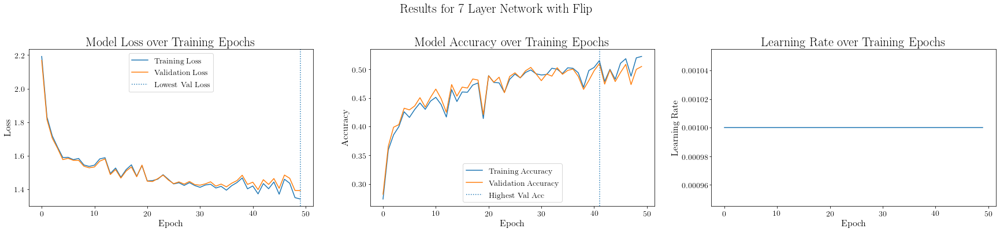

Lowest Validation Loss: 1.3928 - Epoch: 49
Highest Validation Accuracy: 51.0000% - Epoch 41


In [ ]:
plot_results_cl(model_7flip_result, "Results for 7 Layer Network with Flip")

### Results

In [ ]:
# Training Result
train_dataset_model.flip = False
model_7flip_result_tr = test_classification(model_7flip, train_dataset_model,
                                            train_dataset_model.n_images,
                                            device)

Overall Accuracy (Top 1, Top 2, Top 3): 51.889772%, 63.933779%, 68.539769%
    
Accuracy: 51.89%
    
Balanced Accuracy: 36.62%
    
F1 Score: 0.47
    

    
              precision    recall  f1-score   support

         0.0       0.55      0.94      0.70      8185
         1.0       0.00      0.00      0.00       290
         2.0       0.00      0.00      0.00       446
         3.0       0.00      0.00      0.00       921
         4.0       0.00      0.00      0.00      2266
         5.0       0.24      0.06      0.10      3311
         6.0       0.32      0.46      0.38      3883
         7.0       0.38      0.35      0.36      3572
         8.0       0.41      0.43      0.42      2916
         9.0       0.51      0.36      0.43      2237
        10.0       0.63      0.47      0.54      2182
        11.0       0.67      0.61      0.64      2440
        12.0       0.71      0.79      0.75      3055
        13.0       0.72      0.82      0.77      1912
        14.0       0.75      0

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
# Test Result
test_dataset.flip = False
model_7flip_results_tst = test_classification(model_7flip, test_dataset,
                                              test_dataset.n_images, device)

Overall Accuracy (Top 1, Top 2, Top 3): 50.852071%, 61.538462%, 66.556213%
    
Accuracy: 50.85%
    
Balanced Accuracy: 30.29%
    
F1 Score: 0.44
    

    
              precision    recall  f1-score   support

         0.0       0.62      0.92      0.74      3065
         1.0       0.00      0.00      0.00        92
         2.0       0.00      0.00      0.00       222
         3.0       0.00      0.00      0.00       388
         4.0       0.00      0.00      0.00       600
         5.0       0.20      0.05      0.07       680
         6.0       0.23      0.40      0.29       591
         7.0       0.26      0.25      0.25       473
         8.0       0.30      0.34      0.32       428
         9.0       0.39      0.26      0.31       372
        10.0       0.47      0.37      0.42       355
        11.0       0.53      0.51      0.52       418
        12.0       0.63      0.68      0.66       522
        13.0       0.54      0.64      0.58       221
        14.0       0.38      0

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


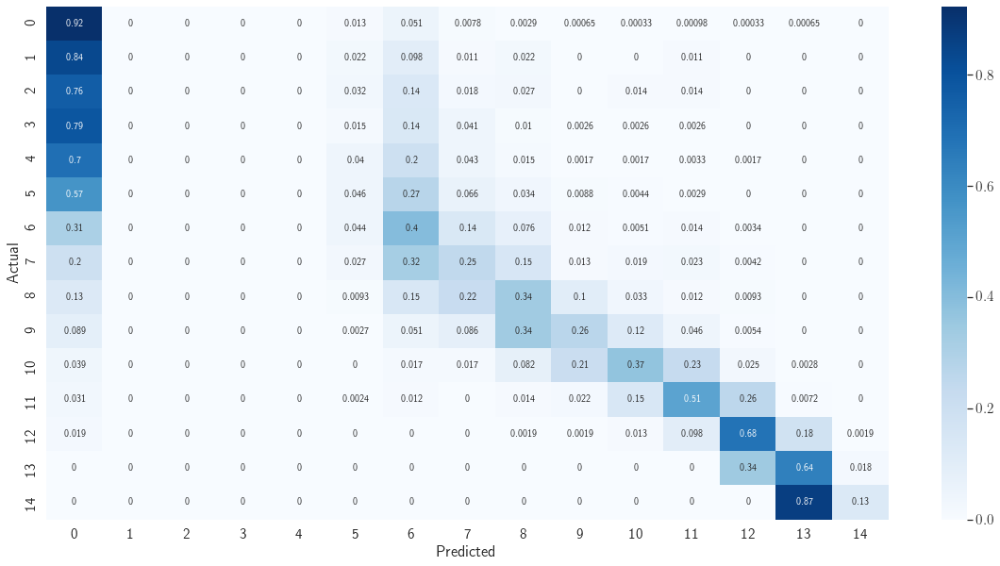

In [ ]:
confusion_matrix(model_7flip_results_tst)

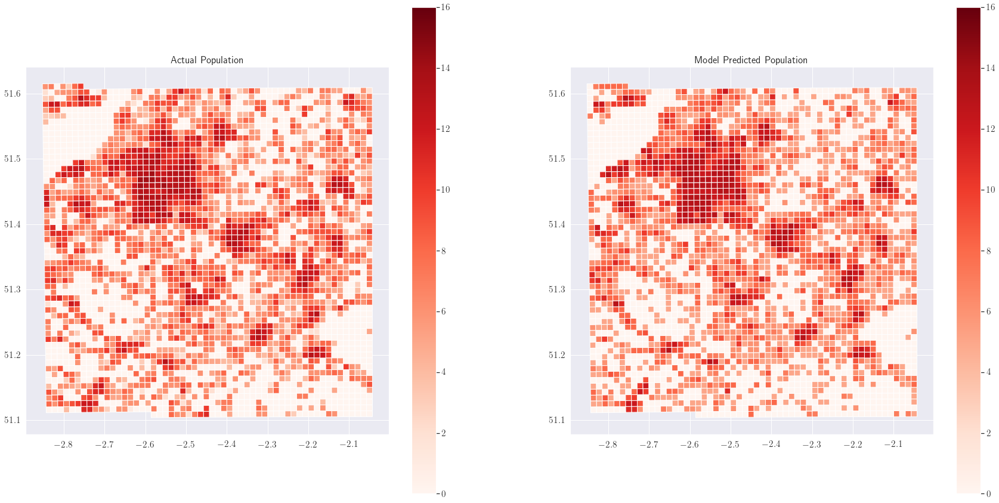

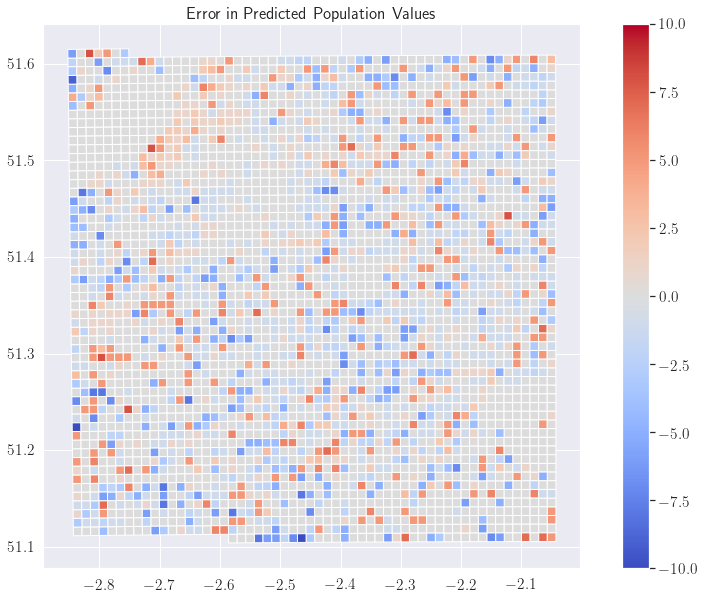

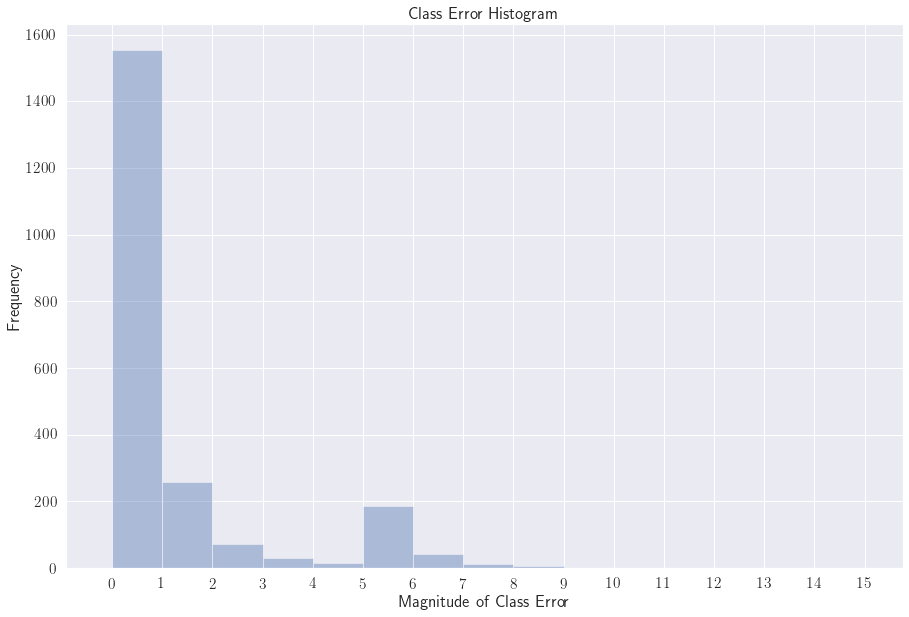

,Index,Population,Pred Class,Actual Class,Class Error,geometry
0,701240,0.0,0,0.0,0.0,"MULTIPOLYGON (((-2.80115 51.17466, -2.80130 51..."
1,701241,0.0,0,0.0,0.0,"MULTIPOLYGON (((-2.78685 51.17475, -2.78700 51..."
2,701242,0.0,5,0.0,5.0,"MULTIPOLYGON (((-2.77254 51.17485, -2.77269 51..."
3,701243,0.0,7,0.0,7.0,"MULTIPOLYGON (((-2.75824 51.17494, -2.75838 51..."
4,701244,0.0,0,0.0,0.0,"MULTIPOLYGON (((-2.74393 51.17504, -2.74407 51..."
...,...,...,...,...,...,...
3120,930,6397.0,13,13.0,0.0,"MULTIPOLYGON (((-2.53257 51.45497, -2.53267 51..."
3121,7290,2815.0,12,12.0,0.0,"MULTIPOLYGON (((-2.56124 51.44584, -2.56135 51..."
3122,318,9281.0,13,14.0,-1.0,"MULTIPOLYGON (((-2.61892 51.45454, -2.61904 51..."
3123,304,9365.0,13,14.0,-1.0,"MULTIPOLYGON (((-2.61904 51.46353, -2.61916 51..."


In [ ]:
shapefile_cl(model_7flip_results_tst)

# Model - 9 Layers

### Training

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model_9 = Neural_Network(config='9', batch_norm=True)
model_9 = model_9.float()
model_9.to(device)

summary(model_9, input_size=(7, 50, 33))

print("Model Loaded")

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 50, 33]           4,096
       BatchNorm2d-2           [-1, 64, 50, 33]             128
              ReLU-3           [-1, 64, 50, 33]               0
         MaxPool2d-4           [-1, 64, 25, 16]               0
            Conv2d-5          [-1, 128, 25, 16]          73,856
       BatchNorm2d-6          [-1, 128, 25, 16]             256
              ReLU-7          [-1, 128, 25, 16]               0
         MaxPool2d-8           [-1, 128, 12, 8]               0
            Conv2d-9           [-1, 256, 12, 8]         295,168
      BatchNorm2d-10           [-1, 256, 12, 8]             512
             ReLU-11           [-1, 256, 12, 8]               0
           Conv2d-12           [-1, 256, 12, 8]         590,080
      BatchNorm2d-13           [-1, 256, 12, 8]             512
             ReLU-14           [-1, 256

In [ ]:
model_9_result = run_training(model_9,
                              dataset=train_dataset_model,
                              t_loader=train_loader,
                              v_loader=val_loader,
                              max_epochs=50,
                              initial_lr=0.001,
                              pbar=False,
                              checkpoint=False,
                              save_as="9layers",
                              weight_decay=1e-5)

Epoch: 1
Training   | Avg loss: 2.4030 | Accuracy: 23.77% | Fbeta: 0.0334
Validation | Avg loss: 2.3872 | Accuracy: 23.97% | Fbeta: 0.0338
Epoch: 2
Training   | Avg loss: 2.3581 | Accuracy: 25.05% | Fbeta: 0.0369
Validation | Avg loss: 2.3483 | Accuracy: 25.55% | Fbeta: 0.0378
Epoch: 3
Training   | Avg loss: 1.9861 | Accuracy: 31.94% | Fbeta: 0.1199
Validation | Avg loss: 1.9824 | Accuracy: 32.34% | Fbeta: 0.1241
Epoch: 4
Training   | Avg loss: 1.8694 | Accuracy: 34.72% | Fbeta: 0.1256
Validation | Avg loss: 1.8538 | Accuracy: 35.55% | Fbeta: 0.1322
Epoch: 5
Training   | Avg loss: 1.7770 | Accuracy: 36.86% | Fbeta: 0.1482
Validation | Avg loss: 1.7656 | Accuracy: 36.87% | Fbeta: 0.1501
Epoch: 6
Training   | Avg loss: 1.8284 | Accuracy: 36.16% | Fbeta: 0.1444
Validation | Avg loss: 1.8151 | Accuracy: 37.74% | Fbeta: 0.1582
Epoch: 7
Training   | Avg loss: 1.7003 | Accuracy: 40.98% | Fbeta: 0.2026
Validation | Avg loss: 1.6962 | Accuracy: 41.05% | Fbeta: 0.2042
Epoch: 8
Training   | Avg l

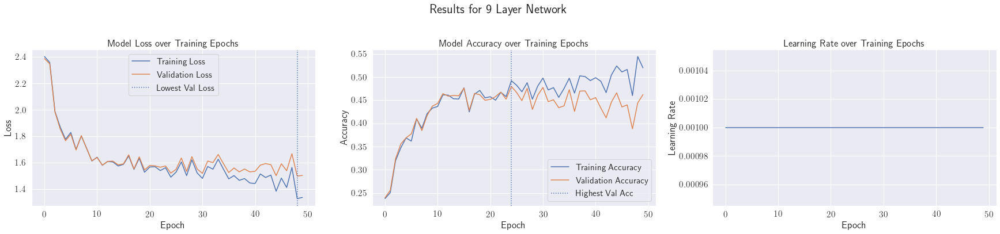

Lowest Validation Loss: 1.4988 - Epoch: 48
Highest Validation Accuracy: 47.9474% - Epoch 24


In [ ]:
plot_results_cl(model_9_result, "Results for 9 Layer Network")

### Results

In [ ]:
# Training Result
train_dataset_model.flip = False
model_9_result_tr = test_classification(model_9, train_dataset_model,
                                        train_dataset_model.n_images, device)

Overall Accuracy (Top 1, Top 2, Top 3): 51.308101%, 59.469916%, 63.257356%
    
Accuracy: 51.31%
    
Balanced Accuracy: 34.19%
    
F1 Score: 0.46
    

    
              precision    recall  f1-score   support

         0.0       0.66      0.95      0.78      8185
         1.0       0.00      0.00      0.00       290
         2.0       0.00      0.00      0.00       446
         3.0       0.00      0.00      0.00       921
         4.0       0.00      0.00      0.00      2266
         5.0       0.25      0.64      0.36      3311
         6.0       0.24      0.12      0.16      3883
         7.0       0.37      0.27      0.31      3572
         8.0       0.49      0.33      0.39      2916
         9.0       0.72      0.23      0.35      2237
        10.0       0.61      0.75      0.68      2182
        11.0       0.73      0.72      0.72      2440
        12.0       0.59      0.90      0.71      3055
        13.0       0.63      0.22      0.33      1912
        14.0       0.82      0

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
# Test Result
test_dataset.flip = False
model_9_results_tst = test_classification(model_9, test_dataset,
                                          test_dataset.n_images, device)

Overall Accuracy (Top 1, Top 2, Top 3): 46.840237%, 56.840237%, 62.295858%
    
Accuracy: 46.84%
    
Balanced Accuracy: 26.15%
    
F1 Score: 0.42
    

    
              precision    recall  f1-score   support

         0.0       0.66      0.82      0.73      3065
         1.0       0.00      0.00      0.00        92
         2.0       0.00      0.00      0.00       222
         3.0       0.00      0.00      0.00       388
         4.0       0.00      0.00      0.00       600
         5.0       0.15      0.43      0.22       680
         6.0       0.24      0.12      0.16       591
         7.0       0.20      0.16      0.18       473
         8.0       0.37      0.26      0.30       428
         9.0       0.47      0.12      0.19       372
        10.0       0.46      0.57      0.51       355
        11.0       0.51      0.50      0.50       418
        12.0       0.57      0.82      0.67       522
        13.0       0.60      0.14      0.23       221
        14.0       0.00      0

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


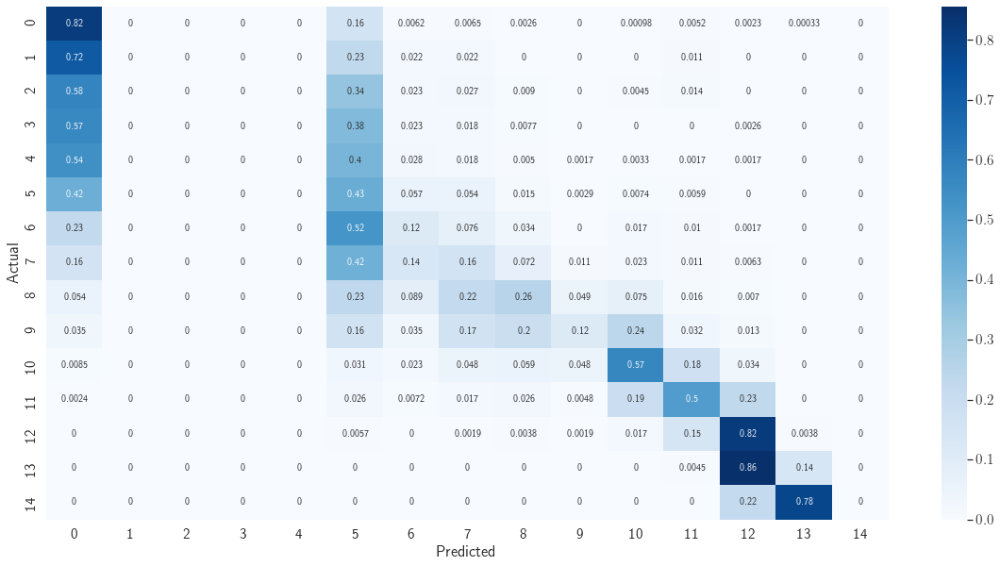

In [ ]:
confusion_matrix(model_9_results_tst)

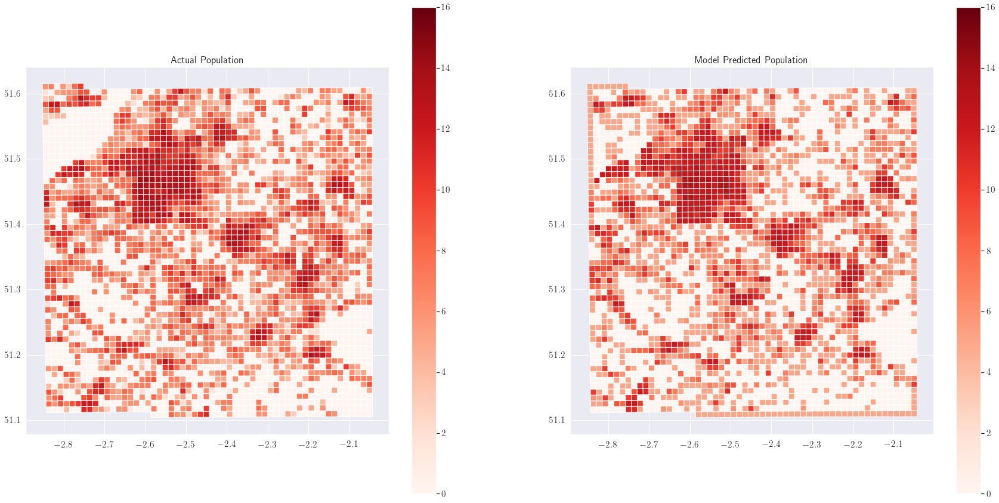

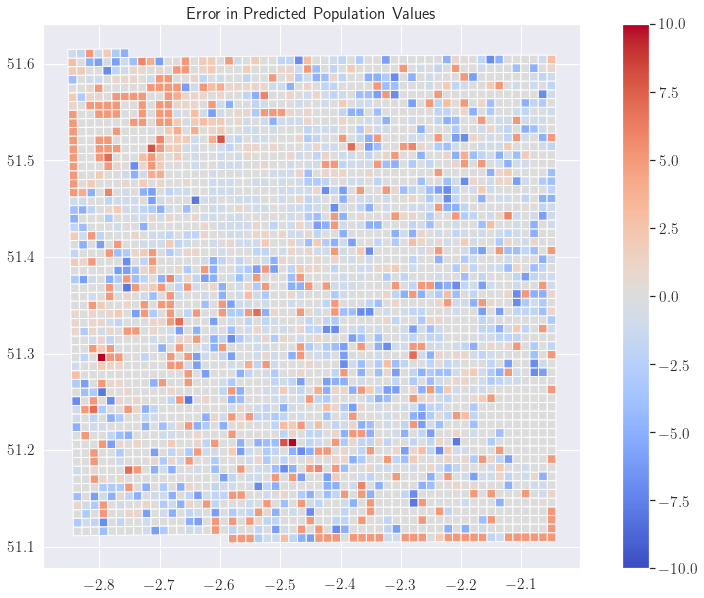

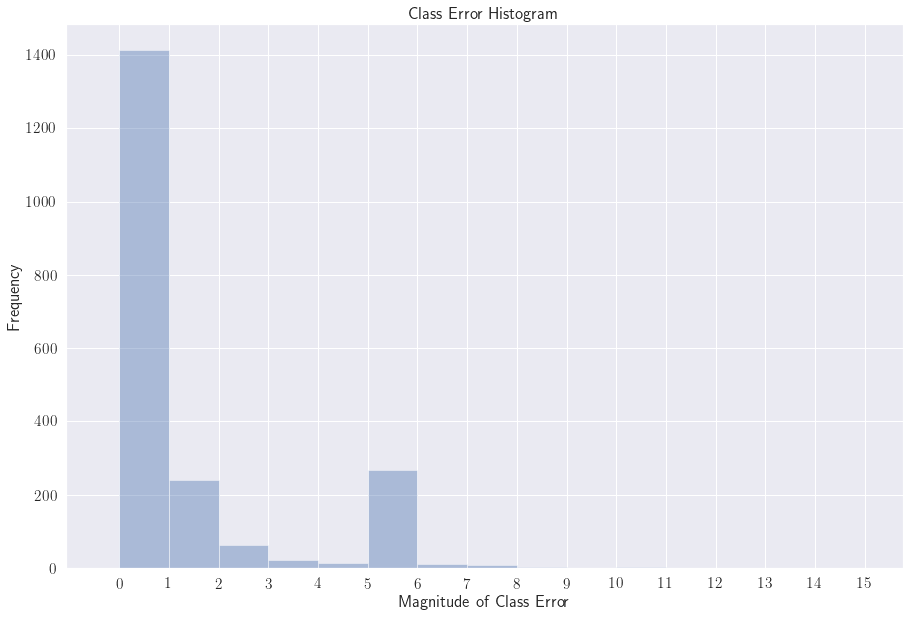

,Index,Population,Pred Class,Actual Class,Class Error,geometry
0,701240,0.0,0,0.0,0.0,"MULTIPOLYGON (((-2.80115 51.17466, -2.80130 51..."
1,701241,0.0,0,0.0,0.0,"MULTIPOLYGON (((-2.78685 51.17475, -2.78700 51..."
2,701242,0.0,0,0.0,0.0,"MULTIPOLYGON (((-2.77254 51.17485, -2.77269 51..."
3,701243,0.0,7,0.0,7.0,"MULTIPOLYGON (((-2.75824 51.17494, -2.75838 51..."
4,701244,0.0,5,0.0,5.0,"MULTIPOLYGON (((-2.74393 51.17504, -2.74407 51..."
...,...,...,...,...,...,...
3120,930,6397.0,13,13.0,0.0,"MULTIPOLYGON (((-2.53257 51.45497, -2.53267 51..."
3121,7290,2815.0,12,12.0,0.0,"MULTIPOLYGON (((-2.56124 51.44584, -2.56135 51..."
3122,318,9281.0,13,14.0,-1.0,"MULTIPOLYGON (((-2.61892 51.45454, -2.61904 51..."
3123,304,9365.0,13,14.0,-1.0,"MULTIPOLYGON (((-2.61904 51.46353, -2.61916 51..."


In [ ]:
shapefile_cl(model_9_results_tst)

# Model - 11 Layers

### Training

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model_11 = Neural_Network(config='11', batch_norm=True)
model_11 = model_11.float()
model_11.to(device)

summary(model_11, input_size=(7, 50, 33))

print("Model Loaded")

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 50, 33]           4,096
       BatchNorm2d-2           [-1, 64, 50, 33]             128
              ReLU-3           [-1, 64, 50, 33]               0
         MaxPool2d-4           [-1, 64, 25, 16]               0
            Conv2d-5          [-1, 128, 25, 16]          73,856
       BatchNorm2d-6          [-1, 128, 25, 16]             256
              ReLU-7          [-1, 128, 25, 16]               0
         MaxPool2d-8           [-1, 128, 12, 8]               0
            Conv2d-9           [-1, 256, 12, 8]         295,168
      BatchNorm2d-10           [-1, 256, 12, 8]             512
             ReLU-11           [-1, 256, 12, 8]               0
           Conv2d-12           [-1, 256, 12, 8]         590,080
      BatchNorm2d-13           [-1, 256, 12, 8]             512
             ReLU-14           [-1, 256

In [ ]:
model_11_result = run_training(model_11,
                               dataset=train_dataset_model,
                               t_loader=train_loader,
                               v_loader=val_loader,
                               max_epochs=50,
                               initial_lr=0.001,
                               pbar=False,
                               checkpoint=False,
                               save_as="11layers",
                               weight_decay=1e-5)

Epoch: 1
Training   | Avg loss: 2.4184 | Accuracy: 23.34% | Fbeta: 0.0394
Validation | Avg loss: 2.4003 | Accuracy: 23.63% | Fbeta: 0.0378
Epoch: 2
Training   | Avg loss: 2.1761 | Accuracy: 27.59% | Fbeta: 0.0615
Validation | Avg loss: 2.1668 | Accuracy: 27.92% | Fbeta: 0.0632
Epoch: 3
Training   | Avg loss: 1.8672 | Accuracy: 33.72% | Fbeta: 0.1220
Validation | Avg loss: 1.8594 | Accuracy: 34.39% | Fbeta: 0.1308
Epoch: 4
Training   | Avg loss: 1.7289 | Accuracy: 37.45% | Fbeta: 0.1852
Validation | Avg loss: 1.7099 | Accuracy: 38.08% | Fbeta: 0.1909
Epoch: 5
Training   | Avg loss: 1.5978 | Accuracy: 42.36% | Fbeta: 0.2396
Validation | Avg loss: 1.5794 | Accuracy: 42.97% | Fbeta: 0.2429
Epoch: 6
Training   | Avg loss: 1.8029 | Accuracy: 34.46% | Fbeta: 0.1661
Validation | Avg loss: 1.7858 | Accuracy: 35.42% | Fbeta: 0.1705
Epoch: 7
Training   | Avg loss: 1.5224 | Accuracy: 43.49% | Fbeta: 0.2377
Validation | Avg loss: 1.5236 | Accuracy: 43.39% | Fbeta: 0.2356
Epoch: 8
Training   | Avg l

In [ ]:
parameters = torch.load('/content/drive/My Drive/Dissertation Files/Models/11layers_LowestLossEpoch18')
model_11.load_state_dict(parameters['model'])

<All keys matched successfully>

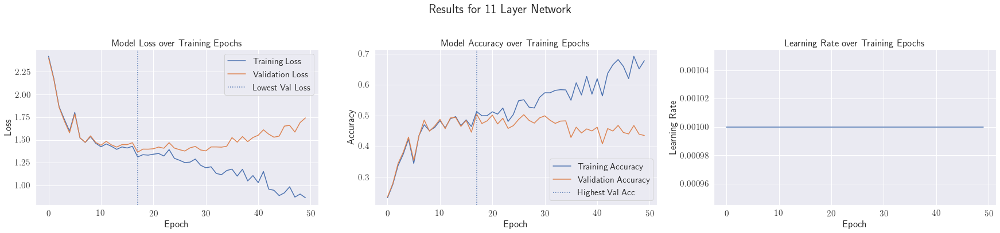

Lowest Validation Loss: 1.3670 - Epoch: 17
Highest Validation Accuracy: 50.4474% - Epoch 17


In [ ]:
plot_results_cl(model_11_result, "Results for 11 Layer Network")

### Results

In [ ]:
# Training Result
train_dataset_model.flip = False
model_11_result_tr = test_classification(model_11, train_dataset_model,
                                         train_dataset_model.n_images, device)

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Overall Accuracy (Top 1, Top 2, Top 3): 65.320840%, 72.621993%, 75.259251%
    
Accuracy: 65.32%
    
Balanced Accuracy: 46.51%
    
F1 Score: 0.64
    

    
              precision    recall  f1-score   support

         0.0       0.92      0.93      0.92      8185
         1.0       0.00      0.00      0.00       290
         2.0       0.00      0.00      0.00       446
         3.0       0.00      0.00      0.00       921
         4.0       0.33      0.37      0.35      2266
         5.0       0.38      0.80      0.52      3311
         6.0       0.63      0.27      0.37      3883
         7.0       0.59      0.73      0.65      3572
         8.0       0.69      0.55      0.61      2916
         9.0       0.70      0.64      0.67      2237
        10.0       0.63      0.76      0.68      2182
        11.0       0.73      0.64      0.68      2440
        12.0       0.79      0.77      0.78      3055
        13.0       0.76      0.71      0.73      1912
        14.0       0.87      0

In [ ]:
# Test Result
test_dataset.flip = False
model_11_results_tst = test_classification(model_11, test_dataset,
                                           test_dataset.n_images, device)

Overall Accuracy (Top 1, Top 2, Top 3): 42.615385%, 50.934911%, 56.591716%
    
Accuracy: 42.62%
    
Balanced Accuracy: 27.81%
    
F1 Score: 0.43
    

    
              precision    recall  f1-score   support

         0.0       0.73      0.68      0.70      3065
         1.0       0.00      0.00      0.00        92
         2.0       0.00      0.00      0.00       222
         3.0       0.00      0.00      0.00       388
         4.0       0.12      0.19      0.15       600
         5.0       0.16      0.39      0.23       680
         6.0       0.24      0.11      0.15       591
         7.0       0.20      0.28      0.23       473
         8.0       0.30      0.27      0.28       428
         9.0       0.33      0.33      0.33       372
        10.0       0.37      0.44      0.40       355
        11.0       0.50      0.42      0.46       418
        12.0       0.66      0.50      0.57       522
        13.0       0.63      0.53      0.57       221
        14.0       0.50      0

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


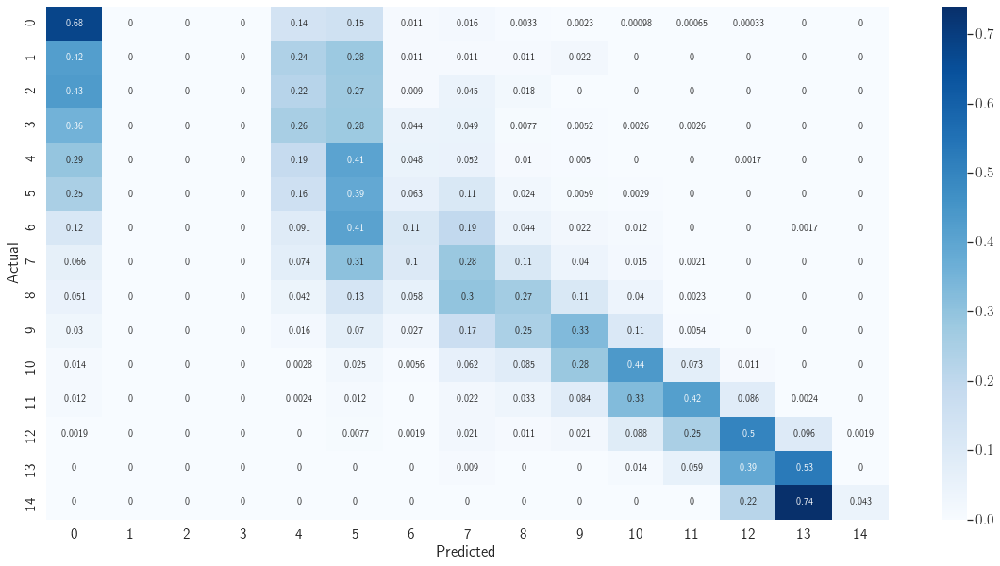

In [ ]:
confusion_matrix(model_11_results_tst)

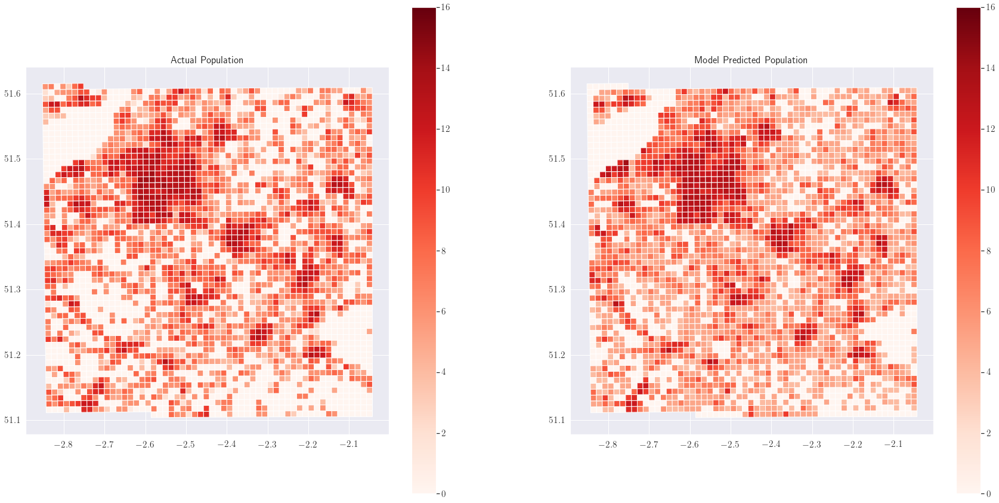

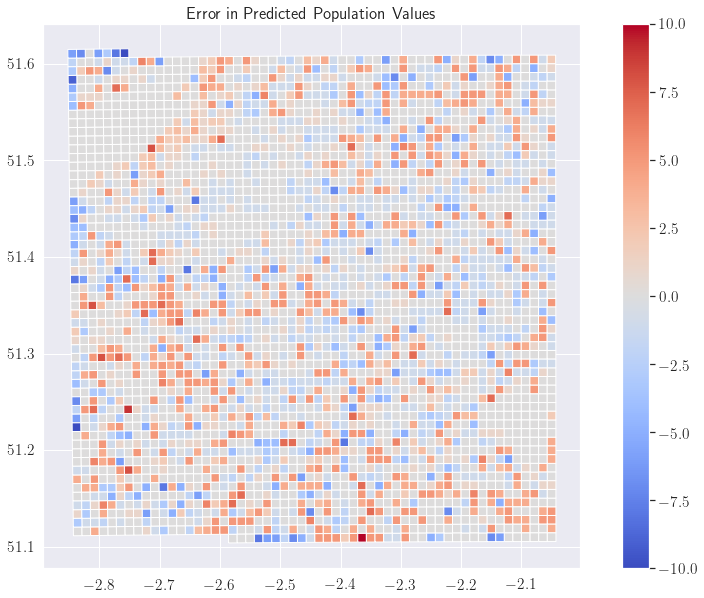

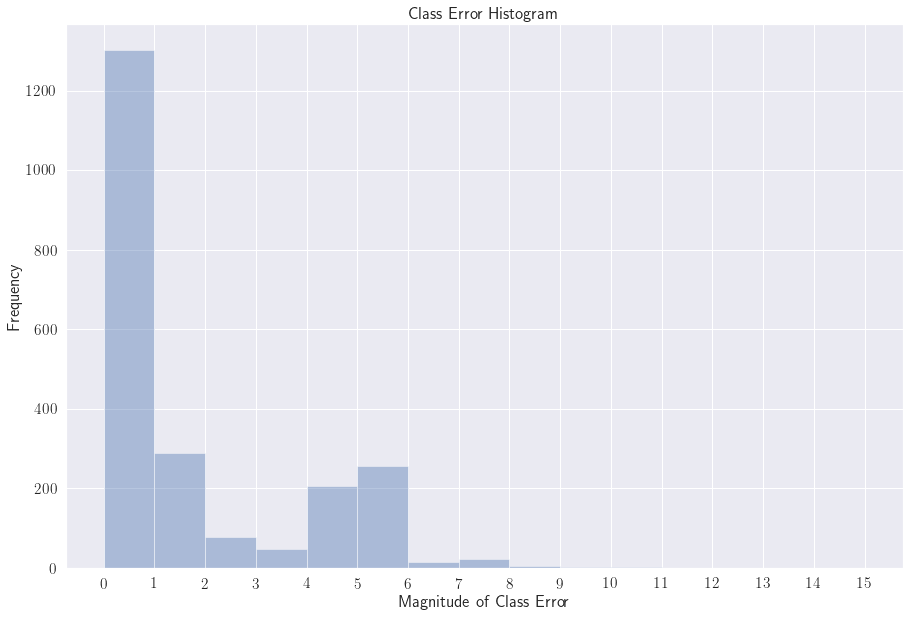

,Index,Population,Pred Class,Actual Class,Class Error,geometry
0,701240,0.0,0,0.0,0.0,"MULTIPOLYGON (((-2.80115 51.17466, -2.80130 51..."
1,701241,0.0,0,0.0,0.0,"MULTIPOLYGON (((-2.78685 51.17475, -2.78700 51..."
2,701242,0.0,5,0.0,5.0,"MULTIPOLYGON (((-2.77254 51.17485, -2.77269 51..."
3,701243,0.0,8,0.0,8.0,"MULTIPOLYGON (((-2.75824 51.17494, -2.75838 51..."
4,701244,0.0,4,0.0,4.0,"MULTIPOLYGON (((-2.74393 51.17504, -2.74407 51..."
...,...,...,...,...,...,...
3120,930,6397.0,13,13.0,0.0,"MULTIPOLYGON (((-2.53257 51.45497, -2.53267 51..."
3121,7290,2815.0,11,12.0,-1.0,"MULTIPOLYGON (((-2.56124 51.44584, -2.56135 51..."
3122,318,9281.0,13,14.0,-1.0,"MULTIPOLYGON (((-2.61892 51.45454, -2.61904 51..."
3123,304,9365.0,13,14.0,-1.0,"MULTIPOLYGON (((-2.61904 51.46353, -2.61916 51..."


In [ ]:
shapefile_cl(model_11_results_tst)

# Model - 16 layers

### Training

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model_16 = Neural_Network(config='16', batch_norm=True)
model_16 = model_16.float()
model_16.to(device)

summary(model_16, input_size=(7, 50, 33))

print("Model Loaded")

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 50, 33]           4,096
       BatchNorm2d-2           [-1, 64, 50, 33]             128
              ReLU-3           [-1, 64, 50, 33]               0
            Conv2d-4           [-1, 64, 50, 33]          36,928
       BatchNorm2d-5           [-1, 64, 50, 33]             128
              ReLU-6           [-1, 64, 50, 33]               0
         MaxPool2d-7           [-1, 64, 25, 16]               0
            Conv2d-8          [-1, 128, 25, 16]          73,856
       BatchNorm2d-9          [-1, 128, 25, 16]             256
             ReLU-10          [-1, 128, 25, 16]               0
           Conv2d-11          [-1, 128, 25, 16]         147,584
      BatchNorm2d-12          [-1, 128, 25, 16]             256
             ReLU-13          [-1, 128, 25, 16]               0
        MaxPool2d-14           [-1, 128

In [ ]:
model_16_result = run_training(model_16,
                               dataset=train_dataset_model,
                               t_loader=train_loader,
                               v_loader=val_loader,
                               max_epochs=50,
                               initial_lr=0.001,
                               pbar=False,
                               checkpoint=False,
                               save_as="16layers",
                               weight_decay=1e-5)

Epoch: 1
Training   | Avg loss: 2.4438 | Accuracy: 22.32% | Fbeta: 0.0372
Validation | Avg loss: 2.4218 | Accuracy: 22.76% | Fbeta: 0.0381
Epoch: 2
Training   | Avg loss: 2.4032 | Accuracy: 23.26% | Fbeta: 0.0337
Validation | Avg loss: 2.3880 | Accuracy: 23.95% | Fbeta: 0.0362
Epoch: 3
Training   | Avg loss: 2.1325 | Accuracy: 30.26% | Fbeta: 0.1110
Validation | Avg loss: 2.1197 | Accuracy: 30.34% | Fbeta: 0.1101
Epoch: 4
Training   | Avg loss: 1.8589 | Accuracy: 34.32% | Fbeta: 0.1209
Validation | Avg loss: 1.8341 | Accuracy: 33.76% | Fbeta: 0.1156
Epoch: 5
Training   | Avg loss: 1.6650 | Accuracy: 40.96% | Fbeta: 0.2339
Validation | Avg loss: 1.6619 | Accuracy: 40.79% | Fbeta: 0.2282
Epoch: 6
Training   | Avg loss: 1.7300 | Accuracy: 37.76% | Fbeta: 0.2000
Validation | Avg loss: 1.7284 | Accuracy: 38.11% | Fbeta: 0.1972
Epoch: 7
Training   | Avg loss: 1.5051 | Accuracy: 45.41% | Fbeta: 0.2578
Validation | Avg loss: 1.5076 | Accuracy: 46.21% | Fbeta: 0.2649
Epoch: 8
Training   | Avg l

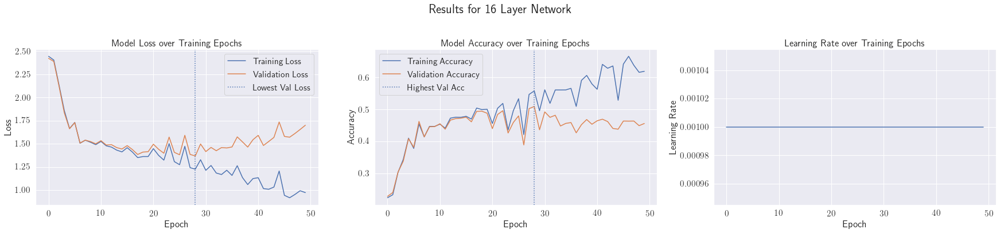

Lowest Validation Loss: 1.3685 - Epoch: 28
Highest Validation Accuracy: 50.8684% - Epoch 28


In [ ]:
plot_results_cl(model_16_result, "Results for 16 Layer Network")

### Results

In [ ]:
# Training Result
train_dataset_model.flip = False
model_16_result_tr = test_classification(model_16, train_dataset_model,
                                         train_dataset_model.n_images, device)

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Overall Accuracy (Top 1, Top 2, Top 3): 60.349002%, 68.008107%, 70.353214%
    
Accuracy: 60.35%
    
Balanced Accuracy: 41.99%
    
F1 Score: 0.58
    

    
              precision    recall  f1-score   support

         0.0       0.85      0.95      0.90      8185
         1.0       0.00      0.00      0.00       290
         2.0       0.00      0.00      0.00       446
         3.0       0.00      0.00      0.00       921
         4.0       0.36      0.46      0.41      2266
         5.0       0.36      0.66      0.46      3311
         6.0       0.36      0.34      0.35      3883
         7.0       0.40      0.30      0.34      3572
         8.0       0.52      0.43      0.47      2916
         9.0       0.82      0.29      0.43      2237
        10.0       0.67      0.87      0.75      2182
        11.0       0.83      0.74      0.78      2440
        12.0       0.86      0.70      0.77      3055
        13.0       0.63      0.93      0.75      1912
        14.0       0.85      0

In [ ]:
# Test Result
test_dataset.flip = False
model_16_results_tst = test_classification(model_16, test_dataset,
                                           test_dataset.n_images, device)

Overall Accuracy (Top 1, Top 2, Top 3): 44.863905%, 53.893491%, 58.343195%
    
Accuracy: 44.86%
    
Balanced Accuracy: 29.52%
    
F1 Score: 0.44
    

    
              precision    recall  f1-score   support

         0.0       0.72      0.72      0.72      3065
         1.0       0.00      0.00      0.00        92
         2.0       0.00      0.00      0.00       222
         3.0       0.00      0.00      0.00       388
         4.0       0.13      0.21      0.16       600
         5.0       0.16      0.32      0.21       680
         6.0       0.19      0.20      0.20       591
         7.0       0.19      0.14      0.16       473
         8.0       0.32      0.28      0.30       428
         9.0       0.46      0.16      0.24       372
        10.0       0.45      0.58      0.51       355
        11.0       0.61      0.49      0.54       418
        12.0       0.68      0.57      0.62       522
        13.0       0.52      0.75      0.61       221
        14.0       0.00      0

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


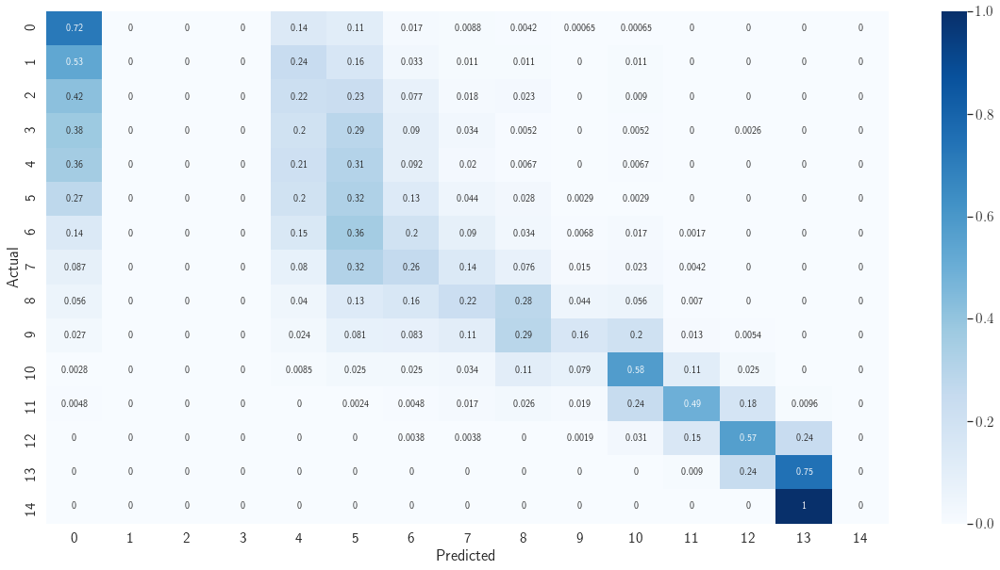

In [ ]:
confusion_matrix(model_16_results_tst)

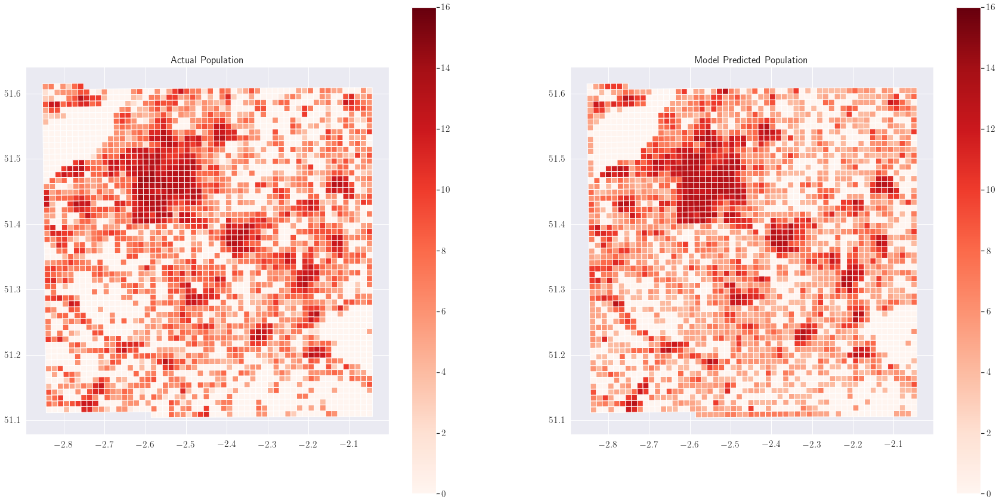

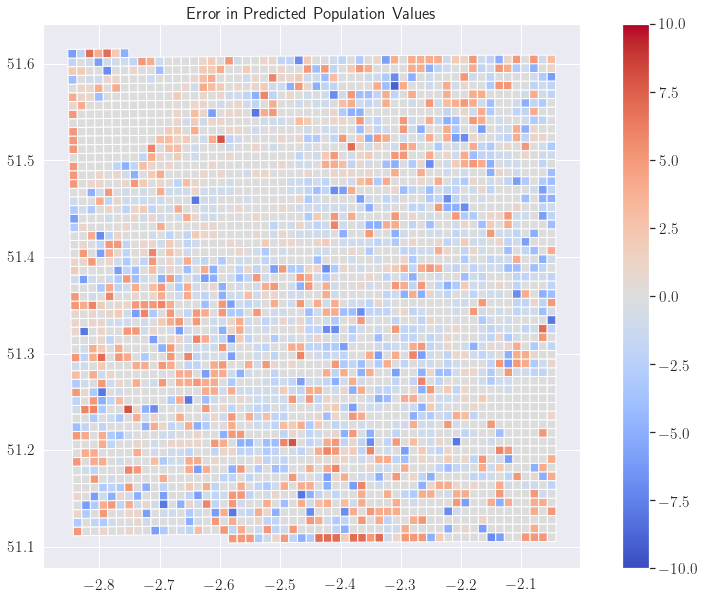

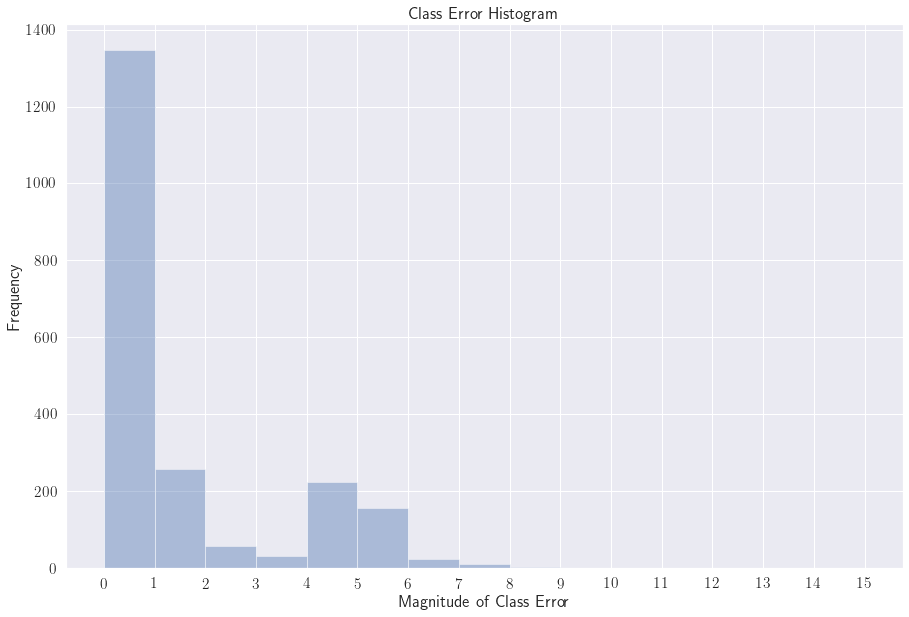

,Index,Population,Pred Class,Actual Class,Class Error,geometry
0,701240,0.0,0,0.0,0.0,"MULTIPOLYGON (((-2.80115 51.17466, -2.80130 51..."
1,701241,0.0,0,0.0,0.0,"MULTIPOLYGON (((-2.78685 51.17475, -2.78700 51..."
2,701242,0.0,0,0.0,0.0,"MULTIPOLYGON (((-2.77254 51.17485, -2.77269 51..."
3,701243,0.0,6,0.0,6.0,"MULTIPOLYGON (((-2.75824 51.17494, -2.75838 51..."
4,701244,0.0,5,0.0,5.0,"MULTIPOLYGON (((-2.74393 51.17504, -2.74407 51..."
...,...,...,...,...,...,...
3120,930,6397.0,13,13.0,0.0,"MULTIPOLYGON (((-2.53257 51.45497, -2.53267 51..."
3121,7290,2815.0,12,12.0,0.0,"MULTIPOLYGON (((-2.56124 51.44584, -2.56135 51..."
3122,318,9281.0,13,14.0,-1.0,"MULTIPOLYGON (((-2.61892 51.45454, -2.61904 51..."
3123,304,9365.0,13,14.0,-1.0,"MULTIPOLYGON (((-2.61904 51.46353, -2.61916 51..."


In [ ]:
shapefile_cl(model_16_results_tst)

# Model - 16 layers (flip 0.25)

### Training

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model_16flip = Neural_Network(config='16', batch_norm=True)
model_16flip = model_16flip.float()
model_16flip.to(device)

summary(model_16flip, input_size=(7, 50, 33))

print("Model Loaded")

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 50, 33]           4,096
       BatchNorm2d-2           [-1, 64, 50, 33]             128
              ReLU-3           [-1, 64, 50, 33]               0
            Conv2d-4           [-1, 64, 50, 33]          36,928
       BatchNorm2d-5           [-1, 64, 50, 33]             128
              ReLU-6           [-1, 64, 50, 33]               0
         MaxPool2d-7           [-1, 64, 25, 16]               0
            Conv2d-8          [-1, 128, 25, 16]          73,856
       BatchNorm2d-9          [-1, 128, 25, 16]             256
             ReLU-10          [-1, 128, 25, 16]               0
           Conv2d-11          [-1, 128, 25, 16]         147,584
      BatchNorm2d-12          [-1, 128, 25, 16]             256
             ReLU-13          [-1, 128, 25, 16]               0
        MaxPool2d-14           [-1, 128

In [ ]:
model_16flip_result = run_training(model_16flip,
                                   dataset=train_dataset_model,
                                   t_loader=train_loader,
                                   v_loader=val_loader,
                                   max_epochs=50,
                                   initial_lr=0.001,
                                   flip=True,
                                   flip_prob=0.25,
                                   pbar=False,
                                   checkpoint=False,
                                   save_as="16layersflip",
                                   weight_decay=1e-5)

Epoch: 1
Training   | Avg loss: 2.4375 | Accuracy: 22.82% | Fbeta: 0.0319
Validation | Avg loss: 2.4222 | Accuracy: 23.16% | Fbeta: 0.0322
Epoch: 2
Training   | Avg loss: 2.4180 | Accuracy: 23.23% | Fbeta: 0.0338
Validation | Avg loss: 2.4041 | Accuracy: 23.61% | Fbeta: 0.0341
Epoch: 3
Training   | Avg loss: 2.3174 | Accuracy: 26.26% | Fbeta: 0.0487
Validation | Avg loss: 2.3251 | Accuracy: 26.24% | Fbeta: 0.0473
Epoch: 4
Training   | Avg loss: 1.8780 | Accuracy: 34.46% | Fbeta: 0.1501
Validation | Avg loss: 1.8647 | Accuracy: 34.97% | Fbeta: 0.1542
Epoch: 5
Training   | Avg loss: 1.7670 | Accuracy: 36.89% | Fbeta: 0.1351
Validation | Avg loss: 1.7461 | Accuracy: 36.84% | Fbeta: 0.1348
Epoch: 6
Training   | Avg loss: 1.6792 | Accuracy: 40.33% | Fbeta: 0.2229
Validation | Avg loss: 1.6444 | Accuracy: 41.37% | Fbeta: 0.2329
Epoch: 7
Training   | Avg loss: 1.6564 | Accuracy: 42.09% | Fbeta: 0.2217
Validation | Avg loss: 1.6235 | Accuracy: 43.24% | Fbeta: 0.2293
Epoch: 8
Training   | Avg l

findfont: Font family ['serif'] not found. Falling back to DejaVu Sans.


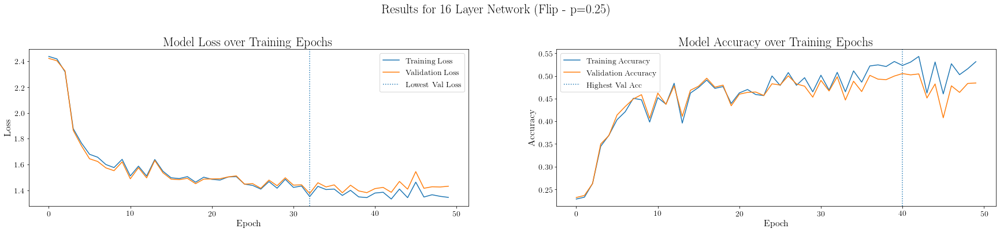

Lowest Validation Loss: 1.3759 - Epoch: 32
Highest Validation Accuracy: 50.5263% - Epoch 40


In [ ]:
plot_results_cl(model_16flip_result, "Results for 16 Layer Network (Flip - p=0.25)")

### Results

In [ ]:
# Training Result
train_dataset_model.flip = False
model_16flip_result_tr = test_classification(model_16flip, train_dataset_model,
                                             train_dataset_model.n_images,
                                             device)

Overall Accuracy (Top 1, Top 2, Top 3): 52.626731%, 63.238932%, 67.905459%
    
Accuracy: 52.63%
    
Balanced Accuracy: 39.12%
    
F1 Score: 0.49
    

    
              precision    recall  f1-score   support

         0.0       0.65      0.92      0.76      8185
         1.0       0.00      0.00      0.00       290
         2.0       0.00      0.00      0.00       446
         3.0       0.00      0.00      0.00       921
         4.0       0.00      0.00      0.00      2266
         5.0       0.28      0.51      0.36      3311
         6.0       0.33      0.43      0.37      3883
         7.0       0.35      0.21      0.26      3572
         8.0       0.47      0.29      0.36      2916
         9.0       0.49      0.52      0.51      2237
        10.0       0.71      0.32      0.44      2182
        11.0       0.65      0.82      0.72      2440
        12.0       0.84      0.63      0.72      3055
        13.0       0.69      0.76      0.72      1912
        14.0       0.52      0

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
# Test Result
test_dataset.flip = False
model_16flip_results_tst = test_classification(model_16flip, test_dataset,
                                               test_dataset.n_images, device)

Overall Accuracy (Top 1, Top 2, Top 3): 49.420118%, 59.727811%, 64.994083%
    
Accuracy: 49.42%
    
Balanced Accuracy: 32.62%
    
F1 Score: 0.44
    

    
              precision    recall  f1-score   support

         0.0       0.65      0.87      0.75      3065
         1.0       0.00      0.00      0.00        92
         2.0       0.00      0.00      0.00       222
         3.0       0.00      0.00      0.00       388
         4.0       0.00      0.00      0.00       600
         5.0       0.20      0.35      0.25       680
         6.0       0.26      0.36      0.30       591
         7.0       0.21      0.15      0.18       473
         8.0       0.36      0.22      0.27       428
         9.0       0.38      0.41      0.39       372
        10.0       0.57      0.25      0.35       355
        11.0       0.51      0.61      0.56       418
        12.0       0.72      0.42      0.53       522
        13.0       0.52      0.68      0.59       221
        14.0       0.52      0

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


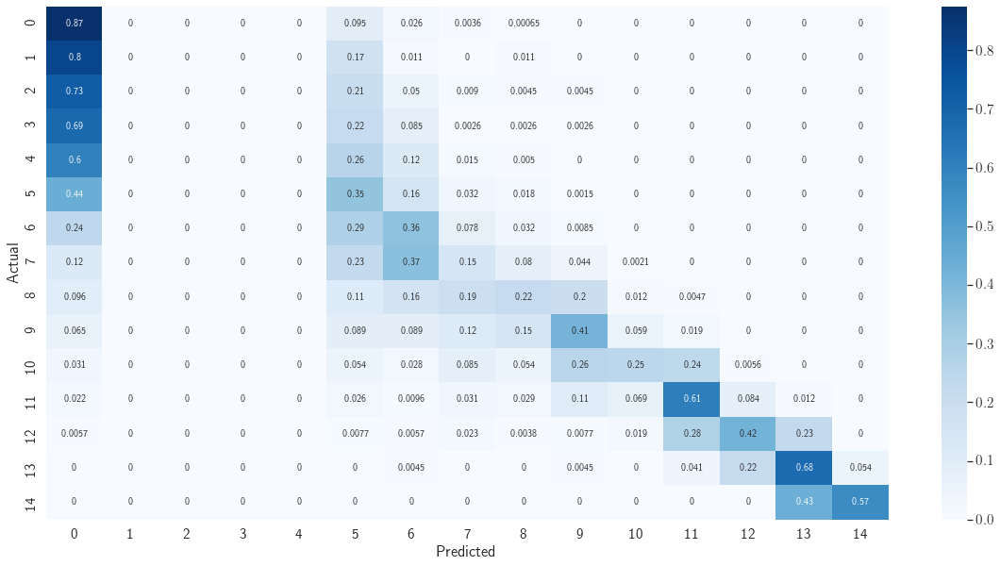

In [ ]:
confusion_matrix(model_16flip_results_tst)

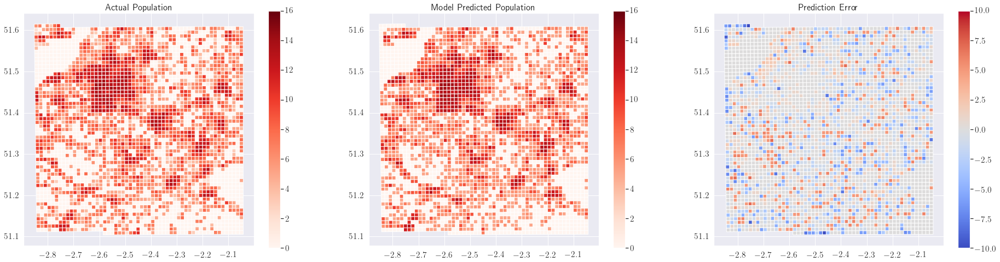

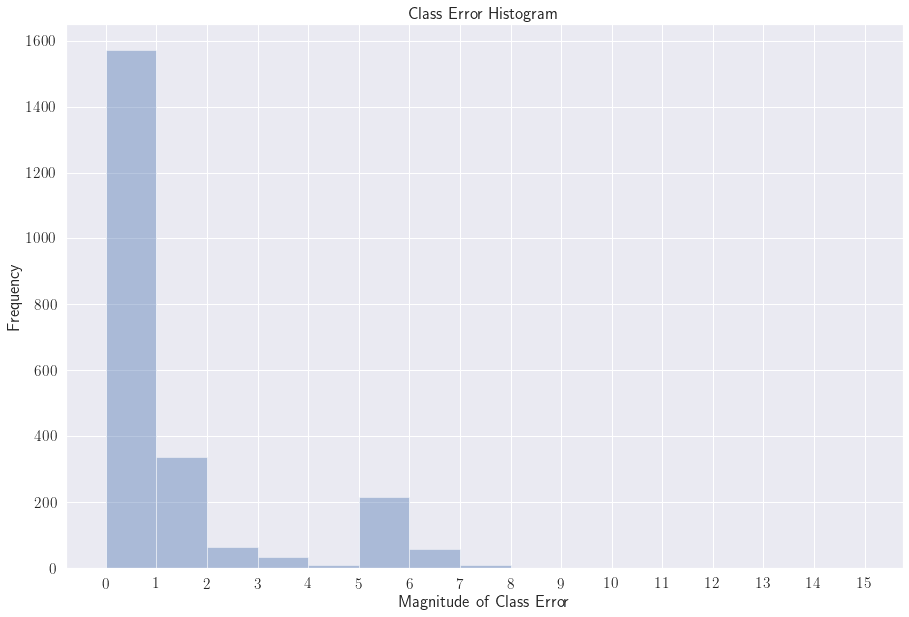

,Index,Population,Pred Class,Actual Class,Class Error,geometry
0,701240,0.0,0,0.0,0.0,"MULTIPOLYGON (((-2.80115 51.17466, -2.80130 51..."
1,701241,0.0,0,0.0,0.0,"MULTIPOLYGON (((-2.78685 51.17475, -2.78700 51..."
2,701242,0.0,5,0.0,5.0,"MULTIPOLYGON (((-2.77254 51.17485, -2.77269 51..."
3,701243,0.0,7,0.0,7.0,"MULTIPOLYGON (((-2.75824 51.17494, -2.75838 51..."
4,701244,0.0,5,0.0,5.0,"MULTIPOLYGON (((-2.74393 51.17504, -2.74407 51..."
...,...,...,...,...,...,...
3120,930,6397.0,13,13.0,0.0,"MULTIPOLYGON (((-2.53257 51.45497, -2.53267 51..."
3121,7290,2815.0,12,12.0,0.0,"MULTIPOLYGON (((-2.56124 51.44584, -2.56135 51..."
3122,318,9281.0,14,14.0,0.0,"MULTIPOLYGON (((-2.61892 51.45454, -2.61904 51..."
3123,304,9365.0,14,14.0,0.0,"MULTIPOLYGON (((-2.61904 51.46353, -2.61916 51..."


In [ ]:
shapefile_cl(model_16flip_results_tst)

# Model - 16 layers (flip 0.5)

### Training

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model_16flip2 = Neural_Network(config='16', batch_norm=True)
model_16flip2 = model_16flip2.float()
model_16flip2.to(device)

summary(model_16flip2, input_size=(7, 50, 33))

print("Model Loaded")

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 50, 33]           4,096
       BatchNorm2d-2           [-1, 64, 50, 33]             128
              ReLU-3           [-1, 64, 50, 33]               0
            Conv2d-4           [-1, 64, 50, 33]          36,928
       BatchNorm2d-5           [-1, 64, 50, 33]             128
              ReLU-6           [-1, 64, 50, 33]               0
         MaxPool2d-7           [-1, 64, 25, 16]               0
            Conv2d-8          [-1, 128, 25, 16]          73,856
       BatchNorm2d-9          [-1, 128, 25, 16]             256
             ReLU-10          [-1, 128, 25, 16]               0
           Conv2d-11          [-1, 128, 25, 16]         147,584
      BatchNorm2d-12          [-1, 128, 25, 16]             256
             ReLU-13          [-1, 128, 25, 16]               0
        MaxPool2d-14           [-1, 128

In [ ]:
model_16flip2_result = run_training(model_16flip2,
                                    dataset=train_dataset_model,
                                    t_loader=train_loader,
                                    v_loader=val_loader,
                                    max_epochs=50,
                                    initial_lr=0.001,
                                    flip=True,
                                    flip_prob=0.1,
                                    pbar=False,
                                    checkpoint=False,
                                    save_as="16layersflip2",
                                    weight_decay=1e-5)

Epoch: 1
Training   | Avg loss: 2.4364 | Accuracy: 22.45% | Fbeta: 0.0362
Validation | Avg loss: 2.4183 | Accuracy: 22.71% | Fbeta: 0.0389
Epoch: 2
Training   | Avg loss: 2.4423 | Accuracy: 23.33% | Fbeta: 0.0343
Validation | Avg loss: 2.4301 | Accuracy: 23.82% | Fbeta: 0.0350
Epoch: 3
Training   | Avg loss: 2.1385 | Accuracy: 29.53% | Fbeta: 0.1017
Validation | Avg loss: 2.1450 | Accuracy: 29.79% | Fbeta: 0.0987
Epoch: 4
Training   | Avg loss: 1.8324 | Accuracy: 33.77% | Fbeta: 0.1604
Validation | Avg loss: 1.8151 | Accuracy: 33.97% | Fbeta: 0.1593
Epoch: 5
Training   | Avg loss: 1.6889 | Accuracy: 39.96% | Fbeta: 0.2192
Validation | Avg loss: 1.6734 | Accuracy: 39.82% | Fbeta: 0.2159
Epoch: 6
Training   | Avg loss: 1.6208 | Accuracy: 39.98% | Fbeta: 0.1945
Validation | Avg loss: 1.5987 | Accuracy: 40.13% | Fbeta: 0.1950
Epoch: 7
Training   | Avg loss: 1.6283 | Accuracy: 40.33% | Fbeta: 0.2229
Validation | Avg loss: 1.6119 | Accuracy: 40.82% | Fbeta: 0.2267
Epoch: 8
Training   | Avg l

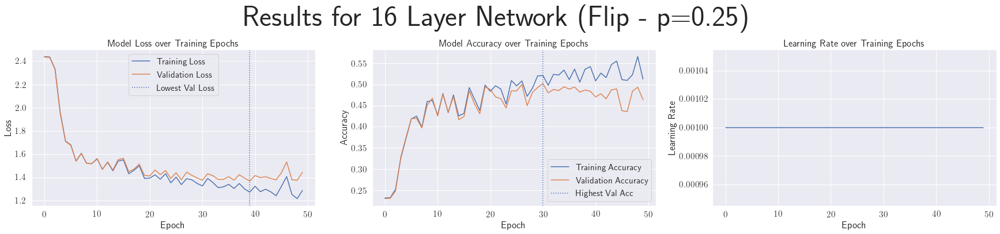

Lowest Validation Loss: 1.3703 - Epoch: 39
Highest Validation Accuracy: 50.1579% - Epoch 30


In [ ]:
plot_results_cl(model_16flip_result,
                "Results for 16 Layer Network (Flip - p=0.25)")

### Results

In [ ]:
# Training Result
train_dataset_model.flip = False
model_16flip_result_tr = test_classification(model_16flip, train_dataset_model,
                                             train_dataset_model.n_images,
                                             device)

Overall Accuracy (Top 1, Top 2, Top 3): 50.894878%, 63.231036%, 67.405380%
    
Accuracy: 50.89%
    
Balanced Accuracy: 37.87%
    
F1 Score: 0.47
    

    
              precision    recall  f1-score   support

         0.0       0.66      0.94      0.78      8185
         1.0       0.00      0.00      0.00       290
         2.0       0.00      0.00      0.00       446
         3.0       0.00      0.00      0.00       921
         4.0       0.00      0.00      0.00      2266
         5.0       0.27      0.64      0.38      3311
         6.0       0.33      0.18      0.24      3883
         7.0       0.41      0.30      0.35      3572
         8.0       0.43      0.43      0.43      2916
         9.0       0.63      0.16      0.26      2237
        10.0       0.61      0.63      0.62      2182
        11.0       0.70      0.68      0.69      2440
        12.0       0.78      0.53      0.63      3055
        13.0       0.50      0.57      0.53      1912
        14.0       0.29      0

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
# Test Result
test_dataset.flip = False
model_16flip_results_tst = test_classification(model_16flip, test_dataset,
                                               test_dataset.n_images, device)

Overall Accuracy (Top 1, Top 2, Top 3): 49.562130%, 60.674556%, 66.520710%
    
Accuracy: 49.56%
    
Balanced Accuracy: 34.07%
    
F1 Score: 0.44
    

    
              precision    recall  f1-score   support

         0.0       0.66      0.90      0.76      3065
         1.0       0.00      0.00      0.00        92
         2.0       0.00      0.00      0.00       222
         3.0       0.00      0.00      0.00       388
         4.0       0.00      0.00      0.00       600
         5.0       0.20      0.47      0.28       680
         6.0       0.23      0.12      0.16       591
         7.0       0.25      0.21      0.23       473
         8.0       0.35      0.33      0.34       428
         9.0       0.45      0.10      0.16       372
        10.0       0.52      0.48      0.50       355
        11.0       0.56      0.54      0.55       418
        12.0       0.65      0.44      0.52       522
        13.0       0.37      0.57      0.45       221
        14.0       0.20      0

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


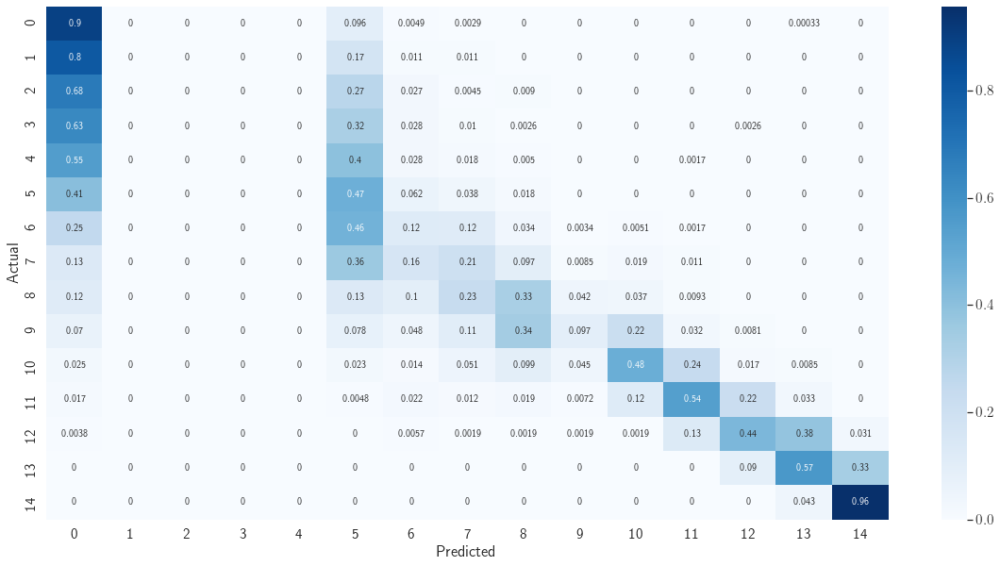

In [ ]:
confusion_matrix(model_16flip_results_tst)

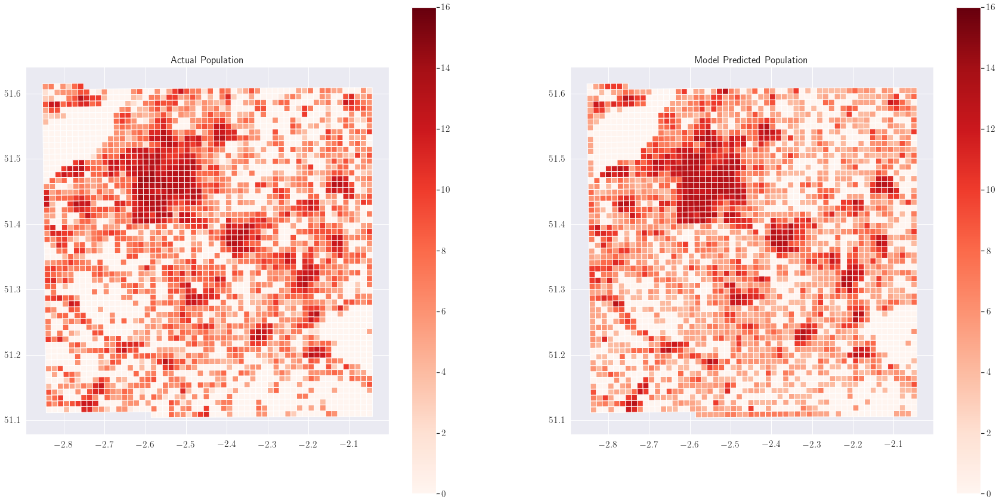

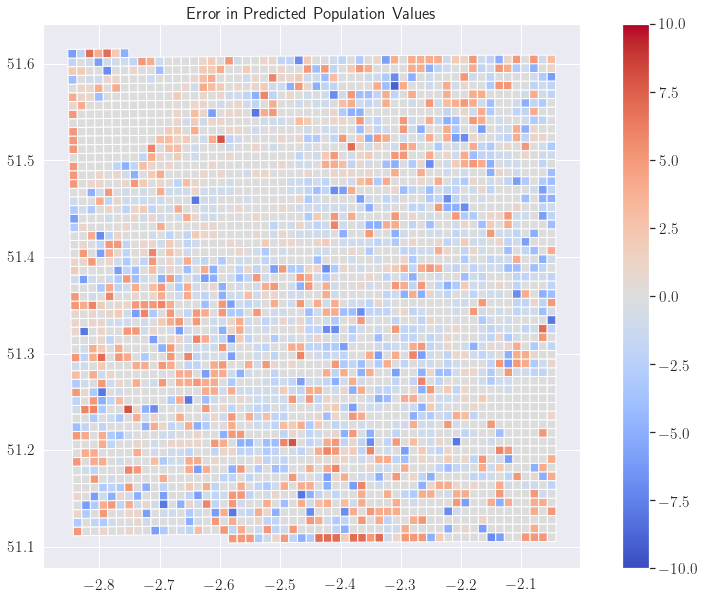

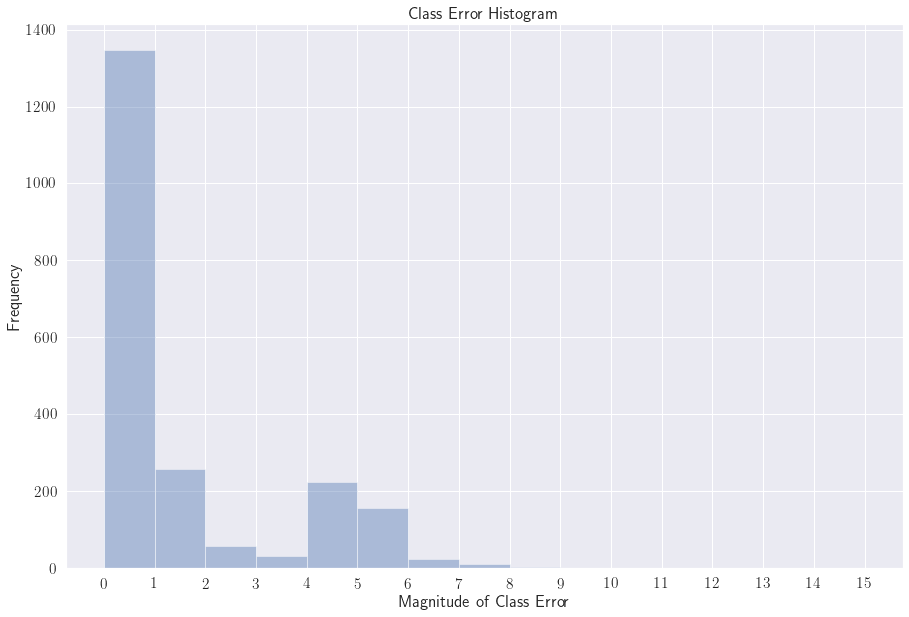

,Index,Population,Pred Class,Actual Class,Class Error,geometry
0,701240,0.0,0,0.0,0.0,"MULTIPOLYGON (((-2.80115 51.17466, -2.80130 51..."
1,701241,0.0,0,0.0,0.0,"MULTIPOLYGON (((-2.78685 51.17475, -2.78700 51..."
2,701242,0.0,0,0.0,0.0,"MULTIPOLYGON (((-2.77254 51.17485, -2.77269 51..."
3,701243,0.0,6,0.0,6.0,"MULTIPOLYGON (((-2.75824 51.17494, -2.75838 51..."
4,701244,0.0,5,0.0,5.0,"MULTIPOLYGON (((-2.74393 51.17504, -2.74407 51..."
...,...,...,...,...,...,...
3120,930,6397.0,13,13.0,0.0,"MULTIPOLYGON (((-2.53257 51.45497, -2.53267 51..."
3121,7290,2815.0,12,12.0,0.0,"MULTIPOLYGON (((-2.56124 51.44584, -2.56135 51..."
3122,318,9281.0,13,14.0,-1.0,"MULTIPOLYGON (((-2.61892 51.45454, -2.61904 51..."
3123,304,9365.0,13,14.0,-1.0,"MULTIPOLYGON (((-2.61904 51.46353, -2.61916 51..."


In [ ]:
shapefile_cl(model_16flip_results_tst)

# Model Comparisons

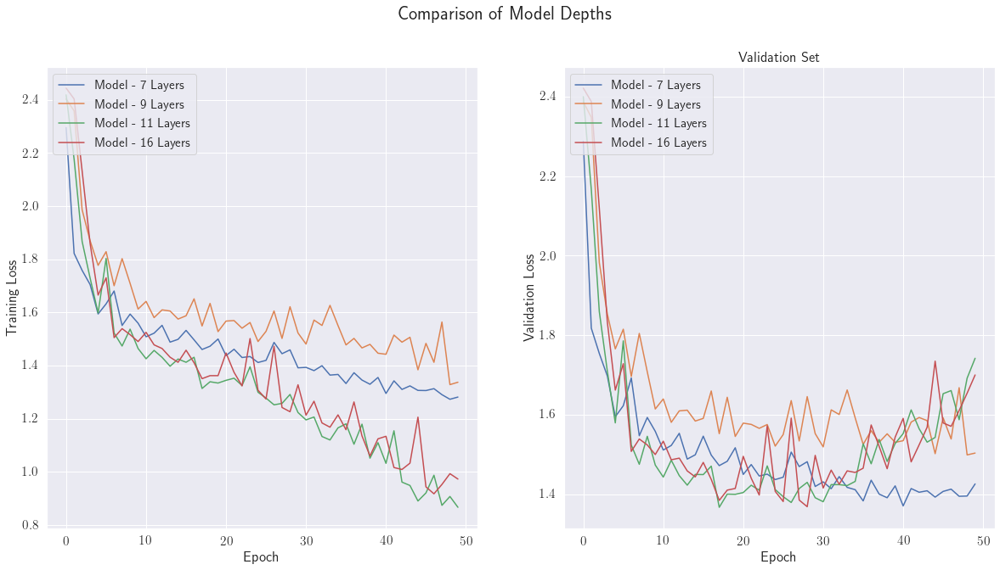

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(20, 10))
axs[0].plot(model_7_bn_result['Training Loss'], label="Model - 7 Layers")
axs[0].plot(model_9_result['Training Loss'], label="Model - 9 Layers")
axs[0].plot(model_11_result['Training Loss'], label="Model - 11 Layers")
axs[0].plot(model_16_result['Training Loss'], label="Model - 16 Layers")
axs[0].set_ylabel("Training Loss")
axs[0].set_xlabel("Epoch")
axs[1].set_title("Training Set")
axs[0].legend(loc="upper left")

axs[1].plot(model_7_bn_result['Validation Loss'], label="Model - 7 Layers")
axs[1].plot(model_9_result['Validation Loss'], label="Model - 9 Layers")
axs[1].plot(model_11_result['Validation Loss'], label="Model - 11 Layers")
axs[1].plot(model_16_result['Validation Loss'], label="Model - 16 Layers")
axs[1].set_ylabel("Validation Loss")
axs[1].set_xlabel("Epoch")
axs[1].set_title("Validation Set")
axs[1].legend(loc="upper left")

fig.suptitle("Comparison of Model Depths")

plt.show()

# Data Augmentation

### Balanced Dataset (2nd Run with Model 16)

#### Training

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
parameters = torch.load(
    '/content/drive/My Drive/Dissertation Files/Models/16layers_FinalEpoch50')
model_balanced = Neural_Network(config='16', batch_norm=True)
model_balanced.load_state_dict(parameters['model'])
model_balanced = model_balanced.float()
model_balanced.to(device)

summary(model_balanced, input_size=(7, 50, 33))
print("Model Loaded")

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 50, 33]           4,096
       BatchNorm2d-2           [-1, 64, 50, 33]             128
              ReLU-3           [-1, 64, 50, 33]               0
            Conv2d-4           [-1, 64, 50, 33]          36,928
       BatchNorm2d-5           [-1, 64, 50, 33]             128
              ReLU-6           [-1, 64, 50, 33]               0
         MaxPool2d-7           [-1, 64, 25, 16]               0
            Conv2d-8          [-1, 128, 25, 16]          73,856
       BatchNorm2d-9          [-1, 128, 25, 16]             256
             ReLU-10          [-1, 128, 25, 16]               0
           Conv2d-11          [-1, 128, 25, 16]         147,584
      BatchNorm2d-12          [-1, 128, 25, 16]             256
             ReLU-13          [-1, 128, 25, 16]               0
        MaxPool2d-14           [-1, 128

In [ ]:
model_balanced_result = run_training(model_balanced,
                              dataset=train_dataset_model,
                              t_loader=train_loader_balanced,
                              v_loader=val_loader,
                              max_epochs=50,
                              flip=False,
                              initial_lr=0.001,
                              pbar=False,
                              checkpoint=False,
                              save_as="7layers_balancing",
                              weight_decay=1e-5)

Epoch: 1
Training   | Avg loss: 1.0514 | Accuracy: 60.79% | Fbeta: 0.4487
Validation | Avg loss: 1.0935 | Accuracy: 59.50% | Fbeta: 0.4385
Epoch: 2
Training   | Avg loss: 0.9985 | Accuracy: 63.47% | Fbeta: 0.4577
Validation | Avg loss: 1.0947 | Accuracy: 58.68% | Fbeta: 0.4375
Epoch: 3
Training   | Avg loss: 0.9758 | Accuracy: 60.42% | Fbeta: 0.3842
Validation | Avg loss: 1.0819 | Accuracy: 56.87% | Fbeta: 0.3688
Epoch: 4
Training   | Avg loss: 0.9899 | Accuracy: 64.02% | Fbeta: 0.4545
Validation | Avg loss: 1.1397 | Accuracy: 55.74% | Fbeta: 0.4030
Epoch: 5
Training   | Avg loss: 0.9044 | Accuracy: 66.84% | Fbeta: 0.4794
Validation | Avg loss: 1.0505 | Accuracy: 60.00% | Fbeta: 0.4460
Epoch: 6
Training   | Avg loss: 0.8917 | Accuracy: 65.97% | Fbeta: 0.4815
Validation | Avg loss: 1.0630 | Accuracy: 58.13% | Fbeta: 0.4172
Epoch: 7
Training   | Avg loss: 0.9160 | Accuracy: 67.38% | Fbeta: 0.4848
Validation | Avg loss: 1.1016 | Accuracy: 58.68% | Fbeta: 0.4236
Epoch: 8
Training   | Avg l

In [ ]:
parameters = torch.load(
    '/content/drive/My Drive/Dissertation Files/Models/16layers_balancing_LowestLossEpoch5'
)
model_balanced.load_state_dict(parameters['model'])

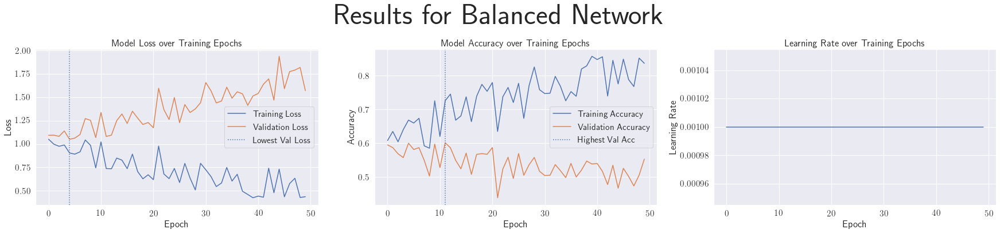

Lowest Validation Loss: 1.0505 - Epoch: 4
Highest Validation Accuracy: 60.1316% - Epoch 11


In [ ]:
plot_results_cl(model_balanced_result, "Results for Balanced Network")

#### Results

In [ ]:
# Train Result
train_dataset_model.flip = False
model_balanced_result_tr = test_classification(model_balanced,
                                               train_dataset_model,
                                               train_dataset_model.n_images,
                                               device)

Overall Accuracy (Top 1, Top 2, Top 3): 80.781176%, 90.374796%, 92.309312%
    
Accuracy: 80.78%
    
Balanced Accuracy: 63.88%
    
F1 Score: 0.79
    

    
              precision    recall  f1-score   support

         0.0       0.87      0.98      0.93      8185
         1.0       0.00      0.00      0.00       290
         2.0       0.00      0.00      0.00       446
         3.0       0.40      0.19      0.26       921
         4.0       0.61      0.63      0.62      2266
         5.0       0.76      0.77      0.76      3311
         6.0       0.86      0.71      0.78      3883
         7.0       0.71      0.64      0.67      3572
         8.0       0.64      0.75      0.69      2916
         9.0       0.73      0.88      0.80      2237
        10.0       0.84      0.95      0.89      2182
        11.0       0.96      0.90      0.93      2440
        12.0       0.93      0.96      0.95      3055
        13.0       0.97      0.91      0.94      1912
        14.0       0.88      0

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
# Test Result
test_dataset.flip = False
model_balanced_results_tst = test_classification(model_balanced, test_dataset,
                                                 test_dataset.n_images, device)

Overall Accuracy (Top 1, Top 2, Top 3): 47.384615%, 54.733728%, 59.207101%
    
Accuracy: 47.38%
    
Balanced Accuracy: 32.35%
    
F1 Score: 0.45
    

    
              precision    recall  f1-score   support

         0.0       0.70      0.77      0.74      3065
         1.0       0.00      0.00      0.00        92
         2.0       0.00      0.00      0.00       222
         3.0       0.02      0.00      0.00       388
         4.0       0.12      0.08      0.09       600
         5.0       0.17      0.25      0.21       680
         6.0       0.21      0.15      0.18       591
         7.0       0.20      0.28      0.23       473
         8.0       0.28      0.36      0.31       428
         9.0       0.37      0.47      0.41       372
        10.0       0.46      0.59      0.52       355
        11.0       0.56      0.51      0.53       418
        12.0       0.66      0.62      0.64       522
        13.0       0.60      0.51      0.55       221
        14.0       0.35      0

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


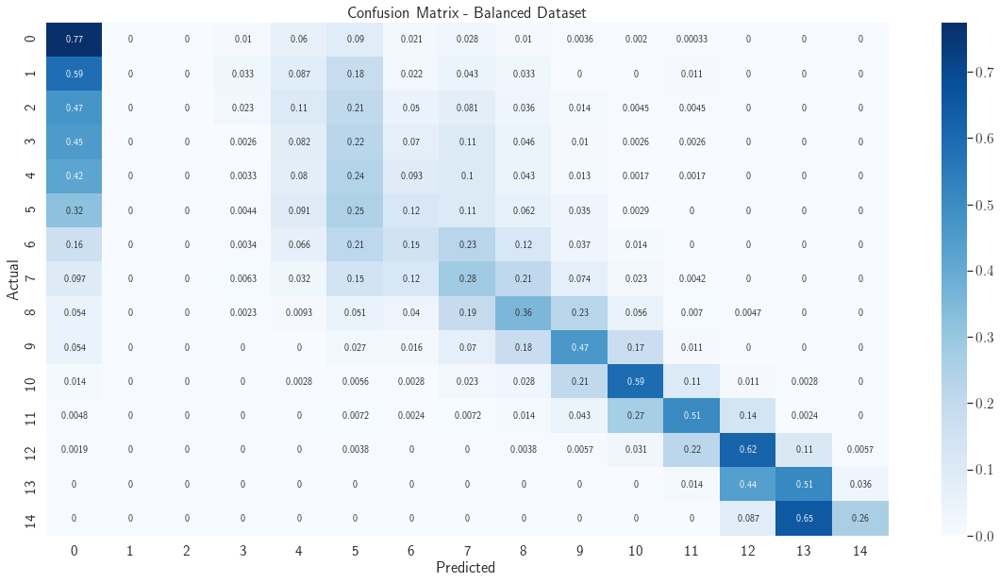

In [ ]:
confusion_matrix(model_balanced_results_tst)
plt.title("Confusion Matrix - Balanced Dataset")
plt.show()

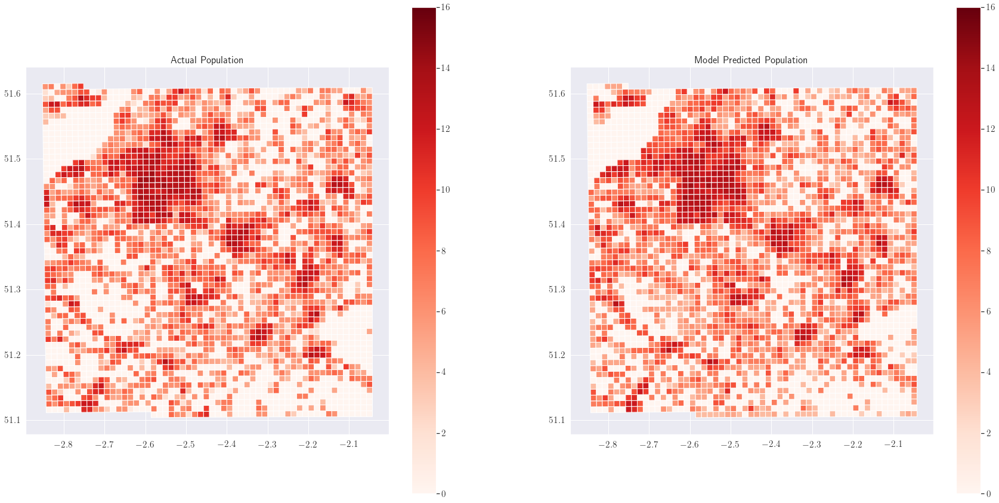

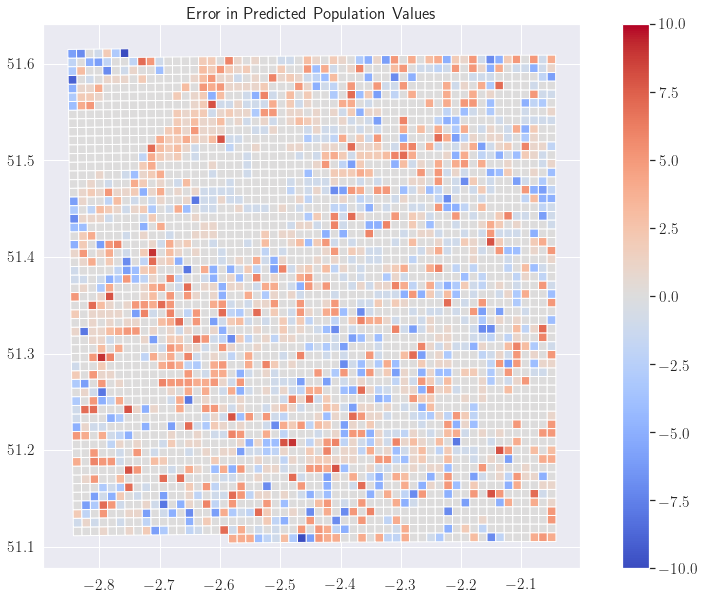

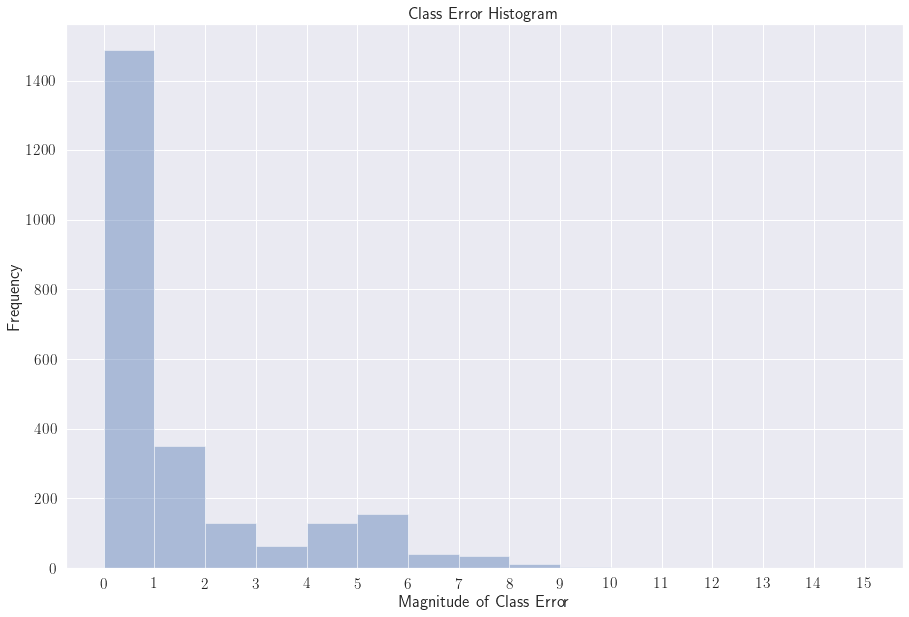

,Index,Population,Pred Class,Actual Class,Class Error,geometry
0,701240,0.0,0,0.0,0.0,"MULTIPOLYGON (((-2.80115 51.17466, -2.80130 51..."
1,701241,0.0,0,0.0,0.0,"MULTIPOLYGON (((-2.78685 51.17475, -2.78700 51..."
2,701242,0.0,0,0.0,0.0,"MULTIPOLYGON (((-2.77254 51.17485, -2.77269 51..."
3,701243,0.0,8,0.0,8.0,"MULTIPOLYGON (((-2.75824 51.17494, -2.75838 51..."
4,701244,0.0,5,0.0,5.0,"MULTIPOLYGON (((-2.74393 51.17504, -2.74407 51..."
...,...,...,...,...,...,...
3120,930,6397.0,13,13.0,0.0,"MULTIPOLYGON (((-2.53257 51.45497, -2.53267 51..."
3121,7290,2815.0,11,12.0,-1.0,"MULTIPOLYGON (((-2.56124 51.44584, -2.56135 51..."
3122,318,9281.0,13,14.0,-1.0,"MULTIPOLYGON (((-2.61892 51.45454, -2.61904 51..."
3123,304,9365.0,13,14.0,-1.0,"MULTIPOLYGON (((-2.61904 51.46353, -2.61916 51..."


In [ ]:
shapefile_cl(model_balanced_results_tst)

### Balanced Dataset (2nd Run with Model 7)

#### Training

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
parameters = torch.load(
    '/content/drive/My Drive/Dissertation Files/Models/7layersbn_FinalEpoch50')
model_balanced2 = Neural_Network(config='7', batch_norm=True)
model_balanced2.load_state_dict(parameters['model'])
model_balanced2 = model_balanced2.float()
model_balanced2.to(device)

summary(model_balanced2, input_size=(7, 50, 33))
print("Model Loaded")

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 50, 33]           4,096
       BatchNorm2d-2           [-1, 64, 50, 33]             128
              ReLU-3           [-1, 64, 50, 33]               0
         MaxPool2d-4           [-1, 64, 25, 16]               0
            Conv2d-5          [-1, 128, 25, 16]          73,856
       BatchNorm2d-6          [-1, 128, 25, 16]             256
              ReLU-7          [-1, 128, 25, 16]               0
         MaxPool2d-8           [-1, 128, 12, 8]               0
            Conv2d-9           [-1, 256, 12, 8]         295,168
      BatchNorm2d-10           [-1, 256, 12, 8]             512
             ReLU-11           [-1, 256, 12, 8]               0
           Conv2d-12           [-1, 256, 12, 8]         590,080
      BatchNorm2d-13           [-1, 256, 12, 8]             512
             ReLU-14           [-1, 256

In [ ]:
model_balanced2_result = run_training(model_balanced2,
                                      dataset=train_dataset_model,
                                      t_loader=train_loader_balanced,
                                      v_loader=val_loader,
                                      max_epochs=20,
                                      flip=False,
                                      initial_lr=0.001,
                                      pbar=False,
                                      checkpoint=False,
                                      save_as="7layers_balancing",
                                      weight_decay=1e-5)

Epoch: 1
Training   | Avg loss: 1.3231 | Accuracy: 52.51% | Fbeta: 0.3668
Validation | Avg loss: 1.3854 | Accuracy: 49.89% | Fbeta: 0.3324
Epoch: 2
Training   | Avg loss: 1.3846 | Accuracy: 51.11% | Fbeta: 0.3152
Validation | Avg loss: 1.4336 | Accuracy: 48.97% | Fbeta: 0.3013
Epoch: 3
Training   | Avg loss: 1.2936 | Accuracy: 53.23% | Fbeta: 0.3784
Validation | Avg loss: 1.3689 | Accuracy: 50.34% | Fbeta: 0.3460
Epoch: 4
Training   | Avg loss: 1.3044 | Accuracy: 54.15% | Fbeta: 0.3918
Validation | Avg loss: 1.3840 | Accuracy: 50.21% | Fbeta: 0.3523
Epoch: 5
Training   | Avg loss: 1.3223 | Accuracy: 52.56% | Fbeta: 0.3749
Validation | Avg loss: 1.3994 | Accuracy: 49.92% | Fbeta: 0.3485
Epoch: 6
Training   | Avg loss: 1.3258 | Accuracy: 53.39% | Fbeta: 0.3487
Validation | Avg loss: 1.4223 | Accuracy: 48.95% | Fbeta: 0.3170
Epoch: 7
Training   | Avg loss: 1.3635 | Accuracy: 51.09% | Fbeta: 0.3711
Validation | Avg loss: 1.4730 | Accuracy: 46.71% | Fbeta: 0.3355
Epoch: 8
Training   | Avg l

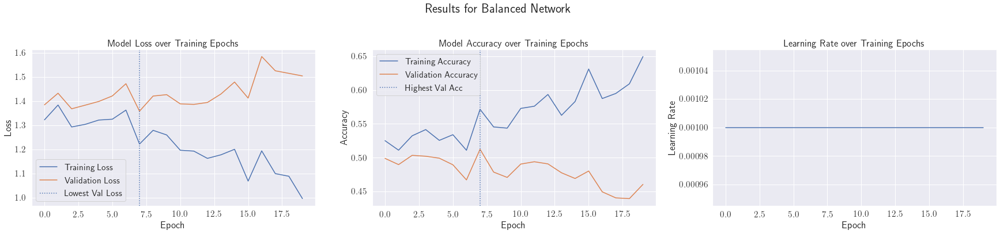

Lowest Validation Loss: 1.3591 - Epoch: 7
Highest Validation Accuracy: 51.2368% - Epoch 7


In [ ]:
plot_results_cl(model_balanced2_result, "Results for Balanced Network")

#### Results

In [ ]:
# Training Result
train_dataset_model.flip = False
model_balanced2_result_tr = test_classification(model_balanced2,
                                                train_dataset_model,
                                                train_dataset_model.n_images,
                                                device)

Overall Accuracy (Top 1, Top 2, Top 3): 62.965205%, 70.958572%, 74.527557%
    
Accuracy: 62.97%
    
Balanced Accuracy: 48.28%
    
F1 Score: 0.62
    

    
              precision    recall  f1-score   support

         0.0       0.84      0.83      0.84      8185
         1.0       1.00      0.01      0.01       290
         2.0       0.00      0.00      0.00       446
         3.0       0.44      0.06      0.10       921
         4.0       0.30      0.42      0.35      2266
         5.0       0.39      0.59      0.47      3311
         6.0       0.53      0.58      0.55      3883
         7.0       0.54      0.57      0.55      3572
         8.0       0.54      0.51      0.52      2916
         9.0       0.54      0.42      0.47      2237
        10.0       0.85      0.52      0.64      2182
        11.0       0.79      0.87      0.83      2440
        12.0       0.86      0.77      0.82      3055
        13.0       0.81      0.82      0.82      1912
        14.0       0.76      0

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
# Test Result
test_dataset.flip = False
model_balanced2_results_tst = test_classification(model_balanced2,
                                                  test_dataset,
                                                  test_dataset.n_images,
                                                  device)

Overall Accuracy (Top 1, Top 2, Top 3): 45.621302%, 54.804734%, 60.982249%
    
Accuracy: 45.62%
    
Balanced Accuracy: 30.69%
    
F1 Score: 0.44
    

    
              precision    recall  f1-score   support

         0.0       0.69      0.73      0.71      3065
         1.0       0.00      0.00      0.00        92
         2.0       0.00      0.00      0.00       222
         3.0       0.05      0.00      0.00       388
         4.0       0.13      0.14      0.13       600
         5.0       0.19      0.32      0.24       680
         6.0       0.24      0.30      0.27       591
         7.0       0.21      0.29      0.24       473
         8.0       0.31      0.26      0.28       428
         9.0       0.33      0.25      0.29       372
        10.0       0.49      0.28      0.36       355
        11.0       0.53      0.61      0.57       418
        12.0       0.69      0.57      0.62       522
        13.0       0.60      0.62      0.61       221
        14.0       0.83      0

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


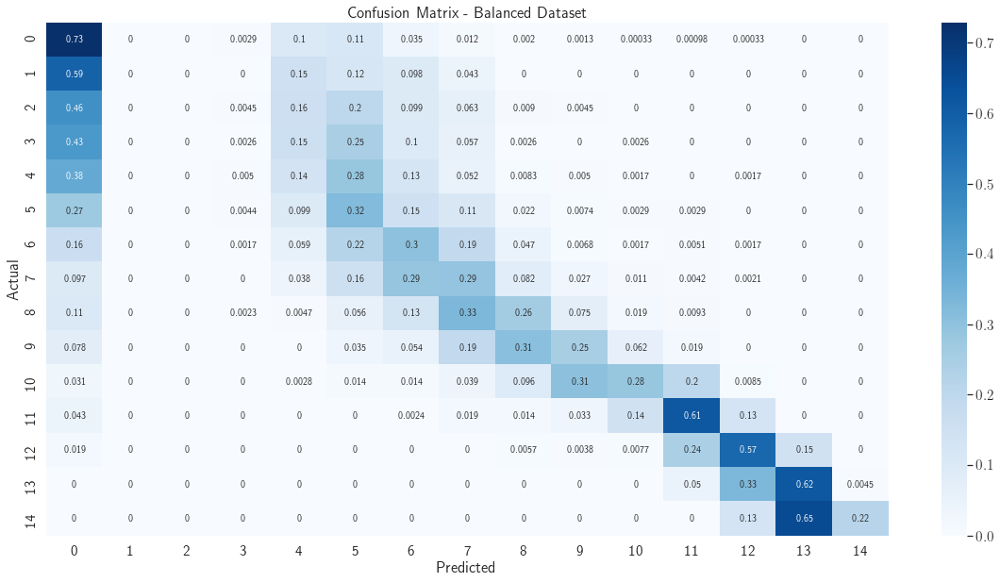

In [ ]:
confusion_matrix(model_balanced2_results_tst)
plt.title("Confusion Matrix - Balanced Dataset")
plt.show()

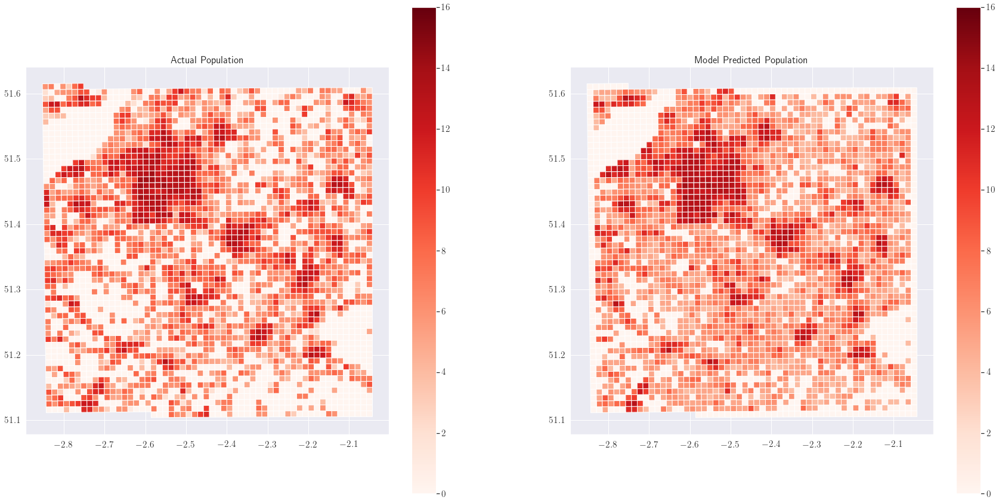

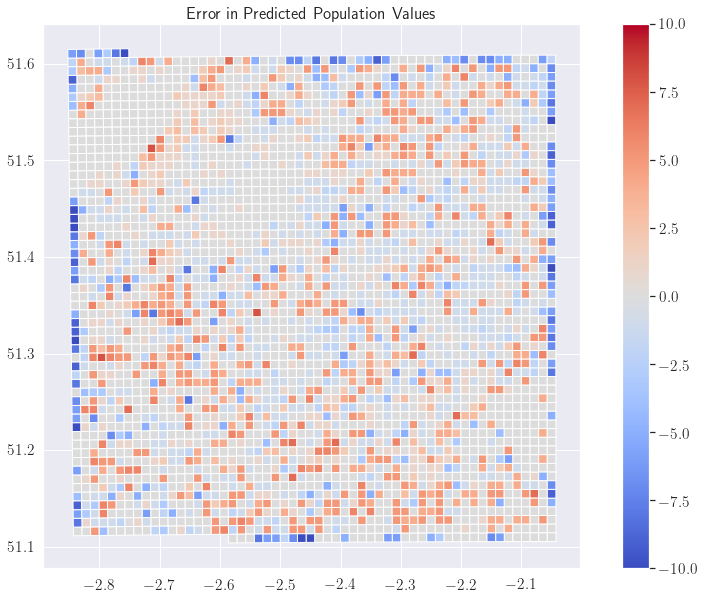

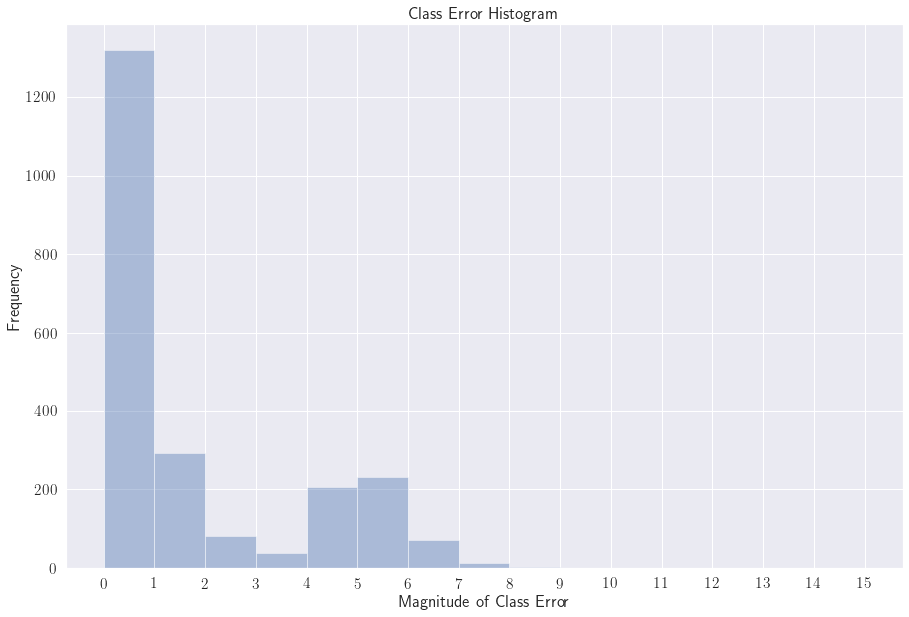

,Index,Population,Pred Class,Actual Class,Class Error,geometry
0,701240,0.0,4,0.0,4.0,"MULTIPOLYGON (((-2.80115 51.17466, -2.80130 51..."
1,701241,0.0,0,0.0,0.0,"MULTIPOLYGON (((-2.78685 51.17475, -2.78700 51..."
2,701242,0.0,5,0.0,5.0,"MULTIPOLYGON (((-2.77254 51.17485, -2.77269 51..."
3,701243,0.0,6,0.0,6.0,"MULTIPOLYGON (((-2.75824 51.17494, -2.75838 51..."
4,701244,0.0,6,0.0,6.0,"MULTIPOLYGON (((-2.74393 51.17504, -2.74407 51..."
...,...,...,...,...,...,...
3120,930,6397.0,13,13.0,0.0,"MULTIPOLYGON (((-2.53257 51.45497, -2.53267 51..."
3121,7290,2815.0,12,12.0,0.0,"MULTIPOLYGON (((-2.56124 51.44584, -2.56135 51..."
3122,318,9281.0,14,14.0,0.0,"MULTIPOLYGON (((-2.61892 51.45454, -2.61904 51..."
3123,304,9365.0,13,14.0,-1.0,"MULTIPOLYGON (((-2.61904 51.46353, -2.61916 51..."


In [ ]:
shapefile_cl(model_balanced2_results_tst)